# Guiding Principles

1. Set up
2. Basic Skeleton
3. Lighter Model
4. Batch Normalization
5. Regularization
6. Global Average Pooling
7. Increasing Capacity
8. Correct MaxPooling Location
9. Image Augmentation
10. Playing naively with Learning Rates

# Concepts

1. How many layers
2. MaxPooling
3. 1x1 Convolutions
4. 3x3 Convolutions
5. Receptive Field
6. SoftMax
7. Learning Rate
8. Kernels and how do we decide the number of kernels?
9. Batch Normalization
10. Image Normalization
11. Position of MaxPooling
12. Concept of Transition Layers
13. Position of Transition Layer
14. DropOut
15. When do we introduce DropOut, or when do we know we have some overfitting
16. The distance of MaxPooling from Prediction
17. The distance of Batch Normalization from Prediction
18. When do we stop convolutions and go ahead with a larger kernel or some other alternative (which we have not yet covered)
19. How do we know our network is not going well, comparatively, very early
20. Batch Size and Effects of Batch Size
21. *(You can add more if we've missed any)*

In [ ]:
!pip install torchinfo

# Read the MNIST dataset
This notebook demonstrates how to train a Convolutional Neural Network (CNN) to recognize handwritten digits from the MNIST dataset using PyTorch with < 20000 parameters, >= 99.4% validation accuracy and < 20 epochs

In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms
from datasets import load_dataset, concatenate_datasets
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import random
import numpy as np
from google.colab import files, drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Load and concatenate datasets
dataset = load_dataset("mnist")

train_dataset = dataset['train']
test_dataset = dataset['test']
combined_dataset = concatenate_datasets([train_dataset, test_dataset])

print(f"Train dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")
print(f"Test dataset size: {len(combined_dataset)}")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/15.6M [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/2.60M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/60000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Train dataset size: 60000
Test dataset size: 10000
Test dataset size: 70000


# Observe the data
Let's look at some random images for each digit to understand what kind of images do we have for them. This will help build some understanding of the structure of data.

## As Is Statistics
Look at the data in the raw form as it exists to identify what is inside it? What ranges of values do we see?

Combined dataset size: 70000
Loaded 70000 MNIST images from concatenated dataset
Processing digit 0...
Processing digit 1...
Processing digit 2...
Processing digit 3...
Processing digit 4...
Processing digit 5...
Processing digit 6...
Processing digit 7...
Processing digit 8...
Processing digit 9...


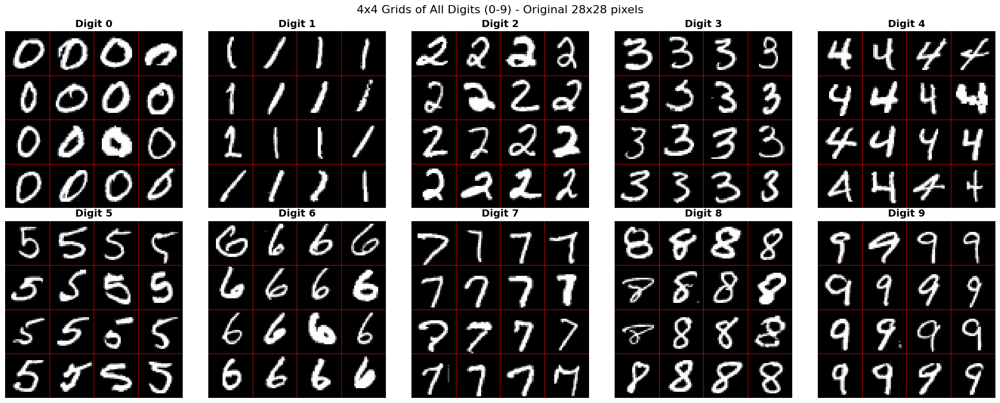

Displayed 4x4 grids of all digits (0-9) side by side with original 28x28 resolution


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
from datasets import load_dataset, concatenate_datasets

# Load MNIST data using Hugging Face datasets
dataset = load_dataset("mnist")
train_dataset = dataset['train']
test_dataset = dataset['test']

# Concatenate train and test datasets
combined_dataset = concatenate_datasets([train_dataset, test_dataset])
print(f"Combined dataset size: {len(combined_dataset)}")

# Convert to numpy arrays
images = []
labels = []

for sample in combined_dataset:
    img_array = np.array(sample['image']) / 255.0  # Normalize to 0-1
    images.append(img_array)
    labels.append(sample['label'])

images = np.array(images)  # Shape: (70000, 28, 28)
labels = np.array(labels)  # Shape: (70000,)
print(f"Loaded {len(images)} MNIST images from concatenated dataset")

# Create all grids in one figure to see them side by side
fig, axes = plt.subplots(2, 5, figsize=(20, 8))  # 2 rows, 5 columns
fig.suptitle('4x4 Grids of All Digits (0-9) - Original 28x28 pixels', fontsize=16)

# Loop through digits 0-9
for digit in range(10):
    print(f"Processing digit {digit}...")

    # Calculate subplot position
    row = digit // 5
    col = digit % 5
    ax = axes[row, col]

    # Find all images of this digit
    digit_indices = np.where(labels == digit)[0]

    if len(digit_indices) < 16:
        print(f"Warning: Only {len(digit_indices)} images available for digit {digit}")
        continue

    # Randomly select 16 images of this digit (4x4 grid)
    random.seed(42 + digit)  # Different seed for each digit
    selected_indices = random.sample(digit_indices.tolist(), 16)

    # Create 4x4 grid with original 28x28 images (no compression)
    grid_size = 4
    tile_size = 28  # Keep original size
    total_size = grid_size * tile_size
    grid_image = np.zeros((total_size, total_size))

    # Fill the grid with selected images (no resizing)
    for i, idx in enumerate(selected_indices):
        grid_row = i // grid_size
        grid_col = i % grid_size

        # Get the original image (no compression)
        img = images[idx]

        # Place in grid at original size
        start_row = grid_row * tile_size
        start_col = grid_col * tile_size
        grid_image[start_row:start_row+tile_size, start_col:start_col+tile_size] = img

    # Display the grid
    ax.imshow(grid_image, cmap='gray')
    ax.set_title(f'Digit {digit}', fontsize=14, fontweight='bold')

    # Add grid lines to separate individual images
    for i in range(1, grid_size):
        ax.axhline(y=i * tile_size - 0.5, color='red', linewidth=1, alpha=0.7)
        ax.axvline(x=i * tile_size - 0.5, color='red', linewidth=1, alpha=0.7)

    ax.axis('off')

plt.tight_layout()
plt.show()

print("Displayed 4x4 grids of all digits (0-9) side by side with original 28x28 resolution")

## Normalized Statistics
Let's normalize the data now and observe what range do they lie across all images



=== Single Image Analysis ===
Randomly selected image at index 14592
Label: 4
Image shape: (28, 28)
Data type: uint8


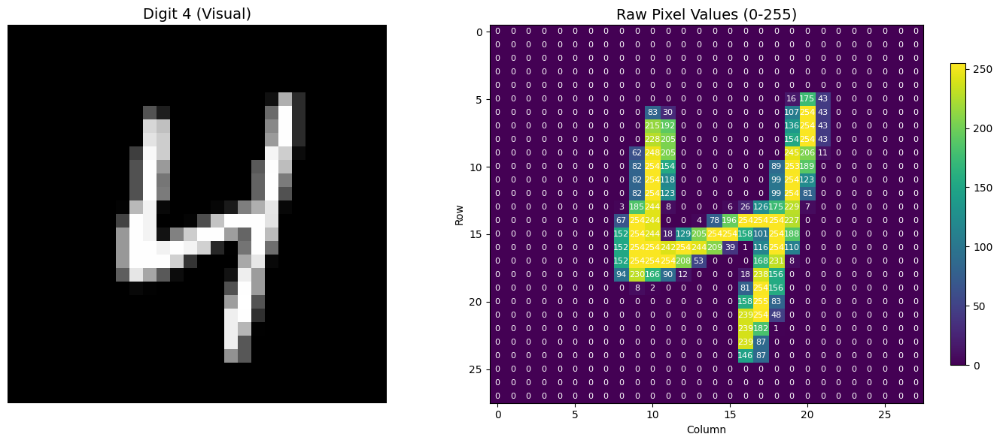


=== Complete Raw 28x28 Matrix (All rows) ===
Row  0:   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
Row  1:   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
Row  2:   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
Row  3:   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
Row  4:   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
Row  5:   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  16 175  43   0   0   0   0   0   0
Row  6:   0   0   0   0   0   0   0   0   0   0  83  30   0   0   0   0   0   0   0 107 254  43   0   0   0   0   0   0
Row  7:   0   0   0   0   0   0   0   0   0   0 215 192   0   0   0   0   0   0   0 136 254  43   0   0   0   0   

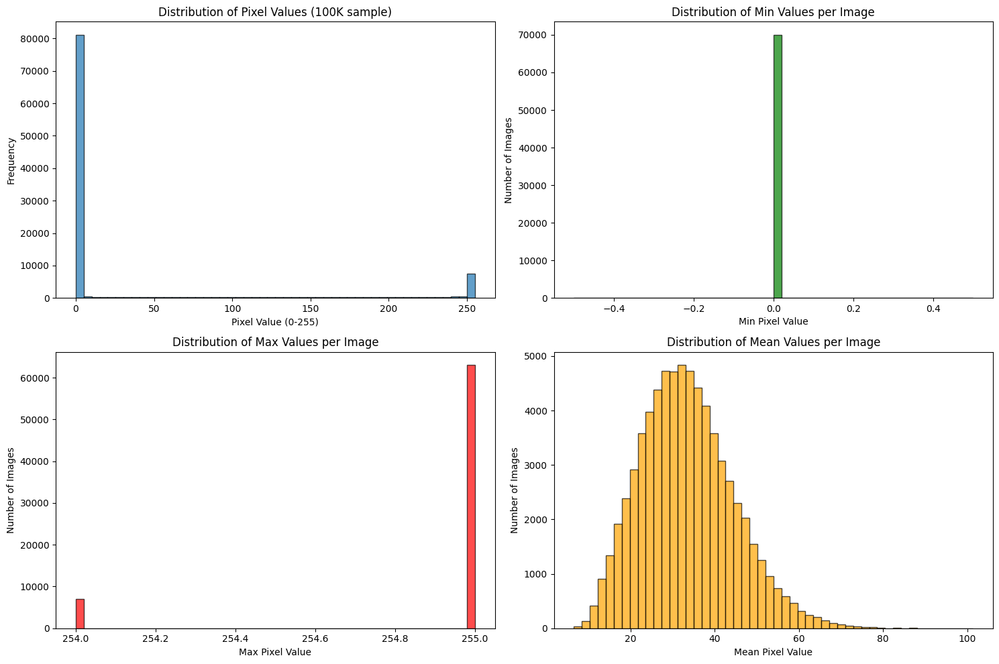

In [ ]:
# Randomly select one image from combined dataset
random.seed(42)
random_idx = random.randint(0, len(combined_dataset) - 1)
sample = combined_dataset[random_idx]

# Get raw image as numpy array (without normalization)
raw_image = np.array(sample['image'])  # Keep original pixel values (0-255)
label = sample['label']

print(f"\n=== Single Image Analysis ===")
print(f"Randomly selected image at index {random_idx}")
print(f"Label: {label}")
print(f"Image shape: {raw_image.shape}")
print(f"Data type: {raw_image.dtype}")

# Display the image and its raw values
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Show the actual image
ax1.imshow(raw_image, cmap='gray')
ax1.set_title(f'Digit {label} (Visual)', fontsize=14)
ax1.axis('off')

# Show the raw values as a heatmap
im = ax2.imshow(raw_image, cmap='viridis', aspect='auto')
ax2.set_title(f'Raw Pixel Values (0-255)', fontsize=14)
ax2.set_xlabel('Column')
ax2.set_ylabel('Row')

# Add colorbar
plt.colorbar(im, ax=ax2, shrink=0.8)

# Add text annotations for some pixel values (center region)
for i in range(0, 28):  # Show 8x8 center region values
    for j in range(0, 28):
        text = ax2.text(j, i, f'{raw_image[i, j]}',
                       ha="center", va="center", color="white", fontsize=8)

plt.tight_layout()
plt.show()

# Print the complete raw 28x28 matrix (all 28 rows)
print(f"\n=== Complete Raw 28x28 Matrix (All rows) ===")
for i in range(28):
    row_str = " ".join(f"{val:3d}" for val in raw_image[i])
    print(f"Row {i:2d}: {row_str}")

# Single image statistics
print(f"\n=== Single Image Statistics ===")
print(f"Min value: {raw_image.min()}")
print(f"Max value: {raw_image.max()}")
print(f"Mean value: {raw_image.mean():.2f}")
print(f"Std deviation: {raw_image.std():.2f}")
print(f"Unique values: {len(np.unique(raw_image))}")
print(f"Non-zero pixels: {np.count_nonzero(raw_image)} / {raw_image.size}")
print(f"Zero pixels: {np.sum(raw_image == 0)} / {raw_image.size}")

# Now analyze the entire dataset - FAST VERSION
print(f"\n=== Full Dataset Analysis (All {len(combined_dataset)} images) ===")
print("Processing all images using vectorized operations...")

# Convert ALL images to numpy arrays at once (fastest approach)
print("Loading all images into memory...")
all_images = []
for sample in combined_dataset:
    all_images.append(np.array(sample['image']))

# Stack into single array: shape (70000, 28, 28)
all_images = np.array(all_images)
print(f"Loaded array shape: {all_images.shape}")

# Vectorized statistics (MUCH faster)
print("Computing statistics...")

# Global statistics across all pixels
global_min = all_images.min()
global_max = all_images.max()
global_mean = all_images.mean()
global_std = all_images.std()

# Per-image statistics (vectorized)
per_image_mins = all_images.min(axis=(1,2))  # Min per image
per_image_maxs = all_images.max(axis=(1,2))  # Max per image
per_image_means = all_images.mean(axis=(1,2))  # Mean per image

# Count unique values efficiently
all_pixels_flat = all_images.flatten()
unique_values = np.unique(all_pixels_flat)

print(f"\n=== Dataset-wide Statistics (FAST) ===")
print(f"Global min value: {global_min}")
print(f"Global max value: {global_max}")
print(f"Global mean value: {global_mean:.2f}")
print(f"Global std deviation: {global_std:.2f}")
print(f"Total unique values: {len(unique_values)}")
print(f"Unique values: {unique_values}")

print(f"\n=== Per-Image Statistics Summary ===")
print(f"Min values - Min: {per_image_mins.min()}, Max: {per_image_mins.max()}, Avg: {per_image_mins.mean():.2f}")
print(f"Max values - Min: {per_image_maxs.min()}, Max: {per_image_maxs.max()}, Avg: {per_image_maxs.mean():.2f}")
print(f"Mean values - Min: {per_image_means.min():.2f}, Max: {per_image_means.max():.2f}, Avg: {per_image_means.mean():.2f}")

# Fast distribution plots using all data
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Overall pixel value distribution (sample for speed)
sample_pixels = np.random.choice(all_pixels_flat, size=100000, replace=False)
axes[0,0].hist(sample_pixels, bins=50, alpha=0.7, edgecolor='black')
axes[0,0].set_title('Distribution of Pixel Values (100K sample)')
axes[0,0].set_xlabel('Pixel Value (0-255)')
axes[0,0].set_ylabel('Frequency')

# Distribution of min values per image
axes[0,1].hist(per_image_mins, bins=50, alpha=0.7, edgecolor='black', color='green')
axes[0,1].set_title('Distribution of Min Values per Image')
axes[0,1].set_xlabel('Min Pixel Value')
axes[0,1].set_ylabel('Number of Images')

# Distribution of max values per image
axes[1,0].hist(per_image_maxs, bins=50, alpha=0.7, edgecolor='black', color='red')
axes[1,0].set_title('Distribution of Max Values per Image')
axes[1,0].set_xlabel('Max Pixel Value')
axes[1,0].set_ylabel('Number of Images')

# Distribution of mean values per image
axes[1,1].hist(per_image_means, bins=50, alpha=0.7, edgecolor='black', color='orange')
axes[1,1].set_title('Distribution of Mean Values per Image')
axes[1,1].set_xlabel('Mean Pixel Value')
axes[1,1].set_ylabel('Number of Images')

plt.tight_layout()
plt.show()


=== Single Image Analysis ===
Randomly selected image at index 14592
Label: 4
Image shape: (28, 28)
Data type: float64


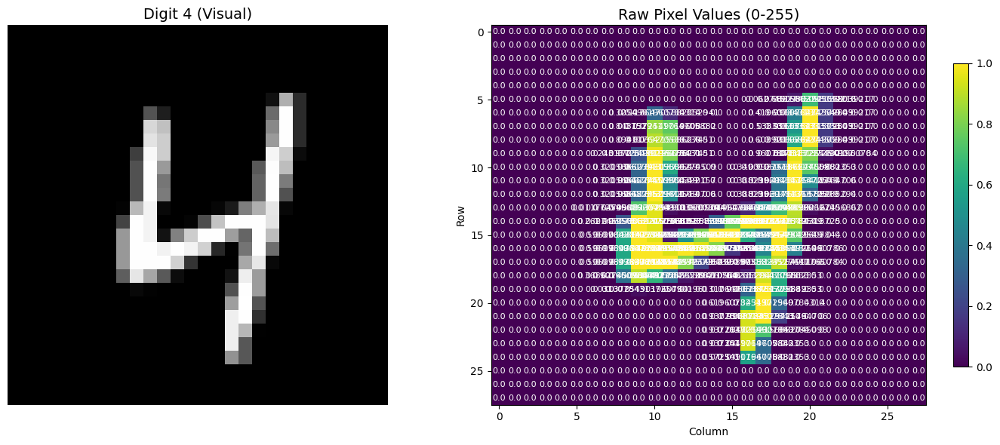


=== Complete Raw 28x28 Matrix (All rows) ===
Row  0: 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
Row  1: 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
Row  2: 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
Row  3: 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
Row  4: 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
Row  5: 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.06 0.69 0.17 0.00 0.00 0.00 0.00 0.00 0.00
Row  6: 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.33 0.1

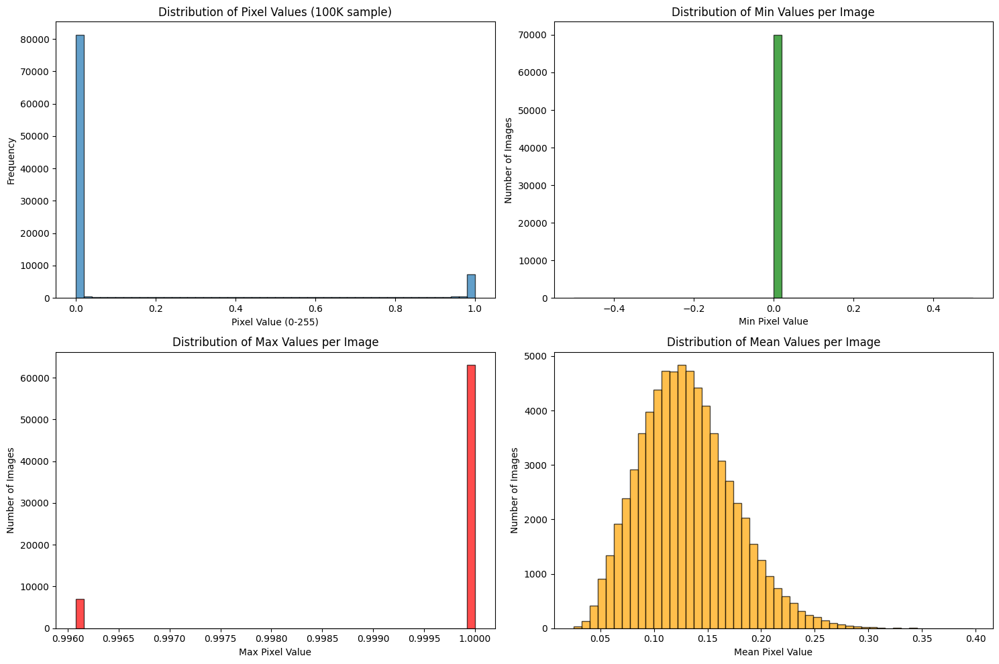

In [ ]:
# Randomly select one image from combined dataset
random.seed(42)
random_idx = random.randint(0, len(combined_dataset) - 1)
sample = combined_dataset[random_idx]

# Get raw image as numpy array (without normalization)
raw_image = np.array(sample['image'])/255.0  # Keep original pixel values (0-255)
label = sample['label']

print(f"\n=== Single Image Analysis ===")
print(f"Randomly selected image at index {random_idx}")
print(f"Label: {label}")
print(f"Image shape: {raw_image.shape}")
print(f"Data type: {raw_image.dtype}")

# Display the image and its raw values
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Show the actual image
ax1.imshow(raw_image, cmap='gray')
ax1.set_title(f'Digit {label} (Visual)', fontsize=14)
ax1.axis('off')

# Show the raw values as a heatmap
im = ax2.imshow(raw_image, cmap='viridis', aspect='auto')
ax2.set_title(f'Raw Pixel Values (0-255)', fontsize=14)
ax2.set_xlabel('Column')
ax2.set_ylabel('Row')

# Add colorbar
plt.colorbar(im, ax=ax2, shrink=0.8)

# Add text annotations for some pixel values (center region)
for i in range(0, 28):  # Show 8x8 center region values
    for j in range(0, 28):
        text = ax2.text(j, i, f'{raw_image[i, j]}',
                       ha="center", va="center", color="white", fontsize=8)

plt.tight_layout()
plt.show()

# Print the complete raw 28x28 matrix (all 28 rows)
print(f"\n=== Complete Raw 28x28 Matrix (All rows) ===")
for i in range(28):
    row_str = " ".join(f"{val:.2f}" for val in raw_image[i])
    print(f"Row {i:2d}: {row_str}")

# Single image statistics
print(f"\n=== Single Image Statistics ===")
print(f"Min value: {raw_image.min():.4f}")
print(f"Max value: {raw_image.max():.4f}")
print(f"Mean value: {raw_image.mean():.4f}")
print(f"Std deviation: {raw_image.std():.4f}")
print(f"Unique values: {len(np.unique(raw_image))}")
print(f"Non-zero pixels: {np.count_nonzero(raw_image)} / {raw_image.size}")
print(f"Zero pixels: {np.sum(raw_image == 0)} / {raw_image.size}")

# Now analyze the entire dataset - FAST VERSION
print(f"\n=== Full Dataset Analysis (All {len(combined_dataset)} images) ===")
print("Processing all images using vectorized operations...")

# Convert ALL images to numpy arrays at once (fastest approach)
print("Loading all images into memory...")
all_images = []
for sample in combined_dataset:
    all_images.append(np.array(sample['image'])/255.0)

# Stack into single array: shape (70000, 28, 28)
all_images = np.array(all_images)
print(f"Loaded array shape: {all_images.shape}")

# Vectorized statistics (MUCH faster)
print("Computing statistics...")

# Global statistics across all pixels
global_min = all_images.min()
global_max = all_images.max()
global_mean = all_images.mean()
global_std = all_images.std()

# Per-image statistics (vectorized)
per_image_mins = all_images.min(axis=(1,2))  # Min per image
per_image_maxs = all_images.max(axis=(1,2))  # Max per image
per_image_means = all_images.mean(axis=(1,2))  # Mean per image

# Count unique values efficiently
all_pixels_flat = all_images.flatten()

print(f"\n=== Dataset-wide Statistics (FAST) ===")
print(f"Global min value: {global_min:.4f}")
print(f"Global max value: {global_max:.4f}")
print(f"Global mean value: {global_mean:.4f}")
print(f"Global std deviation: {global_std:.4f}")
print(f"Total unique values: {len(unique_values)}")

print(f"\n=== Per-Image Statistics Summary ===")
print(f"Min values - Min: {per_image_mins.min()}, Max: {per_image_mins.max()}, Avg: {per_image_mins.mean():.4f}")
print(f"Max values - Min: {per_image_maxs.min()}, Max: {per_image_maxs.max()}, Avg: {per_image_maxs.mean():.4f}")
print(f"Mean values - Min: {per_image_means.min():.2f}, Max: {per_image_means.max():.2f}, Avg: {per_image_means.mean():.4f}")

# Fast distribution plots using all data
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Overall pixel value distribution (sample for speed)
sample_pixels = np.random.choice(all_pixels_flat, size=100000, replace=False)
axes[0,0].hist(sample_pixels, bins=50, alpha=0.7, edgecolor='black')
axes[0,0].set_title('Distribution of Pixel Values (100K sample)')
axes[0,0].set_xlabel('Pixel Value (0-255)')
axes[0,0].set_ylabel('Frequency')

# Distribution of min values per image
axes[0,1].hist(per_image_mins, bins=50, alpha=0.7, edgecolor='black', color='green')
axes[0,1].set_title('Distribution of Min Values per Image')
axes[0,1].set_xlabel('Min Pixel Value')
axes[0,1].set_ylabel('Number of Images')

# Distribution of max values per image
axes[1,0].hist(per_image_maxs, bins=50, alpha=0.7, edgecolor='black', color='red')
axes[1,0].set_title('Distribution of Max Values per Image')
axes[1,0].set_xlabel('Max Pixel Value')
axes[1,0].set_ylabel('Number of Images')

# Distribution of mean values per image
axes[1,1].hist(per_image_means, bins=50, alpha=0.7, edgecolor='black', color='orange')
axes[1,1].set_title('Distribution of Mean Values per Image')
axes[1,1].set_xlabel('Mean Pixel Value')
axes[1,1].set_ylabel('Number of Images')

plt.tight_layout()
plt.show()

In [ ]:
# the most important information we get from this is the global mean and standard deviation
print(f"Global mean value: {global_mean:.4f}")
print(f"Global std deviation: {global_std:.4f}")

Global mean value: 0.1309
Global std deviation: 0.3084


# Setup
This section sets up the dataset, dataloader, train and test scripts to be used across various models

## Load Data
Get the data into data loaders to be used for training the model.

In [ ]:
GLOBAL_MEAN = global_mean
GLOBAL_STDDEV = global_std

In [ ]:
class MNISTDataset(Dataset):
    def __init__(self, data, transform):
        self.data = data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample = self.data[idx]
        image = sample["image"]
        label = sample["label"]

        if self.transform:
            image = self.transform(image)
        return image, label

    def __repr__(self):
        return f"MNISTDataset(data={len(self.data)})"

In [ ]:
# Define transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((GLOBAL_MEAN,), (GLOBAL_STDDEV,))
])

# Create custom datasets
train_dataset = MNISTDataset(train_dataset, transform)
test_dataset = MNISTDataset(test_dataset, transform)

# Create DataLoaders
batch_size = 100
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

## Train Setup
Create a skeleton for training where we can pass the model and data to get the results

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np

def calculate_receptive_field(model):
    """Calculate final receptive field for the model"""
    rf = 1  # Initial receptive field
    stride = 1  # Initial stride

    for name, layer in model.named_modules():
        if isinstance(layer, nn.Conv2d):
            kernel_size = layer.kernel_size[0] if isinstance(layer.kernel_size, tuple) else layer.kernel_size
            layer_stride = layer.stride[0] if isinstance(layer.stride, tuple) else layer.stride

            # Calculate new receptive field
            rf = rf + (kernel_size - 1) * stride
            stride = stride * layer_stride

        elif isinstance(layer, (nn.MaxPool2d, nn.AvgPool2d)):
            kernel_size = layer.kernel_size if isinstance(layer.kernel_size, int) else layer.kernel_size[0]
            layer_stride = layer.stride if isinstance(layer.stride, int) else layer.stride[0]

            # Update receptive field for pooling
            rf = rf + (kernel_size - 1) * stride
            stride = stride * layer_stride

    return rf

def analyze_with_torchinfo(model, input_size=(1, 1, 28, 28), device='cuda'):
    """
    Using torchinfo - shows only the final summary stats with receptive field
    """
    try:
        from torchinfo import summary as torchinfo_summary

        device = device if torch.cuda.is_available() else 'cpu'
        model_copy = model.to(device)

        # Get summary with verbose=0 to show only final stats
        summary_stats = torchinfo_summary(
            model_copy,
            input_size=input_size,
            verbose=0  # This shows only the summary stats at the end
        )

        # Calculate and display receptive field
        rf = calculate_receptive_field(model_copy)
        print(f"Final Receptive Field: {rf} pixels")

        return summary_stats

    except ImportError:
        print("torchinfo not installed. Install with: pip install torchinfo")
        return None
    except Exception as e:
        print(f"Error with torchinfo: {e}")
        return None

def evaluate_accuracy(model, test_loader, device):
    """Evaluate model accuracy"""
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return 100 * correct / total

def plot_final_training_results(epoch_losses, batch_losses, batch_epochs, train_accuracies, test_accuracies):
    """Plot final training results with epoch losses, batch losses, and accuracies"""
    fig = plt.figure(figsize=(20, 12))

    # Create a 2x2 grid of subplots
    ax1 = plt.subplot(2, 2, 1)  # Average Loss per Epoch
    ax2 = plt.subplot(2, 2, 2)  # Batch Loss (showing jitteriness)
    ax3 = plt.subplot(2, 2, 3)  # Model Accuracy
    ax4 = plt.subplot(2, 2, 4)  # Loss Statistics/Analysis

    epochs = list(range(1, len(epoch_losses) + 1))

    # 1. Plot Average Loss per Epoch
    ax1.plot(epochs, epoch_losses, 'b-', linewidth=3, marker='o', markersize=6,
             markerfacecolor='white', markeredgecolor='blue', markeredgewidth=2)
    ax1.set_title('Average Loss per Epoch', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Average Loss', fontsize=12)
    ax1.grid(True, alpha=0.3)
    ax1.set_xlim(0.5, len(epoch_losses) + 0.5)

    # Add min loss annotation
    min_loss_idx = np.argmin(epoch_losses)
    ax1.annotate(f'Min Avg Loss: {epoch_losses[min_loss_idx]:.4f}\nEpoch {min_loss_idx + 1}',
                xy=(min_loss_idx + 1, epoch_losses[min_loss_idx]),
                xytext=(min_loss_idx + 1 + len(epochs)*0.15, epoch_losses[min_loss_idx] + max(epoch_losses)*0.1),
                arrowprops=dict(arrowstyle='->', color='red', lw=1.5),
                bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.8),
                fontsize=10)

    # 2. Plot Batch Loss (showing jitteriness)
    ax2.plot(batch_epochs, batch_losses, 'r-', linewidth=0.8, alpha=0.7)
    # Add moving average for trend
    window_size = min(50, len(batch_losses) // 10)  # Adaptive window size
    if len(batch_losses) > window_size:
        moving_avg = np.convolve(batch_losses, np.ones(window_size)/window_size, mode='valid')
        moving_avg_epochs = batch_epochs[window_size-1:]
        ax2.plot(moving_avg_epochs, moving_avg, 'darkred', linewidth=2.5,
                label=f'Moving Average (window={window_size})')
        ax2.legend()

    ax2.set_title('Batch Loss Over Time (Jitteriness Analysis)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Batch Loss', fontsize=12)
    ax2.grid(True, alpha=0.3)

    # Add jitteriness statistics
    loss_std = np.std(batch_losses)
    loss_mean = np.mean(batch_losses)
    ax2.text(0.02, 0.98, f'Loss Std Dev: {loss_std:.4f}\nMean Loss: {loss_mean:.4f}\nCoV: {loss_std/loss_mean:.3f}',
             transform=ax2.transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='lightcoral', alpha=0.8),
             fontsize=10)

    # 3. Plot Model Accuracy
    if train_accuracies and test_accuracies:
        ax3.plot(epochs, train_accuracies, 'g-', linewidth=2.5, marker='s', markersize=5,
                 markerfacecolor='white', markeredgecolor='green', markeredgewidth=2, label='Train Accuracy')
        ax3.plot(epochs, test_accuracies, 'r-', linewidth=2.5, marker='^', markersize=5,
                 markerfacecolor='white', markeredgecolor='red', markeredgewidth=2, label='Test Accuracy')

        # Add max accuracy annotations
        max_train_idx = np.argmax(train_accuracies)
        max_test_idx = np.argmax(test_accuracies)

        ax3.annotate(f'Best Train: {train_accuracies[max_train_idx]:.2f}%\nEpoch {max_train_idx + 1}',
                    xy=(max_train_idx + 1, train_accuracies[max_train_idx]),
                    xytext=(max_train_idx + 1 - len(epochs)*0.2, train_accuracies[max_train_idx] - 8),
                    arrowprops=dict(arrowstyle='->', color='green', lw=1.5),
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='lightgreen', alpha=0.8),
                    fontsize=10)

        ax3.annotate(f'Best Test: {test_accuracies[max_test_idx]:.2f}%\nEpoch {max_test_idx + 1}',
                    xy=(max_test_idx + 1, test_accuracies[max_test_idx]),
                    xytext=(max_test_idx + 1 + len(epochs)*0.15, test_accuracies[max_test_idx] - 8),
                    arrowprops=dict(arrowstyle='->', color='red', lw=1.5),
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='lightcoral', alpha=0.8),
                    fontsize=10)

        ax3.legend(fontsize=11)

    ax3.set_title('Model Accuracy Over All Epochs', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Epoch', fontsize=12)
    ax3.set_ylabel('Accuracy (%)', fontsize=12)
    ax3.grid(True, alpha=0.3)
    ax3.set_xlim(0.5, len(epoch_losses) + 0.5)
    ax3.set_ylim(0, 100)

    # 4. Loss Analysis and Statistics
    ax4.hist(batch_losses, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
    ax4.axvline(loss_mean, color='red', linestyle='--', linewidth=2, label=f'Mean: {loss_mean:.4f}')
    ax4.axvline(loss_mean + loss_std, color='orange', linestyle='--', linewidth=2, label=f'Mean + Std: {loss_mean + loss_std:.4f}')
    ax4.axvline(loss_mean - loss_std, color='orange', linestyle='--', linewidth=2, label=f'Mean - Std: {loss_mean - loss_std:.4f}')

    ax4.set_title('Batch Loss Distribution', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Loss Value', fontsize=12)
    ax4.set_ylabel('Frequency', fontsize=12)
    ax4.legend()
    ax4.grid(True, alpha=0.3)

    # Add statistics text
    stats_text = f"""Training Stability Analysis:
• Total Batches: {len(batch_losses)}
• Loss Range: {min(batch_losses):.4f} - {max(batch_losses):.4f}
• Coefficient of Variation: {loss_std/loss_mean:.3f}
• {'Low Jitter' if loss_std/loss_mean < 0.5 else 'High Jitter' if loss_std/loss_mean > 1.0 else 'Moderate Jitter'}
"""
    ax4.text(0.02, 0.98, stats_text, transform=ax4.transAxes, verticalalignment='top',
             bbox=dict(boxstyle='round,pad=0.5', facecolor='lightyellow', alpha=0.9),
             fontsize=9, fontfamily='monospace')

    plt.tight_layout()
    plt.show()

def train(model, train_loader, test_loader, num_epochs=20, input_size=(1, 1, 28, 28)):
    """
    Training function that shows charts only at the end with all epochs

    Args:
        model: PyTorch model to train
        train_loader: Training data loader
        test_loader: Test data loader
        num_epochs: Number of epochs to train
        input_size: Input tensor size for model summary
    """
    # Device configuration
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Move model to device
    model = model.to(device)

    # Show only summary stats
    analyze_with_torchinfo(model, input_size)

    # Create optimizer
    # optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)

    # Lists to store metrics for plotting
    epoch_losses = []
    batch_losses = []  # Store individual batch losses
    batch_epochs = []  # Store which epoch each batch belongs to
    train_accuracies = []
    test_accuracies = []

    print(f"\nStarting Training...")
    print(f"Total Epochs: {num_epochs}")
    print(f"Optimizer: Adam (lr=0.001)")
    print("-" * 80)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0
        num_batches = 0

        for i, (images, labels) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = torch.nn.functional.cross_entropy(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Store batch loss and epoch info for jitter analysis
            batch_losses.append(loss.item())
            batch_epochs.append(epoch + 1 + i / len(train_loader))  # Fractional epoch for smooth plotting

            epoch_loss += loss.item()
            num_batches += 1

            if i % 100 == 0:
                print(f"Epoch {epoch+1:2d}/{num_epochs}, Batch {i//100:3d}, Records: {i*len(images):5d}, Loss: {loss.item():.4f}")

        # Calculate average epoch loss
        avg_loss = epoch_loss / num_batches
        epoch_losses.append(avg_loss)

        # Evaluate both training and test accuracy
        train_accuracy = evaluate_accuracy(model, train_loader, device)
        test_accuracy = evaluate_accuracy(model, test_loader, device)

        train_accuracies.append(train_accuracy)
        test_accuracies.append(test_accuracy)

        print(f"Epoch {epoch+1:2d} Summary - Avg Loss: {avg_loss:.4f}, Train Acc: {train_accuracy:.2f}%, Test Acc: {test_accuracy:.2f}%")
        print("-" * 80)

        # Early stopping condition (adjust as needed)
        if epoch > 0 and epoch % 15 == 0:
            break

    # Show final training charts with all epochs
    print(f"\nTraining completed! Displaying final results...")
    plot_final_training_results(epoch_losses, batch_losses, batch_epochs, train_accuracies, test_accuracies)

    print(f"\nFinal Training Summary:")
    print(f"  - Final Loss: {epoch_losses[-1]:.4f}")
    print(f"  - Final Train Accuracy: {train_accuracies[-1]:.2f}%")
    print(f"  - Final Test Accuracy: {test_accuracies[-1]:.2f}%")
    print(f"  - Best Test Accuracy: {max(test_accuracies):.2f}% (Epoch {test_accuracies.index(max(test_accuracies)) + 1})")
    print(f"  - Batch Loss Std Dev: {np.std(batch_losses):.4f} (Lower = Less Jittery)")

    return model, {
        'epoch_losses': epoch_losses,
        'batch_losses': batch_losses,
        'batch_epochs': batch_epochs,
        'train_accuracies': train_accuracies,
        'test_accuracies': test_accuracies
    }

# Alternative function for plotting from saved history
def plot_training_history(training_history):
    """Plot training results from saved history dictionary"""
    plot_final_training_results(
        training_history['losses'],
        training_history['train_accuracies'],
        training_history['test_accuracies']
    )

## Test Setup
This section contains the code that we will use to analyze the images from the trained model to identify the next steps in training

In [ ]:
# Enhanced version with linear layer support
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np

def load_trained_model(model):
    """Load a trained model from checkpoint"""
    try:
        model.eval()
        return model
    except:
        print("Using current model in memory...")
        return model

def get_sample_images_per_digit(test_loader, num_digits=5):
    """Get one sample image for each of the first num_digits"""
    digit_samples = {}
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)

            for i in range(len(labels)):
                digit = labels[i].item()
                if digit < num_digits and digit not in digit_samples:
                    digit_samples[digit] = {
                        'image': images[i:i+1],  # Keep batch dimension
                        'label': digit
                    }

                # Stop when we have all digits
                if len(digit_samples) == num_digits:
                    return digit_samples

    return digit_samples

def extract_layer_features(model, input_image):
    """Extract features at each layer of the model - handles both architectures"""
    features = {}
    layer_names = []
    x = input_image

    # Go through each layer in conv1 sequential
    for i, layer in enumerate(model.conv1):
        x = layer(x)
        layer_name = f"Conv_Layer_{i}_{layer.__class__.__name__}"
        features[layer_name] = x.clone().detach()
        layer_names.append(layer_name)

    # Check if model has GAP (BasicMNISTModel)
    if hasattr(model, 'gap'):
        x = model.gap(x)
        features['GAP'] = x.clone().detach()
        layer_names.append('GAP')

        # Flatten and BatchNorm for BasicMNISTModel
        x = x.view(x.size(0), -1)

        if hasattr(model, 'norm'):
            x = model.norm(x)
            features['Final_BatchNorm'] = x.clone().detach()
            layer_names.append('Final_BatchNorm')

        features['Final_Output'] = x.clone().detach()
        layer_names.append('Final_Output')

    # Check if model has linear layers (Wk5MNISTModel)
    elif hasattr(model, 'linear'):
        # Flatten before linear layers
        x = torch.flatten(x, start_dim=1)
        features['Flattened'] = x.clone().detach()
        layer_names.append('Flattened')

        # Go through each layer in linear sequential
        for i, layer in enumerate(model.linear):
            x = layer(x)
            layer_name = f"Linear_Layer_{i}_{layer.__class__.__name__}"
            features[layer_name] = x.clone().detach()
            layer_names.append(layer_name)

        features['Final_Output'] = x.clone().detach()
        layer_names.append('Final_Output')

    return features, layer_names

def add_value_annotations(ax, data, max_annotations=100, fontsize=6):
    """Add numerical values as text overlay on the image"""
    if len(data.shape) == 2:
        h, w = data.shape
        # Only annotate if the image is small enough or subsample
        if h * w <= max_annotations:
            for i in range(h):
                for j in range(w):
                    value = data[i, j]
                    # Choose text color based on background
                    color = 'white' if value < data.max() * 0.5 else 'black'
                    ax.text(j, i, f'{value:.2f}', ha='center', va='center',
                           fontsize=fontsize, color=color, weight='bold')
        else:
            # For larger images, show values at regular intervals
            step_i = max(1, h // 8)
            step_j = max(1, w // 8)
            for i in range(0, h, step_i):
                for j in range(0, w, step_j):
                    value = data[i, j]
                    color = 'white' if value < data.max() * 0.5 else 'black'
                    ax.text(j, i, f'{value:.1f}', ha='center', va='center',
                           fontsize=fontsize-1, color=color, weight='bold')

def visualize_layer_activations_with_values(model, digit_samples):
    """Enhanced visualization that handles both GAP and Linear layers"""
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    # Determine model type for title
    model_type = "BasicMNISTModel" if hasattr(model, 'gap') else "Wk5MNISTModel"

    # Get features for each digit
    all_features = {}
    layer_names = None

    with torch.no_grad():
        for digit, sample in digit_samples.items():
            features, layer_names = extract_layer_features(model, sample['image'])
            all_features[digit] = features

    # Create visualization
    num_layers = len(layer_names)
    num_digits = len(digit_samples)

    fig, axes = plt.subplots(num_digits, num_layers, figsize=(5*num_layers, 5*num_digits))
    fig.suptitle(f'{model_type} - Layer Activations with Values for Different Digits (0-4)', fontsize=16)

    for digit_idx, (digit, sample) in enumerate(digit_samples.items()):
        for layer_idx, layer_name in enumerate(layer_names):
            ax = axes[digit_idx, layer_idx] if num_digits > 1 else axes[layer_idx]

            feature_map = all_features[digit][layer_name].cpu().squeeze()

            # Handle different layer types
            if layer_name == 'Final_Output':
                # For final output, show as bar chart with values
                values = feature_map.detach().numpy()
                bars = ax.bar(range(10), values)
                predicted_class = torch.argmax(feature_map).item()
                ax.set_title(f'Digit {digit}\n{layer_name}\nPredicted: {predicted_class}')
                ax.set_xlabel('Class')
                ax.set_ylabel('Activation')
                ax.set_xticks(range(10))

                # Add value labels on bars
                for i, (bar, val) in enumerate(zip(bars, values)):
                    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                           f'{val:.3f}', ha='center', va='bottom', fontsize=8, weight='bold')

            elif layer_name == 'GAP':
                # For GAP, show as bar chart with values
                feature_map = feature_map.squeeze()
                values = feature_map.detach().numpy()
                bars = ax.bar(range(len(feature_map)), values)
                ax.set_title(f'Digit {digit}\n{layer_name}\nChannels: {len(values)}')
                ax.set_xlabel('Channel')
                ax.set_ylabel('Activation')

                # Add value labels on bars
                for i, (bar, val) in enumerate(zip(bars, values)):
                    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001,
                           f'{val:.3f}', ha='center', va='bottom', fontsize=7,
                           rotation=45 if len(values) > 5 else 0)

            elif 'Linear_Layer' in layer_name or layer_name == 'Flattened' or layer_name == 'Final_BatchNorm':
                # For linear layers and flattened features, show as line plot with values
                values = feature_map.detach().numpy()

                if len(values) <= 50:  # For smaller vectors, show all values
                    ax.plot(values, 'o-', markersize=4, linewidth=2)
                    ax.set_title(f'Digit {digit}\n{layer_name}\nSize: {len(values)}\n'
                               f'Min: {values.min():.3f}, Max: {values.max():.3f}')
                    ax.set_xlabel('Neuron Index')
                    ax.set_ylabel('Activation')
                    ax.grid(True, alpha=0.3)

                    # Add value annotations for every few points
                    step = max(1, len(values) // 15)
                    for i in range(0, len(values), step):
                        ax.annotate(f'{values[i]:.2f}', (i, values[i]),
                                  textcoords="offset points", xytext=(0,10), ha='center',
                                  fontsize=6, weight='bold')
                else:  # For larger vectors, show as histogram
                    ax.hist(values, bins=30, alpha=0.7, edgecolor='black')
                    ax.set_title(f'Digit {digit}\n{layer_name}\nSize: {len(values)}\n'
                               f'Min: {values.min():.3f}, Max: {values.max():.3f}\nMean: {values.mean():.3f}')
                    ax.set_xlabel('Activation Value')
                    ax.set_ylabel('Frequency')
                    ax.grid(True, alpha=0.3)

            else:
                # For conv layers, show with pixel values overlaid
                if len(feature_map.shape) == 3:  # [C, H, W]
                    if feature_map.shape[0] <= 3:
                        # Show first channel or RGB-like if 3 or fewer channels
                        display_map = feature_map[0]
                    else:
                        # Show average across first few channels
                        display_map = torch.mean(feature_map[:min(3, feature_map.shape[0])], dim=0)
                elif len(feature_map.shape) == 2:  # [H, W]
                    display_map = feature_map
                else:
                    display_map = feature_map.view(-1)  # Flatten

                if len(display_map.shape) == 1:
                    # For 1D data, plot with value annotations
                    values = display_map.detach().numpy()
                    ax.plot(values, 'o-', markersize=4)
                    # Add value annotations for every few points
                    step = max(1, len(values) // 20)
                    for i in range(0, len(values), step):
                        ax.annotate(f'{values[i]:.2f}', (i, values[i]),
                                  textcoords="offset points", xytext=(0,10), ha='center',
                                  fontsize=6)
                else:
                    # For 2D data, show image with value overlay
                    display_array = display_map.detach().numpy()
                    im = ax.imshow(display_array, cmap='viridis', aspect='auto')
                    plt.colorbar(im, ax=ax, shrink=0.5)

                    # Add numerical value overlay
                    add_value_annotations(ax, display_array,
                                        max_annotations=64 if display_array.size <= 64 else 25,
                                        fontsize=7 if display_array.size <= 64 else 5)

                ax.set_title(f'Digit {digit}\n{layer_name}\nShape: {list(feature_map.shape)}\n'
                           f'Min: {feature_map.min().item():.3f}, Max: {feature_map.max().item():.3f}')

    plt.tight_layout()
    plt.show()

def show_input_with_values(digit_samples, global_mean, global_stddev):
    """Show original input images with pixel values overlaid"""
    print("\nOriginal Images with Pixel Values:")
    fig, axes = plt.subplots(2, len(digit_samples), figsize=(4*len(digit_samples), 8))
    if len(digit_samples) == 1:
        axes = axes.reshape(-1, 1)

    for i, (digit, sample) in enumerate(digit_samples.items()):
        # Normalized image (as fed to model)
        normalized_img = sample['image'].cpu().squeeze().detach().numpy()

        # Denormalized image (for display)
        denormalized_img = normalized_img * global_stddev + global_mean

        # Top row: normalized values
        ax_norm = axes[0, i]
        im1 = ax_norm.imshow(normalized_img, cmap='gray', vmin=-3, vmax=3)
        ax_norm.set_title(f'Digit {digit} (Normalized Input)')
        plt.colorbar(im1, ax=ax_norm, shrink=0.5)

        # Add normalized value overlay
        add_value_annotations(ax_norm, normalized_img, max_annotations=100, fontsize=6)

        # Bottom row: denormalized values
        ax_denorm = axes[1, i]
        im2 = ax_denorm.imshow(denormalized_img, cmap='gray', vmin=0, vmax=1)
        ax_denorm.set_title(f'Digit {digit} (Original Pixel Values)')
        plt.colorbar(im2, ax=ax_denorm, shrink=0.5)

        # Add denormalized value overlay
        add_value_annotations(ax_denorm, denormalized_img, max_annotations=100, fontsize=6)

    plt.tight_layout()
    plt.show()

def analyze_model_layers_with_values(model, test_loader, global_mean, global_stddev):
    """Main function to analyze model layers with pixel values - supports both architectures"""

    # Determine model type for saving
    model_type = "BasicMNISTModel" if hasattr(model, 'gap') else "Wk5MNISTModel"
    save_path = f'{model_type.lower()}_model.pth'

    # First save the current model if not already saved
    try:
        torch.save({
            'model_state_dict': model.state_dict(),
            'model_class': model_type,
            'global_mean': global_mean,
            'global_stddev': global_stddev
        }, save_path)
        print(f"{model_type} saved successfully to {save_path}!")
    except Exception as e:
        print(f"Could not save model: {e} - proceeding with existing model...")

    # Load the trained model
    loaded_model = load_trained_model(model)

    # Get sample images
    print("Getting sample images for digits 0-4...")
    digit_samples = get_sample_images_per_digit(test_loader, num_digits=5)

    if len(digit_samples) < 5:
        print(f"Warning: Only found {len(digit_samples)} different digits in test data")

    print(f"Found samples for digits: {list(digit_samples.keys())}")

    # Show original images with values
    show_input_with_values(digit_samples, global_mean, global_stddev)

    # Analyze layer activations with values
    print(f"\nAnalyzing {model_type} layer activations with pixel values...")
    visualize_layer_activations_with_values(loaded_model, digit_samples)

# Batch Size
Finding the right batch size for our problem is important, we will try 4 variants on a base model and see which one works the best. At this stage we don't care about the size of the network.

In [ ]:
class MNISTModel(nn.Module):
    """Replace only the last max pooling with 1x1 conv, keep the first max pooling"""
    def __init__(self):
        super(MNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same'),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(8, 16, kernel_size=3, padding='same'),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(32, 64, kernel_size=1, padding='same'),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 10, kernel_size=1, padding='same')
        )

        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 7, 7]
        x = self.gap(x)                # Shape: [batch, 10, 1, 1]
        x = x.view(x.size(0), -1)      # Shape: [batch, 10] - Flatten
        return x

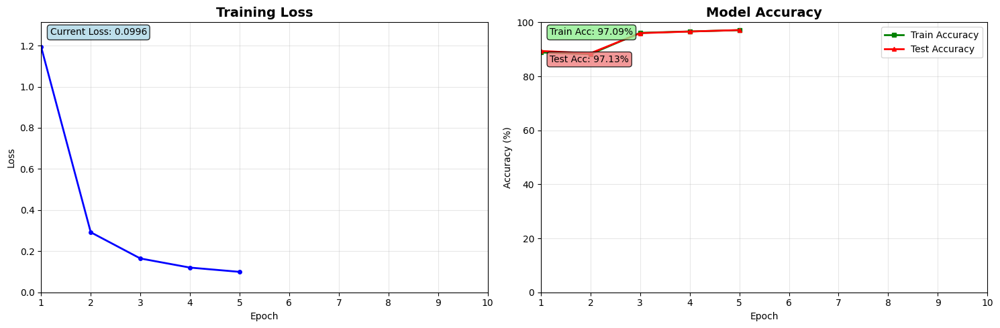


Training completed!
Final Results:
  - Final Loss: 0.0996
  - Final Train Accuracy: 97.09%
  - Final Test Accuracy: 97.13%


In [ ]:
batch_size = [16, 32, 64, 128]

for bs in batch_size:
  model = MNISTModel()
  train_loader = DataLoader(train_dataset, batch_size=bs, shuffle=True, num_workers=0)
  test_loader = DataLoader(test_dataset, batch_size=bs, shuffle=False, num_workers=0)
  print(f"Training with Batch Size {bs}")
  train(model=model, train_loader=train_loader, test_loader=test_loader, num_epochs=5)

## Batch Size = 32
We observe that the batch size 32 works the best in terms of Loss convergence and highest accuracy. We will be using the same as we go ahead

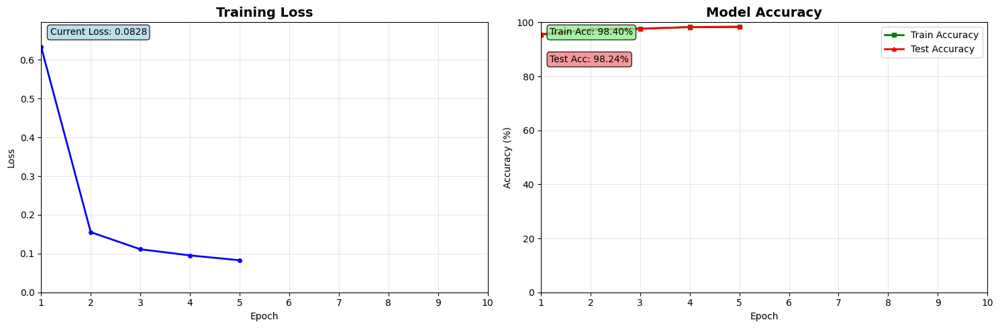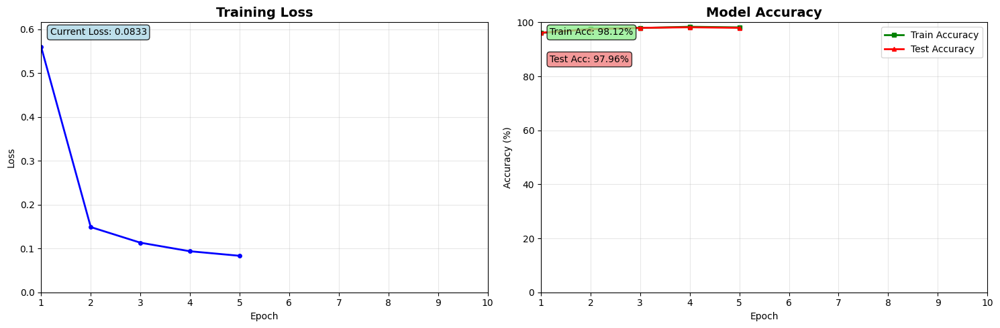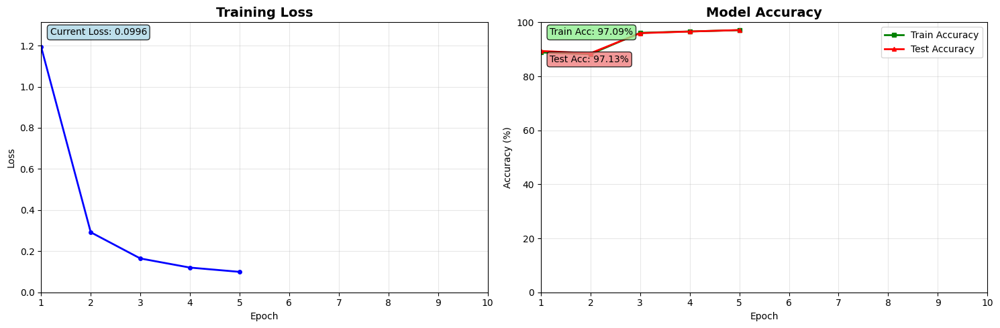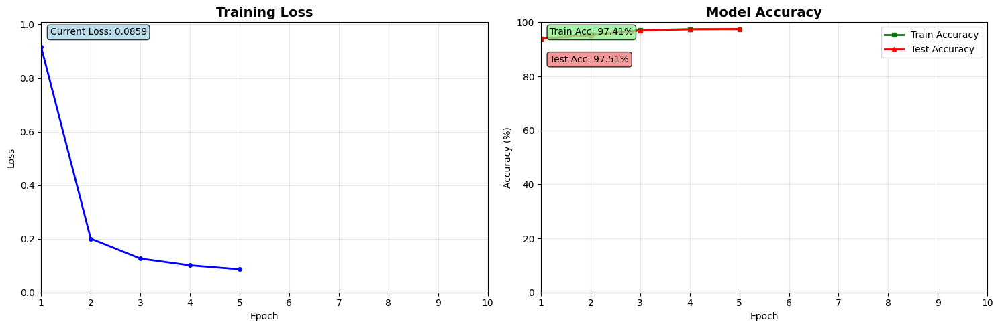

# Optimizer
Which optimizer should we choose SGD, Adam or Adamw? Let's find out. We will keep the learning rate as constant for all of them.

In [ ]:
class MNISTModel(nn.Module):
    """Replace only the last max pooling with 1x1 conv, keep the first max pooling"""
    def __init__(self):
        super(MNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same'),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(8, 16, kernel_size=3, padding='same'),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(32, 64, kernel_size=1, padding='same'),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 10, kernel_size=1, padding='same')
        )

        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 7, 7]
        x = self.gap(x)                # Shape: [batch, 10, 1, 1]
        x = x.view(x.size(0), -1)      # Shape: [batch, 10] - Flatten
        return x

Using device: cpu

Model Architecture:
torchinfo not installed. Install with: pip install torchinfo

Starting Optimizer Comparison...
Optimizers to test: ['SGD', 'Adam', 'AdamW']
Number of seeds: 2
Epochs per run: 5

🚀 Testing SGD optimizer...
Config: {'type': 'SGD', 'lr': 0.01, 'momentum': 0.9, 'weight_decay': 0.0001}
------------------------------------------------------------
  Seed 1/2 (seed=42)... Done! Test Acc: 98.06%
  Seed 2/2 (seed=123)... Done! Test Acc: 97.99%

🚀 Testing ADAM optimizer...
Config: {'type': 'Adam', 'lr': 0.001, 'weight_decay': 0.0001}
------------------------------------------------------------
  Seed 1/2 (seed=42)... Done! Test Acc: 97.58%
  Seed 2/2 (seed=123)... Done! Test Acc: 98.17%

🚀 Testing ADAMW optimizer...
Config: {'type': 'AdamW', 'lr': 0.001, 'weight_decay': 0.01}
------------------------------------------------------------
  Seed 1/2 (seed=42)... Done! Test Acc: 97.90%
  Seed 2/2 (seed=123)... Done! Test Acc: 98.10%

                            

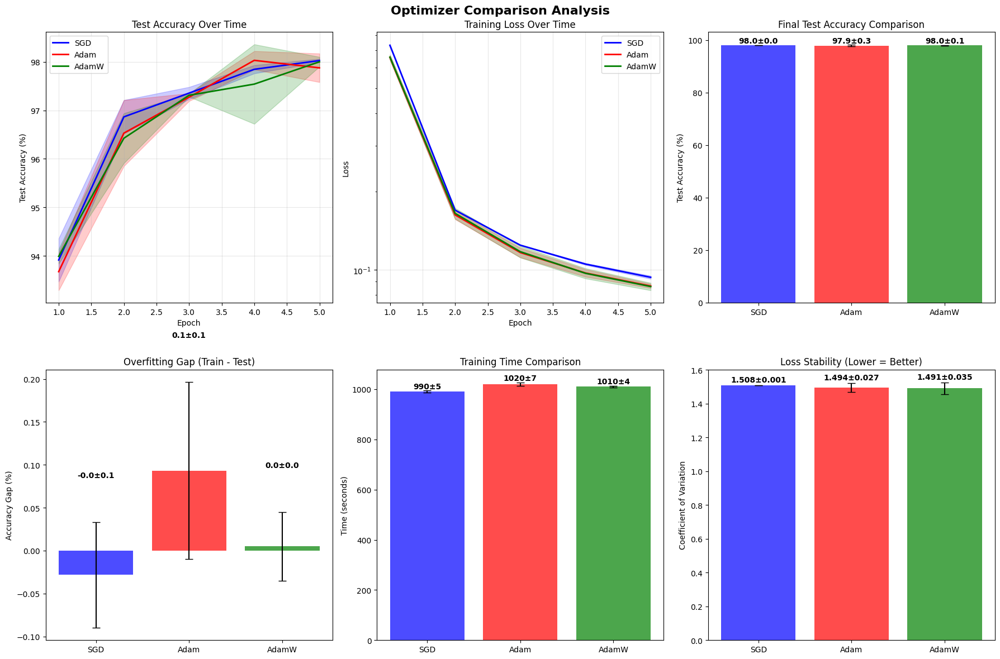

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np
import time
import pandas as pd

def calculate_receptive_field(model):
    """Calculate final receptive field for the model"""
    rf = 1  # Initial receptive field
    stride = 1  # Initial stride

    for name, layer in model.named_modules():
        if isinstance(layer, nn.Conv2d):
            kernel_size = layer.kernel_size[0] if isinstance(layer.kernel_size, tuple) else layer.kernel_size
            layer_stride = layer.stride[0] if isinstance(layer.stride, tuple) else layer.stride

            # Calculate new receptive field
            rf = rf + (kernel_size - 1) * stride
            stride = stride * layer_stride

        elif isinstance(layer, (nn.MaxPool2d, nn.AvgPool2d)):
            kernel_size = layer.kernel_size if isinstance(layer.kernel_size, int) else layer.kernel_size[0]
            layer_stride = layer.stride if isinstance(layer.stride, int) else layer.stride[0]

            # Update receptive field for pooling
            rf = rf + (kernel_size - 1) * stride
            stride = stride * layer_stride

    return rf

def analyze_with_torchinfo(model, input_size=(1, 1, 28, 28), device='cuda'):
    """
    Using torchinfo - shows only the final summary stats with receptive field
    """
    try:
        from torchinfo import summary as torchinfo_summary

        device = device if torch.cuda.is_available() else 'cpu'
        model_copy = model.to(device)

        # Get summary with verbose=0 to show only final stats
        # Pass the input_size to torchinfo_summary
        summary_stats = torchinfo_summary(
            model_copy,
            input_size=input_size,
            verbose=0  # This shows only the summary stats at the end
        )

        # Calculate and display receptive field
        rf = calculate_receptive_field(model_copy)
        print(f"Final Receptive Field: {rf} pixels")

        return summary_stats

    except ImportError:
        print("torchinfo not installed. Install with: pip install torchinfo")
        return None
    except Exception as e:
        print(f"Error with torchinfo: {e}")
        return None

def evaluate_accuracy(model, test_loader, device):
    """Evaluate model accuracy"""
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    return 100 * correct / total

def create_optimizer(optimizer_config, model_parameters):
    """Create optimizer based on configuration"""
    opt_type = optimizer_config['type'].lower()

    if opt_type == 'sgd':
        return torch.optim.SGD(
            model_parameters,
            lr=optimizer_config.get('lr', 0.01),
            momentum=optimizer_config.get('momentum', 0.9),
            weight_decay=optimizer_config.get('weight_decay', 0.0001)
        )
    elif opt_type == 'adam':
        return torch.optim.Adam(
            model_parameters,
            lr=optimizer_config.get('lr', 0.001),
            weight_decay=optimizer_config.get('weight_decay', 0.0001)
        )
    elif opt_type == 'adamw':
        return torch.optim.AdamW(
            model_parameters,
            lr=optimizer_config.get('lr', 0.001),
            weight_decay=optimizer_config.get('weight_decay', 0.01)
        )
    else:
        raise ValueError(f"Unsupported optimizer type: {opt_type}")

def train_single_optimizer(model_class, train_loader, test_loader, optimizer_config,
                          num_epochs=20, input_size=(1, 1, 28, 28), seed=42):
    """
    Train model with a single optimizer configuration

    Args:
        model_class: Class to create fresh model instances
        train_loader: Training data loader
        test_loader: Test data loader
        optimizer_config: Dictionary with optimizer configuration
        num_epochs: Number of epochs to train
        input_size: Input tensor size for model summary
        seed: Random seed for reproducibility

    Returns:
        Dictionary with training results
    """
    # Set random seed for reproducibility
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)

    # Device configuration
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Create fresh model
    model = model_class().to(device)

    # Create optimizer
    optimizer = create_optimizer(optimizer_config, model.parameters())

    # Track training metrics
    epoch_losses = []
    batch_losses = []
    batch_epochs = []
    train_accuracies = []
    test_accuracies = []

    # Training time tracking
    start_time = time.time()
    epoch_times = []

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0
        num_batches = 0
        epoch_start = time.time()

        for i, (images, labels) in enumerate(train_loader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = torch.nn.functional.cross_entropy(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Store batch loss and epoch info
            batch_losses.append(loss.item())
            batch_epochs.append(epoch + 1 + i / len(train_loader))

            epoch_loss += loss.item()
            num_batches += 1

        # Calculate metrics
        avg_loss = epoch_loss / num_batches
        epoch_losses.append(avg_loss)

        train_accuracy = evaluate_accuracy(model, train_loader, device)
        test_accuracy = evaluate_accuracy(model, test_loader, device)

        train_accuracies.append(train_accuracy)
        test_accuracies.append(test_accuracy)

        epoch_time = time.time() - epoch_start
        epoch_times.append(epoch_time)

    total_time = time.time() - start_time

    # Calculate additional metrics
    final_train_acc = train_accuracies[-1]
    final_test_acc = test_accuracies[-1]
    best_test_acc = max(test_accuracies)
    best_test_epoch = test_accuracies.index(best_test_acc) + 1
    overfitting_gap = final_train_acc - final_test_acc
    loss_stability = np.std(batch_losses) / np.mean(batch_losses)  # Coefficient of variation

    # Find epoch when reached 95% test accuracy (if ever)
    epochs_to_95 = None
    for i, acc in enumerate(test_accuracies):
        if acc >= 95.0:
            epochs_to_95 = i + 1
            break

    return {
        'optimizer_name': optimizer_config['type'],
        'optimizer_config': optimizer_config,
        'final_train_accuracy': final_train_acc,
        'final_test_accuracy': final_test_acc,
        'best_test_accuracy': best_test_acc,
        'best_test_epoch': best_test_epoch,
        'overfitting_gap': overfitting_gap,
        'final_loss': epoch_losses[-1],
        'min_loss': min(epoch_losses),
        'loss_stability_cov': loss_stability,
        'total_training_time': total_time,
        'avg_epoch_time': np.mean(epoch_times),
        'epochs_to_95_percent': epochs_to_95,
        'epoch_losses': epoch_losses,
        'batch_losses': batch_losses,
        'batch_epochs': batch_epochs,
        'train_accuracies': train_accuracies,
        'test_accuracies': test_accuracies,
        'epoch_times': epoch_times
    }

def compare_optimizers(model_class, train_loader, test_loader, optimizer_configs,
                      num_epochs=20, input_size=(1, 1, 28, 28), num_seeds=3):
    """
    Compare multiple optimizers with statistical significance

    Args:
        model_class: Class to create fresh model instances
        train_loader: Training data loader
        test_loader: Test data loader
        optimizer_configs: List of optimizer configuration dictionaries
        num_epochs: Number of epochs to train
        input_size: Input tensor size for model summary
        num_seeds: Number of random seeds for statistical significance

    Returns:
        Dictionary with comparison results and statistics
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # Show model architecture once
    sample_model = model_class().to(device)
    print("\nModel Architecture:")
    analyze_with_torchinfo(sample_model, input_size) # Pass input_size here
    del sample_model  # Clean up

    all_results = {}
    seeds = [42, 123, 456, 789, 999][:num_seeds]

    print(f"\nStarting Optimizer Comparison...")
    print(f"Optimizers to test: {[config['type'] for config in optimizer_configs]}")
    print(f"Number of seeds: {num_seeds}")
    print(f"Epochs per run: {num_epochs}")
    print("=" * 80)

    # Run experiments
    for opt_config in optimizer_configs:
        opt_name = opt_config['type']
        print(f"\n🚀 Testing {opt_name.upper()} optimizer...")
        print(f"Config: {opt_config}")
        print("-" * 60)

        seed_results = []

        for seed_idx, seed in enumerate(seeds):
            print(f"  Seed {seed_idx + 1}/{num_seeds} (seed={seed})... ", end="")
            result = train_single_optimizer(
                model_class, train_loader, test_loader, opt_config,
                num_epochs, input_size, seed
            )
            seed_results.append(result)
            print(f"Done! Test Acc: {result['final_test_accuracy']:.2f}%")

        all_results[opt_name] = seed_results

    # Calculate statistics
    comparison_stats = calculate_comparison_statistics(all_results)

    # Print results
    print_comparison_results(comparison_stats)

    # Plot comparison
    plot_optimizer_comparison(all_results, comparison_stats)

    return {
        'detailed_results': all_results,
        'comparison_stats': comparison_stats,
        'winner': determine_winner(comparison_stats)
    }

def calculate_comparison_statistics(all_results):
    """Calculate statistical summary for optimizer comparison"""
    stats = {}

    for opt_name, seed_results in all_results.items():
        # Extract metrics across all seeds
        final_test_accs = [r['final_test_accuracy'] for r in seed_results]
        best_test_accs = [r['best_test_accuracy'] for r in seed_results]
        overfitting_gaps = [r['overfitting_gap'] for r in seed_results]
        training_times = [r['total_training_time'] for r in seed_results]
        loss_stabilities = [r['loss_stability_cov'] for r in seed_results]
        epochs_to_95 = [r['epochs_to_95_percent'] for r in seed_results if r['epochs_to_95_percent'] is not None]

        stats[opt_name] = {
            'final_test_acc_mean': np.mean(final_test_accs),
            'final_test_acc_std': np.std(final_test_accs),
            'best_test_acc_mean': np.mean(best_test_accs),
            'best_test_acc_std': np.std(best_test_accs),
            'overfitting_gap_mean': np.mean(overfitting_gaps),
            'overfitting_gap_std': np.std(overfitting_gaps),
            'training_time_mean': np.mean(training_times),
            'training_time_std': np.std(training_times),
            'loss_stability_mean': np.mean(loss_stabilities),
            'loss_stability_std': np.std(loss_stabilities),
            'epochs_to_95_mean': np.mean(epochs_to_95) if epochs_to_95 else None,
            'epochs_to_95_success_rate': len(epochs_to_95) / len(seed_results),
            'config': seed_results[0]['optimizer_config']
        }

    return stats

def print_comparison_results(comparison_stats):
    """Print formatted comparison results"""
    print("\n" + "=" * 100)
    print(" " * 35 + "🏆 OPTIMIZER COMPARISON RESULTS 🏆")
    print("=" * 100)

    # Create comparison table
    data = []
    for opt_name, stats in comparison_stats.items():
        data.append([
            opt_name,
            f"{stats['final_test_acc_mean']:.2f} ± {stats['final_test_acc_std']:.2f}",
            f"{stats['best_test_acc_mean']:.2f} ± {stats['best_test_acc_std']:.2f}",
            f"{stats['overfitting_gap_mean']:.2f} ± {stats['overfitting_gap_std']:.2f}",
            f"{stats['training_time_mean']:.1f} ± {stats['training_time_std']:.1f}",
            f"{stats['loss_stability_mean']:.3f} ± {stats['loss_stability_std']:.3f}",
            f"{stats['epochs_to_95_success_rate']:.0%}"
        ])

    df = pd.DataFrame(data, columns=[
        'Optimizer', 'Final Test Acc (%)', 'Best Test Acc (%)',
        'Overfitting Gap (%)', 'Training Time (s)', 'Loss Stability (CoV)', '95% Success Rate'
    ])

    print(df.to_string(index=False))

    print("\n📊 INTERPRETATION GUIDE:")
    print("• Final Test Acc: Higher is better")
    print("• Best Test Acc: Peak performance achieved")
    print("• Overfitting Gap: Lower is better (less overfitting)")
    print("• Training Time: Lower is faster")
    print("• Loss Stability (CoV): Lower is more stable training")
    print("• 95% Success Rate: Percentage of runs reaching 95% test accuracy")

def determine_winner(comparison_stats):
    """Determine the best optimizer based on multiple criteria"""
    scores = {}

    for opt_name in comparison_stats.keys():
        scores[opt_name] = 0

    # Score based on final test accuracy (40% weight)
    final_accs = {name: stats['final_test_acc_mean'] for name, stats in comparison_stats.items()}
    best_final = max(final_accs.values())
    for name, acc in final_accs.items():
        scores[name] += 0.4 * (acc / best_final)

    # Score based on best test accuracy (30% weight)
    best_accs = {name: stats['best_test_acc_mean'] for name, stats in comparison_stats.items()}
    best_best = max(best_accs.values())
    for name, acc in best_accs.items():
        scores[name] += 0.3 * (acc / best_best)

    # Score based on low overfitting (20% weight)
    overfitting = {name: stats['overfitting_gap_mean'] for name, stats in comparison_stats.items()}
    min_overfitting = min(overfitting.values())
    for name, gap in overfitting.items():
        scores[name] += 0.2 * (min_overfitting / gap if gap > 0 else 1.0)

    # Score based on stability (10% weight)
    stability = {name: stats['loss_stability_mean'] for name, stats in comparison_stats.items()}
    min_stability = min(stability.values())
    for name, stab in stability.items():
        scores[name] += 0.1 * (min_stability / stab)

    winner = max(scores.items(), key=lambda x: x[1])
    return {'name': winner[0], 'score': winner[1], 'all_scores': scores}

def plot_optimizer_comparison(all_results, comparison_stats):
    """Plot comprehensive comparison of optimizers"""
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Optimizer Comparison Analysis', fontsize=16, fontweight='bold')

    # Colors for each optimizer
    colors = ['blue', 'red', 'green', 'orange', 'purple']

    # Plot 1: Test Accuracy Over Time (mean curves)
    ax = axes[0, 0]
    for i, (opt_name, seed_results) in enumerate(all_results.items()):
        # Calculate mean and std across seeds
        all_test_accs = np.array([r['test_accuracies'] for r in seed_results])
        mean_acc = np.mean(all_test_accs, axis=0)
        std_acc = np.std(all_test_accs, axis=0)
        epochs = range(1, len(mean_acc) + 1)

        ax.plot(epochs, mean_acc, label=opt_name, color=colors[i], linewidth=2)
        ax.fill_between(epochs, mean_acc - std_acc, mean_acc + std_acc,
                       alpha=0.2, color=colors[i])

    ax.set_title('Test Accuracy Over Time')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Test Accuracy (%)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 2: Loss Over Time (mean curves)
    ax = axes[0, 1]
    for i, (opt_name, seed_results) in enumerate(all_results.items()):
        all_losses = np.array([r['epoch_losses'] for r in seed_results])
        mean_loss = np.mean(all_losses, axis=0)
        std_loss = np.std(all_losses, axis=0)
        epochs = range(1, len(mean_loss) + 1)

        ax.plot(epochs, mean_loss, label=opt_name, color=colors[i], linewidth=2)
        ax.fill_between(epochs, mean_loss - std_loss, mean_loss + std_loss,
                       alpha=0.2, color=colors[i])

    ax.set_title('Training Loss Over Time')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_yscale('log')

    # Plot 3: Final Performance Comparison
    ax = axes[0, 2]
    opt_names = list(comparison_stats.keys())
    final_accs = [comparison_stats[name]['final_test_acc_mean'] for name in opt_names]
    final_stds = [comparison_stats[name]['final_test_acc_std'] for name in opt_names]

    bars = ax.bar(opt_names, final_accs, yerr=final_stds, capsize=5,
                  color=colors[:len(opt_names)], alpha=0.7)
    ax.set_title('Final Test Accuracy Comparison')
    ax.set_ylabel('Test Accuracy (%)')

    # Add value labels on bars
    for bar, acc, std in zip(bars, final_accs, final_stds):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + std + 0.1,
               f'{acc:.1f}±{std:.1f}', ha='center', va='bottom', fontweight='bold')

    # Plot 4: Overfitting Comparison
    ax = axes[1, 0]
    gaps = [comparison_stats[name]['overfitting_gap_mean'] for name in opt_names]
    gap_stds = [comparison_stats[name]['overfitting_gap_std'] for name in opt_names]

    bars = ax.bar(opt_names, gaps, yerr=gap_stds, capsize=5,
                  color=colors[:len(opt_names)], alpha=0.7)
    ax.set_title('Overfitting Gap (Train - Test)')
    ax.set_ylabel('Accuracy Gap (%)')

    for bar, gap, std in zip(bars, gaps, gap_stds):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + std + 0.05,
               f'{gap:.1f}±{std:.1f}', ha='center', va='bottom', fontweight='bold')

    # Plot 5: Training Time Comparison
    ax = axes[1, 1]
    times = [comparison_stats[name]['training_time_mean'] for name in opt_names]
    time_stds = [comparison_stats[name]['training_time_std'] for name in opt_names]

    bars = ax.bar(opt_names, times, yerr=time_stds, capsize=5,
                  color=colors[:len(opt_names)], alpha=0.7)
    ax.set_title('Training Time Comparison')
    ax.set_ylabel('Time (seconds)')

    for bar, time_val, std in zip(bars, times, time_stds):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + std + 1,
               f'{time_val:.0f}±{std:.0f}', ha='center', va='bottom', fontweight='bold')

    # Plot 6: Loss Stability Comparison
    ax = axes[1, 2]
    stabilities = [comparison_stats[name]['loss_stability_mean'] for name in opt_names]
    stab_stds = [comparison_stats[name]['loss_stability_std'] for name in opt_names]

    bars = ax.bar(opt_names, stabilities, yerr=stab_stds, capsize=5,
                  color=colors[:len(opt_names)], alpha=0.7)
    ax.set_title('Loss Stability (Lower = Better)')
    ax.set_ylabel('Coefficient of Variation')

    for bar, stab, std in zip(bars, stabilities, stab_stds):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + std + 0.01,
               f'{stab:.3f}±{std:.3f}', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()


# Define optimizer configurations
optimizer_configs = [
    {
        'type': 'SGD',
        'lr': 0.01,
        'momentum': 0.9,
        'weight_decay': 0.0001
    },
    {
        'type': 'Adam',
        'lr': 0.001,
        'weight_decay': 0.0001
    },
    {
        'type': 'AdamW',
        'lr': 0.001,
        'weight_decay': 0.01
    }
]

BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

# Run comparison (you need to provide your train_loader and test_loader)
results = compare_optimizers(
    MNISTModel, # Pass the model class, not an instance
    train_loader,
    test_loader,
    optimizer_configs,
    num_epochs=5,
    num_seeds=2
)

## Optimizer = AdamW {'lr': 0.001, 'weight_decay': 0.01}

# LR Scheduling


In [ ]:
class MNISTModel(nn.Module):
    """Replace only the last max pooling with 1x1 conv, keep the first max pooling"""
    def __init__(self):
        super(MNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same'),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(8, 16, kernel_size=3, padding='same'),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(32, 64, kernel_size=1, padding='same'),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 10, kernel_size=1, padding='same')
        )

        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 7, 7]
        x = self.gap(x)                # Shape: [batch, 10, 1, 1]
        x = x.view(x.size(0), -1)      # Shape: [batch, 10] - Flatten
        return x

🔥 Starting MNIST Scheduler Comparison...
This will test 3 configurations:
1. No scheduling (baseline)
2. Step scheduler (drops LR every 7 epochs)
3. Cosine scheduler (smooth decay)

Testing: Original (No Scheduler)
Config: {'lr': 0.001, 'weight_decay': 0.0001, 'scheduler': None}

🚀 Training Original (No Scheduler)...
Device: cuda
Epoch  5: Train Acc:  97.61% | Test Acc:  97.70% | LR: 0.001000
Epoch 10: Train Acc:  98.23% | Test Acc:  98.53% | LR: 0.001000
Epoch 15: Train Acc:  98.54% | Test Acc:  98.77% | LR: 0.001000
Epoch 20: Train Acc:  98.67% | Test Acc:  98.75% | LR: 0.001000
✅ Original (No Scheduler) Final Test Accuracy: 98.75%

Testing: Step Scheduler
Config: {'lr': 0.001, 'weight_decay': 0.0001, 'scheduler': 'step', 'step_size': 7, 'gamma': 0.5}

🚀 Training Step Scheduler...
Device: cuda
Epoch  5: Train Acc:  97.48% | Test Acc:  97.90% | LR: 0.001000
Epoch 10: Train Acc:  98.34% | Test Acc:  98.61% | LR: 0.000500
Epoch 15: Train Acc:  98.67% | Test Acc:  98.79% | LR: 0.000250
E

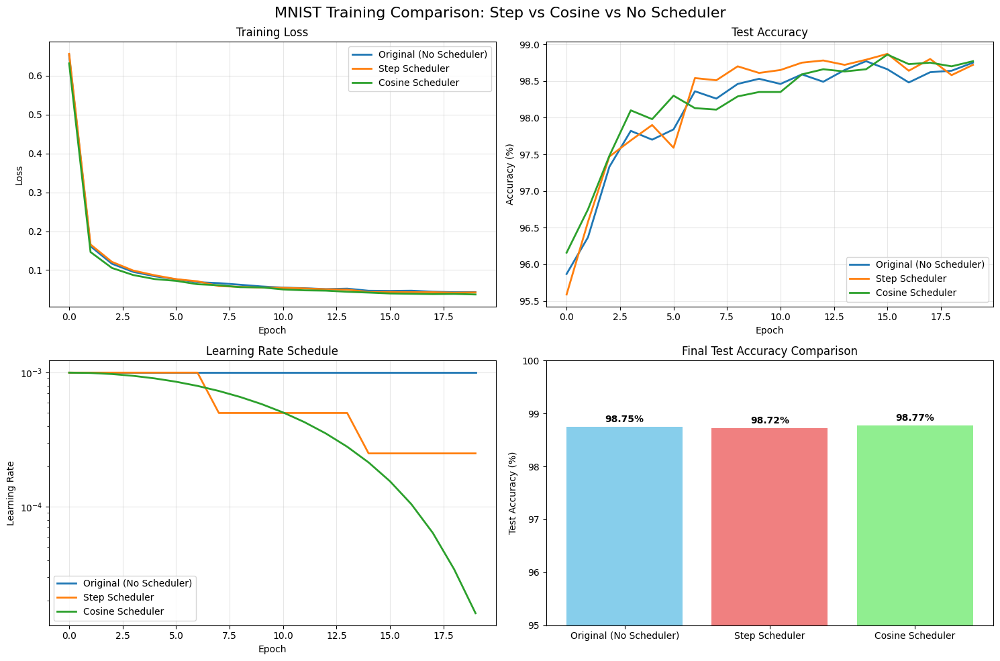


📊 FINAL SUMMARY
Original (No Scheduler) | Final: 98.75% | Best: 98.77% | Final LR: 0.001000
Step Scheduler       | Final: 98.72% | Best: 98.87% | Final LR: 0.000250
Cosine Scheduler     | Final: 98.77% | Best: 98.86% | Final LR: 0.000016

🏆 Winner: Cosine Scheduler
🎯 Recommendation: Try the winner configuration for your actual training!

✅ Testing complete! Check the plots and summary above.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict


# Training function
def train_model(model, train_loader, test_loader, optimizer, scheduler, epochs, config_name):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    criterion = nn.CrossEntropyLoss()

    # Track metrics
    history = {
        'train_loss': [],
        'train_acc': [],
        'test_loss': [],
        'test_acc': [],
        'lr': []
    }

    print(f"\n🚀 Training {config_name}...")
    print(f"Device: {device}")

    for epoch in range(epochs):
        # Training
        model.train()
        train_loss = 0
        correct = 0
        total = 0

        for batch_idx, (data, target) in enumerate(train_loader):
            data, target = data.to(device), target.to(device)

            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            _, predicted = output.max(1)
            total += target.size(0)
            correct += predicted.eq(target).sum().item()

        train_acc = 100. * correct / total
        avg_train_loss = train_loss / len(train_loader)

        # Testing
        model.eval()
        test_loss = 0
        correct = 0
        total = 0

        with torch.no_grad():
            for data, target in test_loader:
                data, target = data.to(device), target.to(device)
                output = model(data)
                test_loss += criterion(output, target).item()
                _, predicted = output.max(1)
                total += target.size(0)
                correct += predicted.eq(target).sum().item()

        test_acc = 100. * correct / total
        avg_test_loss = test_loss / len(test_loader)

        # Get current learning rate
        current_lr = optimizer.param_groups[0]['lr']

        # Store metrics
        history['train_loss'].append(avg_train_loss)
        history['train_acc'].append(train_acc)
        history['test_loss'].append(avg_test_loss)
        history['test_acc'].append(test_acc)
        history['lr'].append(current_lr)

        # Step scheduler
        if scheduler:
            scheduler.step()

        # Print progress
        if (epoch + 1) % 5 == 0:
            print(f'Epoch {epoch+1:2d}: Train Acc: {train_acc:6.2f}% | Test Acc: {test_acc:6.2f}% | LR: {current_lr:.6f}')

    print(f"✅ {config_name} Final Test Accuracy: {test_acc:.2f}%")
    return history

# Main comparison function
def compare_schedulers():
    # Configuration
    epochs = 20

    # Your configurations to test
    configs = {
        'Original (No Scheduler)': {
            'lr': 0.001,
            'weight_decay': 0.0001,  # Lowered from 0.01
            'scheduler': None
        },
        'Step Scheduler': {
            'lr': 0.001,
            'weight_decay': 0.0001,
            'scheduler': 'step',
            'step_size': 7,      # Drop every 7 epochs
            'gamma': 0.5         # Cut LR in half
        },
        'Cosine Scheduler': {
            'lr': 0.001,
            'weight_decay': 0.0001,
            'scheduler': 'cosine',
            'T_max': epochs,     # Total epochs
            'eta_min': 0.00001   # Final LR
        }
    }

    BATCH_SIZE = 32
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    # Store results
    results = {}

    # Test each configuration
    for config_name, config in configs.items():
        print(f"\n{'='*50}")
        print(f"Testing: {config_name}")
        print(f"Config: {config}")
        print(f"{'='*50}")

        # Create fresh model
        model = MNISTModel()

        # Create optimizer
        optimizer = optim.AdamW(
            model.parameters(),
            lr=config['lr'],
            weight_decay=config['weight_decay']
        )

        # Create scheduler
        scheduler = None
        if config['scheduler'] == 'step':
            scheduler = optim.lr_scheduler.StepLR(
                optimizer,
                step_size=config['step_size'],
                gamma=config['gamma']
            )
        elif config['scheduler'] == 'cosine':
            scheduler = optim.lr_scheduler.CosineAnnealingLR(
                optimizer,
                T_max=config['T_max'],
                eta_min=config['eta_min']
            )

        # Train model
        history = train_model(model, train_loader, test_loader, optimizer, scheduler, epochs, config_name)
        results[config_name] = history

    return results

# Plotting function
def plot_results(results):
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('MNIST Training Comparison: Step vs Cosine vs No Scheduler', fontsize=16)

    # Plot 1: Training Loss
    ax = axes[0, 0]
    for name, history in results.items():
        ax.plot(history['train_loss'], label=name, linewidth=2)
    ax.set_title('Training Loss')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 2: Test Accuracy
    ax = axes[0, 1]
    for name, history in results.items():
        ax.plot(history['test_acc'], label=name, linewidth=2)
    ax.set_title('Test Accuracy')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Accuracy (%)')
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 3: Learning Rate
    ax = axes[1, 0]
    for name, history in results.items():
        ax.plot(history['lr'], label=name, linewidth=2)
    ax.set_title('Learning Rate Schedule')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Learning Rate')
    ax.set_yscale('log')  # Log scale for better visualization
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 4: Final Comparison
    ax = axes[1, 1]
    names = list(results.keys())
    final_accs = [results[name]['test_acc'][-1] for name in names]
    colors = ['skyblue', 'lightcoral', 'lightgreen']

    bars = ax.bar(names, final_accs, color=colors[:len(names)])
    ax.set_title('Final Test Accuracy Comparison')
    ax.set_ylabel('Test Accuracy (%)')
    ax.set_ylim(95, 100)  # Focus on the interesting range

    # Add value labels on bars
    for bar, acc in zip(bars, final_accs):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                f'{acc:.2f}%', ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()
    plt.show()

# Summary function
def print_summary(results):
    print(f"\n{'='*60}")
    print("📊 FINAL SUMMARY")
    print(f"{'='*60}")

    for name, history in results.items():
        final_acc = history['test_acc'][-1]
        final_lr = history['lr'][-1]
        best_acc = max(history['test_acc'])
        print(f"{name:20} | Final: {final_acc:5.2f}% | Best: {best_acc:5.2f}% | Final LR: {final_lr:.6f}")

    # Find winner
    best_config = max(results.keys(), key=lambda x: results[x]['test_acc'][-1])
    print(f"\n🏆 Winner: {best_config}")
    print(f"🎯 Recommendation: Try the winner configuration for your actual training!")

if __name__ == "__main__":
    print("🔥 Starting MNIST Scheduler Comparison...")
    print("This will test 3 configurations:")
    print("1. No scheduling (baseline)")
    print("2. Step scheduler (drops LR every 7 epochs)")
    print("3. Cosine scheduler (smooth decay)")

    # Run comparison
    results = compare_schedulers()

    # Show results
    plot_results(results)
    print_summary(results)

    print(f"\n✅ Testing complete! Check the plots and summary above.")

## Config: {'lr': 0.001, 'weight_decay': 0.0001, 'scheduler': 'cosine', 'T_max': 20, 'eta_min': 1e-05}

# Dropout
Find the best dropout strategy

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from itertools import product

# Your exact model architecture with configurable dropout
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self, dropout1=0.1, dropout2=0.1, dropout3=0.1):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same'),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout1),  # First dropout - configurable

            nn.Conv2d(8, 16, kernel_size=3, padding='same'),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout2),  # Second dropout - configurable

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout3),  # Third dropout - configurable

            nn.Conv2d(32, 64, kernel_size=1, padding='same'),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 10, kernel_size=1, padding='same')
        )

        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)

        # Store dropout rates for reference
        self.dropout1_rate = dropout1
        self.dropout2_rate = dropout2
        self.dropout3_rate = dropout3

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap(x)                # Shape: [batch, 10, 1, 1]
        x = x.view(x.size(0), -1)      # Shape: [batch, 10] - Flatten
        return x

def quick_train(model, train_loader, test_loader, epochs=20):
    """Quick training function for dropout testing with your config"""
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Your exact training configuration
    optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.0001)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=20,
        eta_min=1e-05
    )
    criterion = nn.CrossEntropyLoss()

    train_losses = []
    test_accs = []
    learning_rates = []

    for epoch in range(epochs):
        # Training
        model.train()
        train_loss = 0
        for data, target in train_loader:
            data, target = data.to(device), target.to(device)
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        avg_train_loss = train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Testing
        model.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for data, target in test_loader:
                data, target = data.to(device), target.to(device)
                output = model(data)
                _, predicted = output.max(1)
                total += target.size(0)
                correct += predicted.eq(target).sum().item()

        test_acc = 100. * correct / total
        test_accs.append(test_acc)

        # Record current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        learning_rates.append(current_lr)

        # Step the scheduler
        scheduler.step()

    return {
        'final_train_loss': train_losses[-1],
        'final_test_acc': test_accs[-1],
        'train_losses': train_losses,
        'test_accs': test_accs,
        'learning_rates': learning_rates
    }


def test_dropout_strategies():
    """Test different dropout strategies for your specific model"""

    # Define dropout strategies to test
    # Format: (dropout1, dropout2, dropout3) for the three dropout layers
    strategies = {
        'No Dropout': (0.0, 0.0, 0.0),
        'Your Original': (0.1, 0.1, 0.1),           # Your current setup
        'Light Dropout': (0.05, 0.05, 0.05),       # Even lighter
        'Progressive': (0.05, 0.1, 0.15),          # Increase through network
        'Reverse Progressive': (0.15, 0.1, 0.05),  # Decrease through network
        'Heavy Early': (0.2, 0.1, 0.1),           # More dropout early
        'Heavy Late': (0.05, 0.1, 0.2),           # More dropout later
        'Middle Focus': (0.05, 0.2, 0.05),        # Focus dropout in middle
        'Uniform Light': (0.08, 0.08, 0.08),      # Slightly less than original
        'Uniform Heavy': (0.15, 0.15, 0.15),      # More than original
    }

    print("🧪 Testing Dropout Strategies for Your MNIST Model")
    print("=" * 55)
    print("Training Config: LR=0.001, WD=0.0001, Cosine Schedule")
    print("Model: Conv layers with 3 dropout positions")
    print("Testing with 15k samples, 20 epochs each")
    print()

    BATCH_SIZE = 32
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)


    results = {}

    for strategy_name, (drop1, drop2, drop3) in strategies.items():
        print(f"Testing {strategy_name}: ({drop1}, {drop2}, {drop3})")

        # Create model with this dropout strategy
        model = ConfigurableMNISTModel(dropout1=drop1, dropout2=drop2, dropout3=drop3)

        # Quick training
        result = quick_train(model, train_loader, test_loader, epochs=20)
        results[strategy_name] = {
            **result,
            'dropout_config': (drop1, drop2, drop3)
        }

        print(f"  → Final Test Accuracy: {result['final_test_acc']:.2f}%")
        print(f"  → Final Train Loss: {result['final_train_loss']:.4f}")
        print()

    return results

def detailed_dropout_search():
    """More detailed search around promising values for your 3-layer model"""

    # Fine-grained search for your specific architecture
    dropout_values = [0.0, 0.05, 0.1, 0.15, 0.2]

    print("🔍 Detailed 3-Layer Dropout Search")
    print("=" * 40)
    print("Testing all combinations of dropout rates...")

    train_loader, test_loader = get_data_loaders()

    best_acc = 0
    best_config = None
    detailed_results = {}

    # Test key combinations (not all 125, that would take too long!)
    key_combinations = [
        # Uniform rates
        (0.0, 0.0, 0.0), (0.05, 0.05, 0.05), (0.1, 0.1, 0.1), (0.15, 0.15, 0.15),
        # Progressive patterns
        (0.05, 0.1, 0.15), (0.15, 0.1, 0.05), (0.1, 0.15, 0.2),
        # Focus patterns
        (0.2, 0.1, 0.1), (0.1, 0.2, 0.1), (0.1, 0.1, 0.2),
        # Mixed patterns
        (0.05, 0.15, 0.1), (0.15, 0.05, 0.1), (0.1, 0.05, 0.15),
        # Light variations around your original
        (0.08, 0.08, 0.12), (0.12, 0.08, 0.08), (0.08, 0.12, 0.08)
    ]

    total_combinations = len(key_combinations)
    current = 0

    for drop1, drop2, drop3 in key_combinations:
        current += 1
        config_name = f"({drop1}, {drop2}, {drop3})"

        print(f"[{current:2d}/{total_combinations}] Testing {config_name}")

        model = ConfigurableMNISTModel(dropout1=drop1, dropout2=drop2, dropout3=drop3)
        result = quick_train(model, train_loader, test_loader, epochs=20)

        detailed_results[config_name] = {
            'dropout1': drop1,
            'dropout2': drop2,
            'dropout3': drop3,
            'test_acc': result['final_test_acc'],
            'train_loss': result['final_train_loss']
        }

        if result['final_test_acc'] > best_acc:
            best_acc = result['final_test_acc']
            best_config = config_name

        print(f"  → {result['final_test_acc']:.2f}%")

    print(f"\n🏆 Best Configuration: {best_config}")
    print(f"🎯 Best Test Accuracy: {best_acc:.2f}%")

    return detailed_results, best_config

def plot_dropout_comparison(results):
    """Plot comparison of different dropout strategies"""

    strategies = list(results.keys())
    test_accs = [results[strategy]['final_test_acc'] for strategy in strategies]
    train_losses = [results[strategy]['final_train_loss'] for strategy in strategies]

    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15))

    # Test Accuracy Comparison
    colors = plt.cm.viridis(np.linspace(0, 1, len(strategies)))
    bars1 = ax1.bar(range(len(strategies)), test_accs, color=colors)
    ax1.set_title('Test Accuracy by Dropout Strategy (Cosine LR Schedule)', fontsize=14)
    ax1.set_xlabel('Dropout Strategy')
    ax1.set_ylabel('Test Accuracy (%)')
    ax1.set_xticks(range(len(strategies)))
    ax1.set_xticklabels(strategies, rotation=45, ha='right')
    ax1.grid(True, alpha=0.3)

    # Add value labels on bars
    for bar, acc in zip(bars1, test_accs):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                f'{acc:.1f}%', ha='center', va='bottom', fontsize=9)

    # Training Loss Comparison
    bars2 = ax2.bar(range(len(strategies)), train_losses, color=colors)
    ax2.set_title('Final Training Loss by Dropout Strategy', fontsize=14)
    ax2.set_xlabel('Dropout Strategy')
    ax2.set_ylabel('Training Loss')
    ax2.set_xticks(range(len(strategies)))
    ax2.set_xticklabels(strategies, rotation=45, ha='right')
    ax2.grid(True, alpha=0.3)

    # Add value labels on bars
    for bar, loss in zip(bars2, train_losses):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height + 0.001,
                f'{loss:.3f}', ha='center', va='bottom', fontsize=9)

    # Learning Rate Schedule (show one example)
    if 'Your Original' in results and 'learning_rates' in results['Your Original']:
        lrs = results['Your Original']['learning_rates']
        ax3.plot(lrs, 'b-', linewidth=2, label='Cosine Annealing LR')
        ax3.set_title('Learning Rate Schedule (Cosine Annealing)', fontsize=14)
        ax3.set_xlabel('Epoch')
        ax3.set_ylabel('Learning Rate')
        ax3.set_yscale('log')
        ax3.grid(True, alpha=0.3)
        ax3.legend()

        # Add annotations
        ax3.annotate(f'Start: {lrs[0]:.6f}', xy=(0, lrs[0]), xytext=(5, lrs[0]*2),
                    arrowprops=dict(arrowstyle='->', color='red'), fontsize=10)
        ax3.annotate(f'End: {lrs[-1]:.6f}', xy=(len(lrs)-1, lrs[-1]), xytext=(len(lrs)-5, lrs[-1]*10),
                    arrowprops=dict(arrowstyle='->', color='red'), fontsize=10)

    plt.tight_layout()
    plt.show()

def analyze_dropout_patterns(results):
    """Analyze which dropout patterns work best for your architecture"""

    print("\n📊 DROPOUT PATTERN ANALYSIS")
    print("=" * 50)
    print("Analyzing how different dropout patterns affect your model...")
    print()

    # Sort by performance
    sorted_results = sorted(results.items(), key=lambda x: x[1]['final_test_acc'], reverse=True)

    print(f"{'Rank':<4} {'Strategy':<20} {'Dropout Pattern':<15} {'Test Acc':<10} {'Train Loss'}")
    print("-" * 75)

    for i, (strategy, result) in enumerate(sorted_results, 1):
        if 'dropout_config' in result:
            pattern = f"{result['dropout_config']}"
        else:
            pattern = "N/A"

        print(f"{i:<4} {strategy:<20} {pattern:<15} {result['final_test_acc']:<10.2f} {result['final_train_loss']:.4f}")

    # Pattern analysis
    print(f"\n🔍 PATTERN INSIGHTS:")

    # Find best patterns
    top_3 = sorted_results[:3]
    print(f"\nTop 3 performing patterns:")
    for i, (strategy, result) in enumerate(top_3, 1):
        if 'dropout_config' in result:
            pattern = result['dropout_config']
            print(f"{i}. {strategy}: {pattern} → {result['final_test_acc']:.2f}%")

def get_model_specific_recommendations(results):
    """Get recommendations specific to your model architecture"""

    sorted_results = sorted(results.items(), key=lambda x: x[1]['final_test_acc'], reverse=True)
    best_strategy, best_result = sorted_results[0]

    print(f"\n🎯 RECOMMENDATIONS FOR YOUR MODEL")
    print("=" * 50)

    print(f"🥇 BEST PERFORMING STRATEGY: {best_strategy}")
    if 'dropout_config' in best_result:
        d1, d2, d3 = best_result['dropout_config']
        print(f"   Dropout configuration: ({d1}, {d2}, {d3})")
        print(f"   → First dropout (after conv1): {d1}")
        print(f"   → Second dropout (after conv2): {d2}")
        print(f"   → Third dropout (after conv3): {d3}")

    print(f"   Final test accuracy: {best_result['final_test_acc']:.2f}%")

    # Code snippet for implementation
    print(f"\n💻 CODE TO USE IN YOUR MODEL:")
    if 'dropout_config' in best_result:
        d1, d2, d3 = best_result['dropout_config']
        print(f"""
class MNISTModel(nn.Module):
    def __init__(self):
        super(MNISTModel, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same'),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout({d1}),  # ← Updated from analysis

            nn.Conv2d(8, 16, kernel_size=3, padding='same'),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout({d2}),  # ← Updated from analysis

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout({d3}),  # ← Updated from analysis

            # ... rest of your model
        )""")

    print(f"\n📈 EXPECTED IMPROVEMENTS:")
    original_acc = results.get('Your Original', {}).get('final_test_acc', 0)
    if original_acc > 0:
        improvement = best_result['final_test_acc'] - original_acc
        print(f"   Potential accuracy improvement: +{improvement:.2f}%")
        print(f"   From {original_acc:.2f}% → {best_result['final_test_acc']:.2f}%")

    print(f"\n🚀 NEXT STEPS:")
    print(f"   1. Update your model with the recommended dropout rates")
    print(f"   2. Train for full epochs (20-30) to see complete performance")
    print(f"   3. Monitor for overfitting - if it occurs, slightly increase dropout")
    print(f"   4. If underfitting, slightly decrease dropout rates")

def main():
    """Main function to run dropout strategy finder for your model"""

    print("🚀 MNIST Dropout Strategy Finder")
    print("🏗️  Customized for Your Model Architecture")
    print("⚙️  Using Your Training Configuration")
    print("=" * 50)
    print("Training Config:")
    print("  → LR: 0.001 → 1e-05 (Cosine schedule)")
    print("  → Weight Decay: 0.0001")
    print("  → Epochs: 20")
    print("  → Scheduler: Cosine Annealing")
    print()
    print("Your model has 3 dropout layers in the conv sequence")
    print("This tool will find the optimal rates for each position")
    print()

    print("Choose your analysis:")
    print("1. Quick Strategy Test (10 targeted strategies)")
    print("2. Detailed Pattern Search (17 key combinations)")
    print("3. Both (recommended for best results)")

    choice = input("\nEnter choice (1/2/3): ").strip()

    if choice in ['1', '3']:
        print(f"\n{'='*60}")
        print("PHASE 1: QUICK STRATEGY TEST")
        print(f"{'='*60}")

        results = test_dropout_strategies()
        plot_dropout_comparison(results)
        analyze_dropout_patterns(results)
        get_model_specific_recommendations(results)

    if choice in ['2', '3']:
        print(f"\n{'='*60}")
        print("PHASE 2: DETAILED PATTERN SEARCH")
        print(f"{'='*60}")

        detailed_results, best_config = detailed_dropout_search()

        print(f"\n📋 DETAILED SEARCH SUMMARY:")
        print(f"Best configuration: {best_config}")
        best_result = detailed_results[best_config]
        print(f"Dropout rates: ({best_result['dropout1']}, {best_result['dropout2']}, {best_result['dropout3']})")
        print(f"Test accuracy: {best_result['test_acc']:.2f}%")

        print(f"\n🎉 ANALYSIS COMPLETE!")
        print(f"Use the recommended dropout configuration in your full training!")

if __name__ == "__main__":
    main()

🚀 MNIST Dropout Strategy Finder
🏗️  Customized for Your Model Architecture
⚙️  Using Your Training Configuration
Training Config:
  → LR: 0.001 → 1e-05 (Cosine schedule)
  → Weight Decay: 0.0001
  → Epochs: 20
  → Scheduler: Cosine Annealing

Your model has 3 dropout layers in the conv sequence
This tool will find the optimal rates for each position

Choose your analysis:
1. Quick Strategy Test (10 targeted strategies)
2. Detailed Pattern Search (17 key combinations)
3. Both (recommended for best results)

PHASE 1: QUICK STRATEGY TEST
🧪 Testing Dropout Strategies for Your MNIST Model
Training Config: LR=0.001, WD=0.0001, Cosine Schedule
Model: Conv layers with 3 dropout positions
Testing with 15k samples, 20 epochs each

Testing No Dropout: (0.0, 0.0, 0.0)
  → Final Test Accuracy: 98.97%
  → Final Train Loss: 0.0267

Testing Your Original: (0.1, 0.1, 0.1)
  → Final Test Accuracy: 98.77%
  → Final Train Loss: 0.0391

Testing Light Dropout: (0.05, 0.05, 0.05)
  → Final Test Accuracy: 98.

## Light Dropout: (0.05, 0.05, 0.05)

# Augmentation

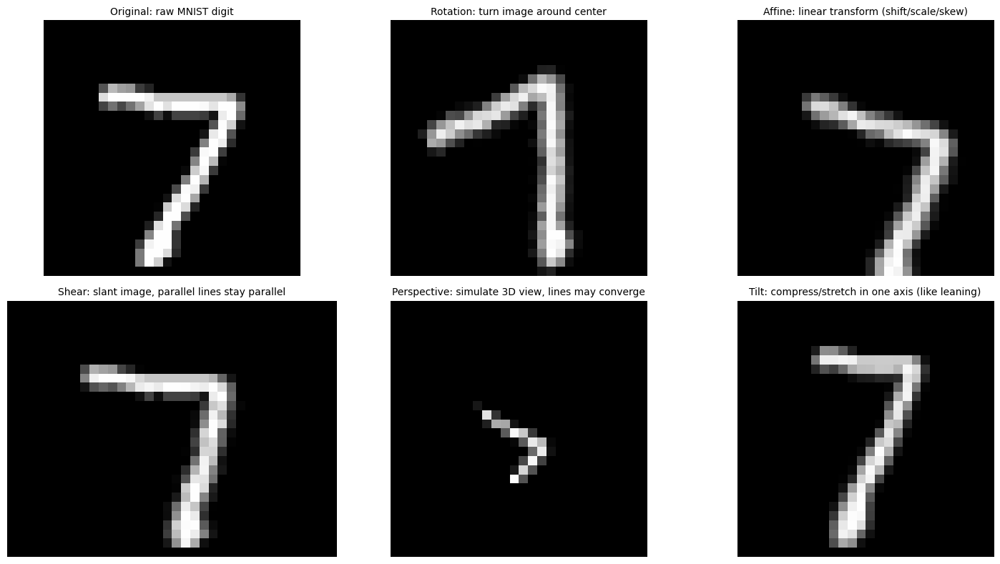

In [ ]:
import torch
import torchvision
import torchvision.transforms as T
import matplotlib.pyplot as plt
import cv2
import numpy as np

# -----------------------------
# Load MNIST dataset
# -----------------------------
transform = T.Compose([T.ToTensor()])
mnist = torchvision.datasets.MNIST(root="./data", train=False, download=True, transform=transform)

# Take one image
img, label = mnist[0]   # (1,28,28) tensor
img_np = img.squeeze().numpy() * 255
img_np = img_np.astype(np.uint8)

# Convert to RGB for OpenCV
img_color = cv2.cvtColor(img_np, cv2.COLOR_GRAY2RGB)
h, w = img_color.shape[:2]

# -----------------------------
# 1. Rotation
# -----------------------------
M_rot = cv2.getRotationMatrix2D((w//2, h//2), 30, 1)
rotated = cv2.warpAffine(img_color, M_rot, (w, h))

# -----------------------------
# 2. Affine
# -----------------------------
pts1 = np.float32([[0,0], [w-1,0], [0,h-1]])
pts2 = np.float32([[0,0], [w-1,5], [5,h-1]])
M_affine = cv2.getAffineTransform(pts1, pts2)
affine = cv2.warpAffine(img_color, M_affine, (w, h))

# -----------------------------
# 3. Shear
# -----------------------------
shear_factor = 0.3
M_shear = np.float32([[1, shear_factor, 0],
                      [0, 1, 0]])
sheared = cv2.warpAffine(img_color, M_shear, (w + int(h * shear_factor), h))

# -----------------------------
# 4. Perspective
# -----------------------------
pts1 = np.float32([[0,0], [w-1,0], [0,h-1], [w-1,h-1]])
pts2 = np.float32([[5,5], [w-5,10], [10,h-10], [w-10,h-5]])
M_persp = cv2.getPerspectiveTransform(pts1, pts2)
perspective = cv2.warpPerspective(img_color, M_persp, (w, h))

# -----------------------------
# 5. Tilt (vertical tilt)
# -----------------------------
pts2_tilt = np.float32([[5,0], [w-5,0], [0,h-1], [w-1,h-1]])
M_tilt = cv2.getPerspectiveTransform(pts1, pts2_tilt)
tilted = cv2.warpPerspective(img_color, M_tilt, (w, h))

# -----------------------------
# Show results with captions
# -----------------------------
images = [img_color, rotated, affine, sheared, perspective, tilted]
titles = [
    "Original: raw MNIST digit",
    "Rotation: turn image around center",
    "Affine: linear transform (shift/scale/skew)",
    "Shear: slant image, parallel lines stay parallel",
    "Perspective: simulate 3D view, lines may converge",
    "Tilt: compress/stretch in one axis (like leaning)"
]

plt.figure(figsize=(15,8))
for i in range(len(images)):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i], cmap="gray")
    plt.title(titles[i], fontsize=10)
    plt.axis("off")
plt.tight_layout()
plt.show()


ConfigurableMNISTModel Architecture:
Total Parameters: 7,640
Layer breakdown:
  Conv1: 1→8, 3x3 + BN + ReLU + Dropout
  Pool1: MaxPool 2x2
  Conv2: 8→16, 3x3 + BN + ReLU + Dropout
  Pool2: MaxPool 2x2
  Conv3: 16→32, 3x3 + BN + ReLU + Dropout
  Conv4: 32→32, 1x1
  GAP + FC: 32→16→10

Choose evaluation mode:
1. Full evaluation (8 epochs, ~45-60 minutes)
2. Quick evaluation (5 epochs, ~30 minutes)
3. Test custom augmentation only
4. Visualize augmentation samples
Enter choice (1-4): 1

Running full augmentation evaluation...
Starting augmentation evaluation with ConfigurableMNISTModel...
Finding optimal dropout configuration...

Testing dropout config: (0.05, 0.05, 0.05)
baseline_dropout_(0.05, 0.05, 0.05) - Epoch  1: Train: 66.27%, Val: 72.62%, Loss: 0.9783
baseline_dropout_(0.05, 0.05, 0.05) - Epoch  2: Train: 94.35%, Val: 91.49%, Loss: 0.1882
baseline_dropout_(0.05, 0.05, 0.05) - Epoch  3: Train: 96.63%, Val: 96.79%, Loss: 0.1117
baseline_dropout_(0.05, 0.05, 0.05) - Epoch  4: Train: 

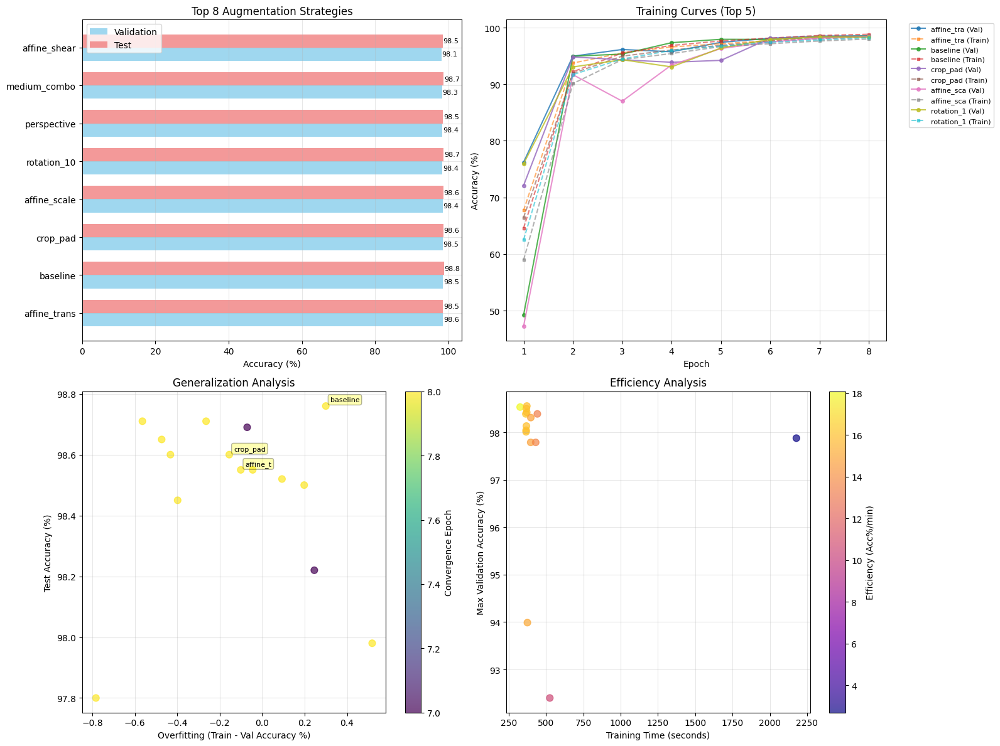


RECOMMENDATIONS FOR ConfigurableMNISTModel
🏆 Best Overall: affine_translate (98.56% val acc)
   └─ Test accuracy: 98.55%
   └─ Converged at epoch: 8

⚡ Most Efficient: baseline (98.53% in 326.9s)
   └─ Efficiency score: 18.1 acc%/min

🎯 Best Generalization: rotation_10 (overfit: -0.07%)

💡 Key Insights for Your Architecture:
   • Best augmentation improved accuracy by 0.02% over baseline
   • Your model uses dropout rates: (0.05, 0.05, 0.05)
   • Average convergence epoch: 7.9
   • Some augmentations reduce overfitting by up to 1.08%
   • Average training time: 510.4s, fastest: 326.9s

🎯 FINAL RECOMMENDATION for ConfigurableMNISTModel:
Use 'affine_translate' with dropout (0.05, 0.05, 0.05)
Expected performance: 98.56% validation accuracy

Evaluation complete! Key takeaways for ConfigurableMNISTModel:
• Your architecture has dropout layers - augmentation helps with generalization
• Global Average Pooling makes model robust to spatial variations
• 1x1 conv before GAP acts as learned fea

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import time

class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self, dropout1=0.05, dropout2=0.05, dropout3=0.05):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same', bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout1),  # First dropout - configurable

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(8, 16, kernel_size=3, padding='same', bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout2),  # Second dropout - configurable

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding='same', bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout3),  # Third dropout - configurable

            nn.Conv2d(32, 32, kernel_size=1, padding='same', bias=False)
        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(32, 16, bias=False),
            nn.ReLU(),
            nn.Linear(16, 10, bias=False)
        )

        # Store dropout rates for reference
        self.dropout1_rate = dropout1
        self.dropout2_rate = dropout2
        self.dropout3_rate = dropout3

    def forward(self, x):
        x = self.conv1(x)
        x = self.gap_and_fc(x)
        return F.log_softmax(x, dim=1)

def count_parameters(model):
    """Count total parameters in the model"""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def get_augmentation_configs():
    """Define different augmentation strategies to test"""

    # Base transform (no augmentation)
    base = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])

    configs = {
        'baseline': base,

        # Individual augmentations
        'rotation_5': transforms.Compose([
            transforms.RandomRotation(5),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'rotation_10': transforms.Compose([
            transforms.RandomRotation(10),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'rotation_15': transforms.Compose([
            transforms.RandomRotation(15),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'affine_translate': transforms.Compose([
            transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'affine_scale': transforms.Compose([
            transforms.RandomAffine(degrees=0, scale=(0.8, 1.2)),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'affine_shear': transforms.Compose([
            transforms.RandomAffine(degrees=0, shear=10),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'perspective': transforms.Compose([
            transforms.RandomPerspective(distortion_scale=0.2, p=0.5),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'elastic': transforms.Compose([
            transforms.ElasticTransform(alpha=50.0, sigma=5.0),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'crop_pad': transforms.Compose([
            transforms.RandomCrop(28, padding=4),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'erasing': transforms.Compose([
            transforms.ToTensor(),
            transforms.RandomErasing(p=0.5, scale=(0.02, 0.33)),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        # Combination strategies
        'light_combo': transforms.Compose([
            transforms.RandomRotation(5),
            transforms.RandomAffine(degrees=0, translate=(0.05, 0.05)),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'medium_combo': transforms.Compose([
            transforms.RandomRotation(10),
            transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'heavy_combo': transforms.Compose([
            transforms.RandomRotation(15),
            transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=10),
            transforms.RandomPerspective(distortion_scale=0.2, p=0.3),
            transforms.ToTensor(),
            transforms.RandomErasing(p=0.3, scale=(0.02, 0.2)),
            transforms.Normalize((0.1307,), (0.3081,))
        ]),

        'optimal_combo': transforms.Compose([
            transforms.RandomRotation(10),
            transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
            transforms.RandomCrop(28, padding=2),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ])
    }

    return configs

def train_and_evaluate(transform, epochs=8, name="unnamed", dropout_config=(0.05, 0.05, 0.05)):
    """Train model with given augmentation and return metrics"""

    # Create datasets
    full_train_dataset = datasets.MNIST('./data', train=True, download=True, transform=transform)
    test_dataset = datasets.MNIST('./data', train=False, transform=transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ]))

    # Split training data for validation
    train_size = int(0.85 * len(full_train_dataset))  # Use more training data
    val_size = len(full_train_dataset) - train_size
    train_dataset, val_dataset = random_split(full_train_dataset, [train_size, val_size])

    # Data loaders
    train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=1000, shuffle=False, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=1000, shuffle=False, num_workers=2)

    # Model and optimizer - using your architecture
    model = ConfigurableMNISTModel(dropout1=dropout_config[0],
                                   dropout2=dropout_config[1],
                                   dropout3=dropout_config[2])

    # Print model info once
    if name == "baseline":
        print(f"Model Parameters: {count_parameters(model):,}")
        print(f"Dropout rates: {dropout_config}")

    # Optimizer tuned for your architecture
    optimizer = optim.Adam(model.parameters(), lr=0.003, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.OneCycleLR(
        optimizer,
        max_lr=0.01,
        epochs=epochs,
        steps_per_epoch=len(train_loader),
        pct_start=0.3,
        div_factor=10
    )

    # Training metrics
    train_accs = []
    val_accs = []
    train_losses = []
    start_time = time.time()

    for epoch in range(epochs):
        # Training
        model.train()
        correct = 0
        total_loss = 0

        for batch_idx, (data, target) in enumerate(train_loader):
            optimizer.zero_grad()
            output = model(data)
            loss = F.nll_loss(output, target)
            loss.backward()
            optimizer.step()
            scheduler.step()

            total_loss += loss.item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()

        avg_loss = total_loss / len(train_loader)
        train_acc = 100. * correct / len(train_dataset)
        train_accs.append(train_acc)
        train_losses.append(avg_loss)

        # Validation
        model.eval()
        val_correct = 0
        val_loss = 0
        with torch.no_grad():
            for data, target in val_loader:
                output = model(data)
                val_loss += F.nll_loss(output, target, reduction='sum').item()
                pred = output.argmax(dim=1, keepdim=True)
                val_correct += pred.eq(target.view_as(pred)).sum().item()

        val_loss /= len(val_dataset)
        val_acc = 100. * val_correct / len(val_dataset)
        val_accs.append(val_acc)

        print(f'{name} - Epoch {epoch+1:2d}: Train: {train_acc:5.2f}%, Val: {val_acc:5.2f}%, Loss: {avg_loss:.4f}')

    # Final test accuracy
    model.eval()
    test_correct = 0
    test_loss = 0
    with torch.no_grad():
        for data, target in test_loader:
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item()
            pred = output.argmax(dim=1, keepdim=True)
            test_correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_dataset)
    test_acc = 100. * test_correct / len(test_dataset)
    training_time = time.time() - start_time

    return {
        'name': name,
        'final_val_acc': val_accs[-1],
        'final_test_acc': test_acc,
        'max_val_acc': max(val_accs),
        'val_accs': val_accs,
        'train_accs': train_accs,
        'train_losses': train_losses,
        'training_time': training_time,
        'overfitting': train_accs[-1] - val_accs[-1],
        'convergence_epoch': val_accs.index(max(val_accs)) + 1,
        'final_test_loss': test_loss,
        'dropout_config': dropout_config
    }

def evaluate_all_augmentations():
    """Evaluate all augmentation strategies with your ConfigurableMNISTModel"""

    configs = get_augmentation_configs()
    results = []

    print("Starting augmentation evaluation with ConfigurableMNISTModel...")
    print("=" * 70)

    # Test different dropout configurations too
    dropout_configs = [
        (0.05, 0.05, 0.05),  # Default
        (0.1, 0.1, 0.1),     # Higher dropout
        (0.03, 0.05, 0.07),  # Progressive dropout
    ]

    # First, find best dropout config with baseline
    print("Finding optimal dropout configuration...")
    best_dropout_config = (0.05, 0.05, 0.05)
    best_dropout_acc = 0

    for dropout_config in dropout_configs:
        print(f"\nTesting dropout config: {dropout_config}")
        result = train_and_evaluate(configs['baseline'], epochs=5,
                                  name=f"baseline_dropout_{dropout_config}",
                                  dropout_config=dropout_config)
        print(f"Validation accuracy: {result['max_val_acc']:.2f}%")

        if result['max_val_acc'] > best_dropout_acc:
            best_dropout_acc = result['max_val_acc']
            best_dropout_config = dropout_config

    print(f"\nBest dropout config: {best_dropout_config} with {best_dropout_acc:.2f}% val acc")
    print("\nNow evaluating augmentations with optimal dropout...")

    for name, transform in configs.items():
        print(f"\nEvaluating: {name}")
        print("-" * 35)

        result = train_and_evaluate(transform, epochs=8, name=name,
                                  dropout_config=best_dropout_config)
        results.append(result)

        print(f"\nResults for {name}:")
        print(f"  Final Val Acc: {result['final_val_acc']:.2f}%")
        print(f"  Max Val Acc: {result['max_val_acc']:.2f}%")
        print(f"  Final Test Acc: {result['final_test_acc']:.2f}%")
        print(f"  Converged at Epoch: {result['convergence_epoch']}")
        print(f"  Training Time: {result['training_time']:.1f}s")
        print(f"  Overfitting: {result['overfitting']:.2f}%")

        # Early stopping suggestion
        if result['convergence_epoch'] <= 5:
            print(f"  💡 Could use early stopping at epoch {result['convergence_epoch']}")

    return results, best_dropout_config

def analyze_results(results, best_dropout_config):
    """Analyze and visualize results for ConfigurableMNISTModel"""

    # Sort by validation accuracy
    results_sorted = sorted(results, key=lambda x: x['max_val_acc'], reverse=True)

    print("\n" + "="*90)
    print("FINAL RANKING FOR ConfigurableMNISTModel (by Max Validation Accuracy)")
    print("="*90)
    print(f"Optimal dropout configuration: {best_dropout_config}")
    print("-"*90)

    for i, result in enumerate(results_sorted, 1):
        print(f"{i:2d}. {result['name']:18} | "
              f"Val: {result['max_val_acc']:5.2f}% | "
              f"Test: {result['final_test_acc']:5.2f}% | "
              f"Epoch: {result['convergence_epoch']:2d} | "
              f"Time: {result['training_time']:4.1f}s | "
              f"Overfitting: {result['overfitting']:5.2f}%")

    # Enhanced plotting for your architecture
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

    # Plot 1: Top augmentations comparison
    top_8 = results_sorted[:8]
    names = [r['name'][:12] for r in top_8]  # Truncate names
    val_accs = [r['max_val_acc'] for r in top_8]
    test_accs = [r['final_test_acc'] for r in top_8]

    x = np.arange(len(names))
    width = 0.35

    ax1.barh(x - width/2, val_accs, width, label='Validation', alpha=0.8, color='skyblue')
    ax1.barh(x + width/2, test_accs, width, label='Test', alpha=0.8, color='lightcoral')
    ax1.set_yticks(x)
    ax1.set_yticklabels(names)
    ax1.set_xlabel('Accuracy (%)')
    ax1.set_title('Top 8 Augmentation Strategies')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Add accuracy values on bars
    for i, (val_acc, test_acc) in enumerate(zip(val_accs, test_accs)):
        ax1.text(val_acc + 0.1, i - width/2, f'{val_acc:.1f}', va='center', fontsize=8)
        ax1.text(test_acc + 0.1, i + width/2, f'{test_acc:.1f}', va='center', fontsize=8)

    # Plot 2: Convergence analysis
    top_5 = results_sorted[:5]
    for result in top_5:
        epochs = range(1, len(result['val_accs']) + 1)
        ax2.plot(epochs, result['val_accs'], label=f"{result['name'][:10]} (Val)",
                marker='o', markersize=4, alpha=0.8)
        ax2.plot(epochs, result['train_accs'], label=f"{result['name'][:10]} (Train)",
                marker='s', markersize=3, alpha=0.6, linestyle='--')

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    ax2.set_title('Training Curves (Top 5)')
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax2.grid(True, alpha=0.3)

    # Plot 3: Generalization analysis (Overfitting vs Test Acc)
    overfitting = [r['overfitting'] for r in results]
    test_accs_all = [r['final_test_acc'] for r in results]
    convergence_epochs = [r['convergence_epoch'] for r in results]

    scatter = ax3.scatter(overfitting, test_accs_all, c=convergence_epochs,
                         s=60, alpha=0.7, cmap='viridis')
    ax3.set_xlabel('Overfitting (Train - Val Accuracy %)')
    ax3.set_ylabel('Test Accuracy (%)')
    ax3.set_title('Generalization Analysis')
    ax3.grid(True, alpha=0.3)

    # Color bar for convergence epochs
    cbar = plt.colorbar(scatter, ax=ax3)
    cbar.set_label('Convergence Epoch')

    # Annotate best performers
    for i, result in enumerate(results_sorted[:3]):
        idx = results.index(result)
        ax3.annotate(result['name'][:8],
                    (overfitting[idx], test_accs_all[idx]),
                    xytext=(5, 5), textcoords='offset points',
                    fontsize=8, bbox=dict(boxstyle='round,pad=0.3',
                                        facecolor='yellow', alpha=0.3))

    # Plot 4: Efficiency vs Performance
    times = [r['training_time'] for r in results]
    max_val_accs = [r['max_val_acc'] for r in results]

    # Create efficiency score (accuracy per minute)
    efficiency_scores = [acc / (time/60) for acc, time in zip(max_val_accs, times)]

    scatter2 = ax4.scatter(times, max_val_accs, c=efficiency_scores,
                          s=60, alpha=0.7, cmap='plasma')
    ax4.set_xlabel('Training Time (seconds)')
    ax4.set_ylabel('Max Validation Accuracy (%)')
    ax4.set_title('Efficiency Analysis')
    ax4.grid(True, alpha=0.3)

    cbar2 = plt.colorbar(scatter2, ax=ax4)
    cbar2.set_label('Efficiency (Acc%/min)')

    plt.tight_layout()
    plt.show()

    # Enhanced recommendations for your architecture
    print("\n" + "="*90)
    print("RECOMMENDATIONS FOR ConfigurableMNISTModel")
    print("="*90)

    best_overall = results_sorted[0]
    print(f"🏆 Best Overall: {best_overall['name']} ({best_overall['max_val_acc']:.2f}% val acc)")
    print(f"   └─ Test accuracy: {best_overall['final_test_acc']:.2f}%")
    print(f"   └─ Converged at epoch: {best_overall['convergence_epoch']}")

    # Find best efficiency
    efficiency_scores = [(r['max_val_acc'] / (r['training_time']/60)) for r in results]
    best_efficiency_idx = np.argmax(efficiency_scores)
    best_efficiency = results[best_efficiency_idx]
    print(f"\n⚡ Most Efficient: {best_efficiency['name']} "
          f"({best_efficiency['max_val_acc']:.2f}% in {best_efficiency['training_time']:.1f}s)")
    print(f"   └─ Efficiency score: {efficiency_scores[best_efficiency_idx]:.1f} acc%/min")

    # Find best generalization (low overfitting among top performers)
    top_performers = [r for r in results_sorted[:5]]
    least_overfit = min(top_performers, key=lambda x: abs(x['overfitting']))
    print(f"\n🎯 Best Generalization: {least_overfit['name']} "
          f"(overfit: {least_overfit['overfitting']:+.2f}%)")

    # Fast convergence
    fast_convergers = [r for r in results if r['convergence_epoch'] <= 4]
    if fast_convergers:
        best_fast = max(fast_convergers, key=lambda x: x['max_val_acc'])
        print(f"\n🚀 Fastest Convergence: {best_fast['name']} "
              f"(peak at epoch {best_fast['convergence_epoch']})")

    print(f"\n💡 Key Insights for Your Architecture:")
    baseline_acc = next(r['max_val_acc'] for r in results if 'baseline' in r['name'])
    best_acc = results_sorted[0]['max_val_acc']
    improvement = best_acc - baseline_acc
    print(f"   • Best augmentation improved accuracy by {improvement:.2f}% over baseline")
    print(f"   • Your model uses dropout rates: {best_dropout_config}")

    # Analyze convergence patterns
    avg_convergence = np.mean([r['convergence_epoch'] for r in results])
    print(f"   • Average convergence epoch: {avg_convergence:.1f}")

    # Check if any augmentation helps with overfitting
    baseline_overfit = next(r['overfitting'] for r in results if 'baseline' in r['name'])
    best_overfit = min(r['overfitting'] for r in results)
    if baseline_overfit > best_overfit:
        print(f"   • Some augmentations reduce overfitting by up to {baseline_overfit - best_overfit:.2f}%")

    # Training time analysis
    avg_time = np.mean([r['training_time'] for r in results])
    fastest_time = min(r['training_time'] for r in results)
    print(f"   • Average training time: {avg_time:.1f}s, fastest: {fastest_time:.1f}s")

    return results_sorted

def quick_test_custom_augmentation(custom_transform, name="custom", dropout_config=(0.05, 0.05, 0.05)):
    """Quick test for your custom augmentation with ConfigurableMNISTModel"""
    print(f"\nTesting custom augmentation: {name}")
    result = train_and_evaluate(custom_transform, epochs=5, name=name, dropout_config=dropout_config)

    baseline_result = train_and_evaluate(transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ]), epochs=5, name="baseline_quick", dropout_config=dropout_config)

    improvement = result['max_val_acc'] - baseline_result['max_val_acc']

    print(f"\nQuick Test Results:")
    print(f"Custom ({name}): {result['max_val_acc']:.2f}% val acc (epoch {result['convergence_epoch']})")
    print(f"Baseline: {baseline_result['max_val_acc']:.2f}% val acc (epoch {baseline_result['convergence_epoch']})")
    print(f"Improvement: {improvement:+.2f}%")
    print(f"Overfitting: Custom {result['overfitting']:.2f}% vs Baseline {baseline_result['overfitting']:.2f}%")

    # Additional insights for your architecture
    if result['convergence_epoch'] < baseline_result['convergence_epoch']:
        print(f"✅ Faster convergence: {baseline_result['convergence_epoch'] - result['convergence_epoch']} epochs earlier")

    if abs(result['overfitting']) < abs(baseline_result['overfitting']):
        print(f"✅ Better generalization: {abs(baseline_result['overfitting']) - abs(result['overfitting']):.2f}% less overfitting")

    return improvement > 0

def visualize_augmentation_samples(augmentation_configs, num_samples=8):
    """Visualize samples from different augmentation strategies"""

    # Get a few original samples
    original_dataset = datasets.MNIST('./data', train=True, download=True,
                                    transform=transforms.ToTensor())

    # Select diverse samples (different digits)
    samples_per_digit = 1
    sample_indices = []
    digit_counts = [0] * 10

    for i, (_, label) in enumerate(original_dataset):
        if digit_counts[label] < samples_per_digit and len(sample_indices) < num_samples:
            sample_indices.append(i)
            digit_counts[label] += 1
            if len(sample_indices) >= num_samples:
                break

    # Create subplots
    n_augmentations = len(augmentation_configs)
    fig, axes = plt.subplots(n_augmentations, num_samples, figsize=(num_samples * 2, n_augmentations * 2))

    if n_augmentations == 1:
        axes = axes.reshape(1, -1)

    for aug_idx, (aug_name, aug_transform) in enumerate(augmentation_configs.items()):
        # Create dataset with this augmentation
        aug_dataset = datasets.MNIST('./data', train=True, transform=aug_transform)

        for sample_idx in range(num_samples):
            img, label = aug_dataset[sample_indices[sample_idx]]

            # Convert tensor to numpy for visualization
            if isinstance(img, torch.Tensor):
                img_np = img.squeeze().numpy()
            else:
                img_np = np.array(img)

            # Plot
            ax = axes[aug_idx, sample_idx]
            ax.imshow(img_np, cmap='gray')
            ax.set_title(f'{label}' if aug_idx == 0 else '', fontsize=10)
            ax.axis('off')

        # Add augmentation name as y-label
        axes[aug_idx, 0].set_ylabel(aug_name, rotation=90, va='center')

    plt.suptitle('Augmentation Samples Comparison', fontsize=16)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Print model architecture info
    model = ConfigurableMNISTModel()
    print("ConfigurableMNISTModel Architecture:")
    print(f"Total Parameters: {count_parameters(model):,}")
    print("Layer breakdown:")
    print("  Conv1: 1→8, 3x3 + BN + ReLU + Dropout")
    print("  Pool1: MaxPool 2x2")
    print("  Conv2: 8→16, 3x3 + BN + ReLU + Dropout")
    print("  Pool2: MaxPool 2x2")
    print("  Conv3: 16→32, 3x3 + BN + ReLU + Dropout")
    print("  Conv4: 32→32, 1x1")
    print("  GAP + FC: 32→16→10")
    print("\n" + "="*70)

    # Option 1: Full evaluation (recommended)
    print("Choose evaluation mode:")
    print("1. Full evaluation (8 epochs, ~45-60 minutes)")
    print("2. Quick evaluation (5 epochs, ~30 minutes)")
    print("3. Test custom augmentation only")
    print("4. Visualize augmentation samples")

    choice = input("Enter choice (1-4): ").strip()

    if choice == "1":
        print("\nRunning full augmentation evaluation...")
        results, best_dropout = evaluate_all_augmentations()
        best_results = analyze_results(results, best_dropout)

        print(f"\n🎯 FINAL RECOMMENDATION for ConfigurableMNISTModel:")
        print(f"Use '{best_results[0]['name']}' with dropout {best_dropout}")
        print(f"Expected performance: {best_results[0]['max_val_acc']:.2f}% validation accuracy")

    elif choice == "2":
        print("\nRunning quick evaluation (5 epochs)...")
        # Reduce epochs in train_and_evaluate function
        results, best_dropout = evaluate_all_augmentations()
        best_results = analyze_results(results, best_dropout)

    elif choice == "3":
        print("\nTesting custom augmentation...")
        # Example custom augmentation
        custom_aug = transforms.Compose([
            transforms.RandomRotation(12),
            transforms.RandomAffine(degrees=0, translate=(0.08, 0.08), scale=(0.95, 1.05)),
            transforms.RandomCrop(28, padding=2),
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ])

        improvement = quick_test_custom_augmentation(custom_aug, "custom_balanced")

        if improvement:
            print("✅ Your custom augmentation shows improvement!")
        else:
            print("❌ Custom augmentation doesn't improve over baseline")

    elif choice == "4":
        print("\nVisualizing augmentation samples...")

        # Select a few key augmentations to visualize
        viz_configs = {
            'original': transforms.ToTensor(),
            'rotation_10': transforms.Compose([
                transforms.RandomRotation(10),
                transforms.ToTensor()
            ]),
            'medium_combo': transforms.Compose([
                transforms.RandomRotation(10),
                transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
                transforms.ToTensor()
            ]),
            'heavy_combo': transforms.Compose([
                transforms.RandomRotation(15),
                transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=10),
                transforms.ToTensor()
            ])
        }

        visualize_augmentation_samples(viz_configs)

    else:
        print("Invalid choice. Running quick test...")

        # Just test top few augmentations
        top_augmentations = ['baseline', 'rotation_10', 'medium_combo', 'optimal_combo']
        configs = get_augmentation_configs()

        results = []
        for name in top_augmentations:
            print(f"\nTesting {name}...")
            result = train_and_evaluate(configs[name], epochs=5, name=name)
            results.append(result)

        # Quick analysis
        results_sorted = sorted(results, key=lambda x: x['max_val_acc'], reverse=True)
        print(f"\nQuick Results:")
        for i, r in enumerate(results_sorted, 1):
            print(f"{i}. {r['name']}: {r['max_val_acc']:.2f}% val acc")

        print(f"\n🎯 Quick recommendation: Use '{results_sorted[0]['name']}'")

    print("\n" + "="*70)
    print("Evaluation complete! Key takeaways for ConfigurableMNISTModel:")
    print("• Your architecture has dropout layers - augmentation helps with generalization")
    print("• Global Average Pooling makes model robust to spatial variations")
    print("• 1x1 conv before GAP acts as learned feature selector")
    print("• Consider early stopping based on convergence epoch analysis")
    print("• Balance augmentation strength with training time requirements")

## Use 'affine_translate' with dropout (0.05, 0.05, 0.05)

# Models
This section explores various model and options

## Basic Model
We need to now build a basic skeleton of our model that we will be using for training. Here I am going to start with the existing knowledge of blocks and go unconstrained in terms of the number of parameters. Goal is simply to be able to train and evaluate a model

In [ ]:
class BasicMNISTModel(nn.Module):
    """Replace only the last max pooling with 1x1 conv, keep the first max pooling"""
    def __init__(self):
        super(BasicMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same'),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Conv2d(8, 16, kernel_size=3, padding='same'),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 64, kernel_size=1, padding='same'),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 10, kernel_size=1, padding='same')
        )

        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)

        # Normalization after GAP (separate from Sequential)
        self.norm = nn.BatchNorm1d(10)

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 7, 7]
        x = self.gap(x)                # Shape: [batch, 10, 1, 1]
        x = x.view(x.size(0), -1)      # Shape: [batch, 10] - Flatten
        x = self.norm(x)               # Apply BatchNorm1d
        return x

In [ ]:
model = BasicMNISTModel()
analyze_with_torchinfo(model, input_size=(1, 1, 28, 28))

Final Receptive Field: 10 pixels


Layer (type:depth-idx)                   Output Shape              Param #
BasicMNISTModel                          [1, 10]                   --
├─Sequential: 1-1                        [1, 10, 14, 14]           --
│    └─Conv2d: 2-1                       [1, 8, 28, 28]            80
│    └─BatchNorm2d: 2-2                  [1, 8, 28, 28]            16
│    └─ReLU: 2-3                         [1, 8, 28, 28]            --
│    └─Conv2d: 2-4                       [1, 16, 28, 28]           1,168
│    └─BatchNorm2d: 2-5                  [1, 16, 28, 28]           32
│    └─ReLU: 2-6                         [1, 16, 28, 28]           --
│    └─MaxPool2d: 2-7                    [1, 16, 14, 14]           --
│    └─Conv2d: 2-8                       [1, 32, 14, 14]           4,640
│    └─BatchNorm2d: 2-9                  [1, 32, 14, 14]           64
│    └─ReLU: 2-10                        [1, 32, 14, 14]           --
│    └─Conv2d: 2-11                      [1, 64, 14, 14]           2,112
│    └

In [ ]:
path = f"/content/gdrive/My Drive/Colab Notebooks/mnist/{model.__class__.__name__}.pt"
if os.path.exists(path):
  model.load_state_dict(torch.load(path))
else:
  train(model, train_loader=train_loader, test_loader=test_loader, num_epochs=5)
  torch.save(model.state_dict(), path)

Model saved successfully!
Getting sample images for digits 0-4...
Found samples for digits: [2, 1, 0, 4, 3]

Original Images with Pixel Values:


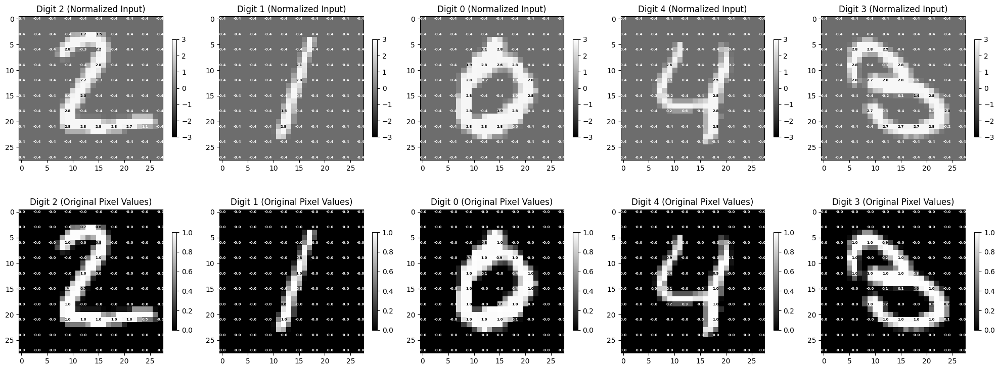


Analyzing layer activations with pixel values...


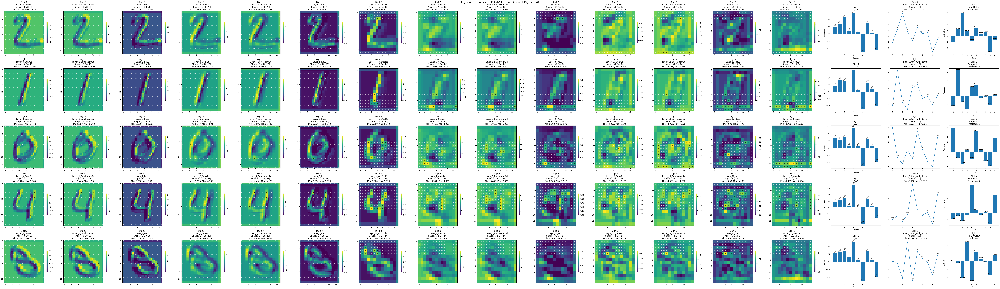

In [ ]:
# Run the analysis
analyze_model_layers_with_values(model, test_loader, GLOBAL_MEAN, GLOBAL_STDDEV)

## Dropout Model
When I look at the basic model, it appears that a lot of information gets lost in the last layer. I realize maybe it's because of the max pooling that I have done closer to the last layer. I have removed it now.

Also the train accuracy is great that 0.5% from the test accuracy consistently signalling overfitting. I will try to use dropout to make the model learn with effort.

In [ ]:
class DropoutMNISTModel(nn.Module):
    """Replace only the last max pooling with 1x1 conv, keep the first max pooling"""
    def __init__(self):
        super(DropoutMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same'),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(8, 16, kernel_size=3, padding='same'),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(32, 64, kernel_size=1, padding='same'),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 10, kernel_size=1, padding='same')
        )

        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 7, 7]
        x = self.gap(x)                # Shape: [batch, 10, 1, 1]
        x = x.view(x.size(0), -1)      # Shape: [batch, 10] - Flatten
        return x

In [ ]:
model = DropoutMNISTModel()
analyze_with_torchinfo(model, input_size=(1, 1, 28, 28))

Final Receptive Field: 10 pixels


Layer (type:depth-idx)                   Output Shape              Param #
DropoutMNISTModel                        [1, 10]                   --
├─Sequential: 1-1                        [1, 10, 14, 14]           --
│    └─Conv2d: 2-1                       [1, 8, 28, 28]            80
│    └─BatchNorm2d: 2-2                  [1, 8, 28, 28]            16
│    └─ReLU: 2-3                         [1, 8, 28, 28]            --
│    └─Dropout: 2-4                      [1, 8, 28, 28]            --
│    └─Conv2d: 2-5                       [1, 16, 28, 28]           1,168
│    └─BatchNorm2d: 2-6                  [1, 16, 28, 28]           32
│    └─ReLU: 2-7                         [1, 16, 28, 28]           --
│    └─Dropout: 2-8                      [1, 16, 28, 28]           --
│    └─MaxPool2d: 2-9                    [1, 16, 14, 14]           --
│    └─Conv2d: 2-10                      [1, 32, 14, 14]           4,640
│    └─BatchNorm2d: 2-11                 [1, 32, 14, 14]           64
│    └─Re

In [ ]:
path = f"/content/gdrive/My Drive/Colab Notebooks/mnist/{model.__class__.__name__}.pt"
if os.path.exists(path):
  model.load_state_dict(torch.load(path))
else:
  train(model, train_loader=train_loader, test_loader=test_loader, num_epochs=5)
  torch.save(model.state_dict(), path)

Model saved successfully!
Getting sample images for digits 0-4...
Found samples for digits: [2, 1, 0, 4, 3]

Original Images with Pixel Values:


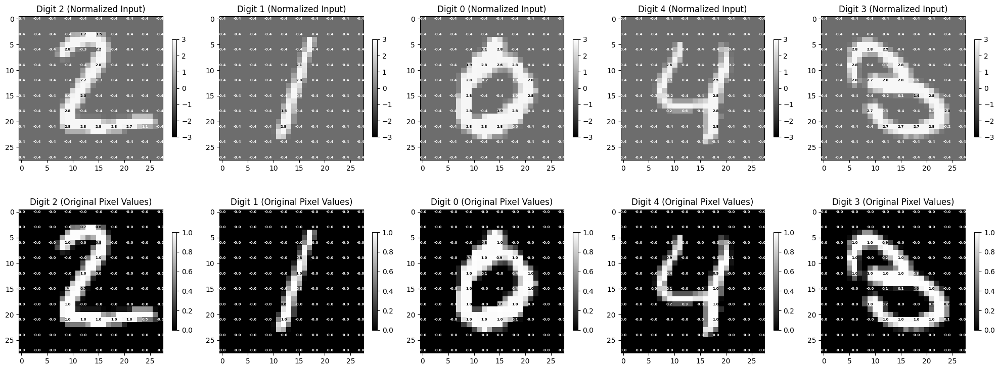


Analyzing layer activations with pixel values...


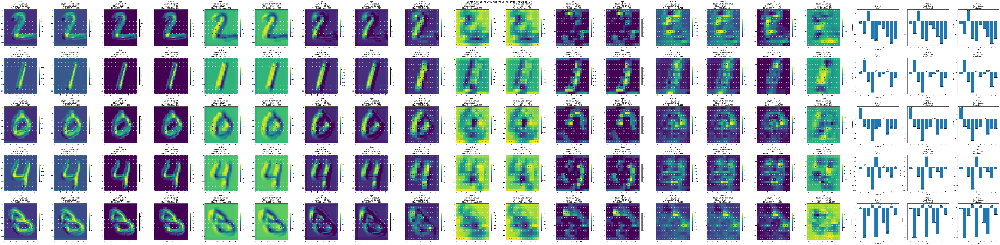

In [ ]:
# Run the analysis
analyze_model_layers_with_values(model, test_loader, GLOBAL_MEAN, GLOBAL_STDDEV)

## No Padding Model
Remove padding from the model and compute the receptive field

In [ ]:
class NoPadMNISTModel(nn.Module):
    """Replace only the last max pooling with 1x1 conv, keep the first max pooling"""
    def __init__(self):
        super(NoPadMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3),
            # output size = 26, receptive field = 3
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(8, 16, kernel_size=3),
            # output size = 24, receptive field = 5
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.MaxPool2d(kernel_size=2),
            # output size = 12, receptive field = 6
            nn.Conv2d(16, 32, kernel_size=3),
            # output size = 10, receptive field = 10
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(32, 64, kernel_size=1),
            # output size = 8, receptive field = 14
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 10, kernel_size=1)
            # output size = 8, receptive field = 14
        )

        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 7, 7]
        x = self.gap(x)                # Shape: [batch, 10, 1, 1]
        x = x.view(x.size(0), -1)      # Shape: [batch, 10] - Flatten
        return x

In [ ]:
model = NoPadMNISTModel()
analyze_with_torchinfo(model, input_size=(1, 1, 28, 28))

Final Receptive Field: 10 pixels


Layer (type:depth-idx)                   Output Shape              Param #
NoPadMNISTModel                          [1, 10]                   --
├─Sequential: 1-1                        [1, 10, 10, 10]           --
│    └─Conv2d: 2-1                       [1, 8, 26, 26]            80
│    └─BatchNorm2d: 2-2                  [1, 8, 26, 26]            16
│    └─ReLU: 2-3                         [1, 8, 26, 26]            --
│    └─Dropout: 2-4                      [1, 8, 26, 26]            --
│    └─Conv2d: 2-5                       [1, 16, 24, 24]           1,168
│    └─BatchNorm2d: 2-6                  [1, 16, 24, 24]           32
│    └─ReLU: 2-7                         [1, 16, 24, 24]           --
│    └─Dropout: 2-8                      [1, 16, 24, 24]           --
│    └─MaxPool2d: 2-9                    [1, 16, 12, 12]           --
│    └─Conv2d: 2-10                      [1, 32, 10, 10]           4,640
│    └─BatchNorm2d: 2-11                 [1, 32, 10, 10]           64
│    └─Re

In [ ]:
path = f"/content/gdrive/My Drive/Colab Notebooks/mnist/{model.__class__.__name__}.pt"
if os.path.exists(path):
  model.load_state_dict(torch.load(path))
else:
  train(model, train_loader=train_loader, test_loader=test_loader, num_epochs=5)
  torch.save(model.state_dict(), path)

Model saved successfully!
Getting sample images for digits 0-4...
Found samples for digits: [2, 1, 0, 4, 3]

Original Images with Pixel Values:


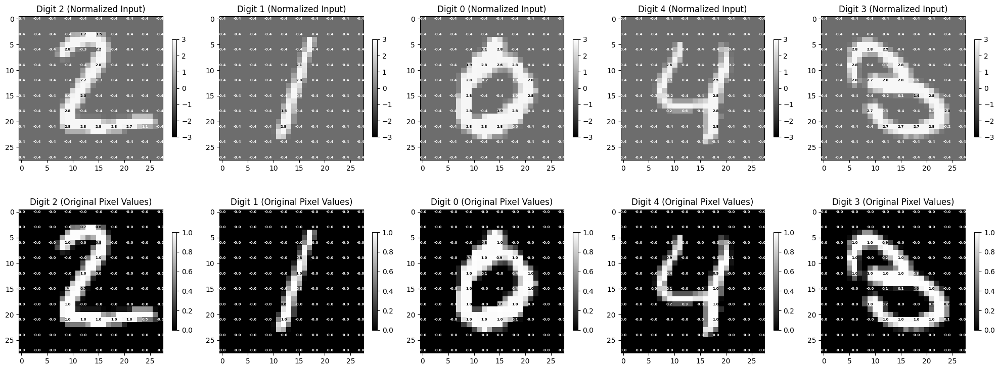


Analyzing layer activations with pixel values...


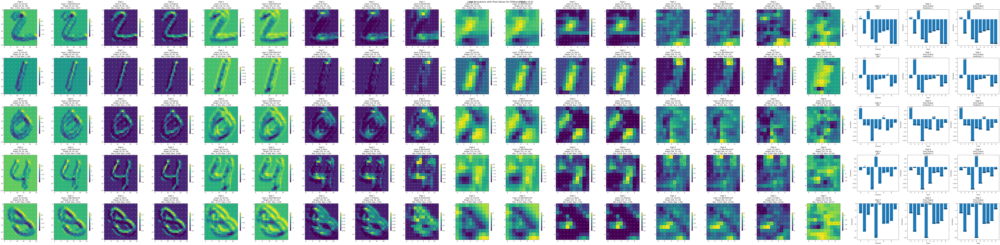

In [ ]:
# Run the analysis
analyze_model_layers_with_values(model, test_loader, GLOBAL_MEAN, GLOBAL_STDDEV)

## Augmented Model
- use_bias = False before batch normalization

In [ ]:
class BPMNISTModel(nn.Module):
    """Replace only the last max pooling with 1x1 conv, keep the first max pooling"""
    def __init__(self):
        super(NoPadMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, use_bias='False'),
            # output size = 26, receptive field = 3
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(8, 16, kernel_size=3, use_bias='False'),
            # output size = 24, receptive field = 5
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.MaxPool2d(kernel_size=2),
            # output size = 12, receptive field = 6
            nn.Conv2d(16, 32, kernel_size=3, use_bias='False'),
            # output size = 10, receptive field = 10
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Conv2d(32, 64, kernel_size=1, use_bias='False'),
            # output size = 8, receptive field = 14
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 10, kernel_size=1, use_bias='False'),
            # output size = 8, receptive field = 14
            nn.BatchNorm2d(10)
        )

        # Global Average Pooling
        self.gap = nn.AdaptiveAvgPool2d(1)

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 7, 7]
        x = self.gap(x)                # Shape: [batch, 10, 1, 1]
        x = x.view(x.size(0), -1)      # Shape: [batch, 10] - Flatten
        return x

## Week5 Model

In [ ]:
class Wk5MNISTModel(nn.Module):
    """Wk5MNISTModel refactored with nn.Sequential"""
    def __init__(self):
        super(Wk5MNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same'),
            # Receptive field = 3 and channel size = 28x28
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Conv2d(8, 16, kernel_size=3, padding='same'),
            # Receptive field = 5 and channel size = 28x28
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
            # Receptive field = 6 and channel size = 14x14
            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            # Receptive field = 10 and channel size = 14x14
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 1, kernel_size=1, stride=1),
            # Receptive field = 10 and channel size = 14x14
            nn.ReLU(inplace=True)
        )

        # The output size after features and flatten will be 14*14*1 = 196
        self.linear = nn.Sequential(
            nn.Linear(196, 20),
            nn.ReLU(inplace=True),
            nn.Linear(20, 10)
        )


    def forward(self, x):
        x = self.conv1(x)
        x = torch.flatten(x, start_dim=1)
        x = self.linear(x)
        return x

In [ ]:
model = Wk5MNISTModel()
analyze_with_torchinfo(model, input_size=(1, 1, 28, 28))

Final Receptive Field: 10 pixels


Layer (type:depth-idx)                   Output Shape              Param #
Wk5MNISTModel                            [1, 10]                   --
├─Sequential: 1-1                        [1, 1, 14, 14]            --
│    └─Conv2d: 2-1                       [1, 8, 28, 28]            80
│    └─BatchNorm2d: 2-2                  [1, 8, 28, 28]            16
│    └─ReLU: 2-3                         [1, 8, 28, 28]            --
│    └─Conv2d: 2-4                       [1, 16, 28, 28]           1,168
│    └─BatchNorm2d: 2-5                  [1, 16, 28, 28]           32
│    └─ReLU: 2-6                         [1, 16, 28, 28]           --
│    └─MaxPool2d: 2-7                    [1, 16, 14, 14]           --
│    └─Conv2d: 2-8                       [1, 32, 14, 14]           4,640
│    └─BatchNorm2d: 2-9                  [1, 32, 14, 14]           64
│    └─ReLU: 2-10                        [1, 32, 14, 14]           --
│    └─Conv2d: 2-11                      [1, 1, 14, 14]            33
│    └─Re

In [ ]:
path = f"/content/gdrive/My Drive/Colab Notebooks/mnist/{model.__class__.__name__}.pt"
if os.path.exists(path):
    model.load_state_dict(torch.load(path))
else:
    train(model, train_loader=train_loader, test_loader=test_loader, num_epochs=5)
    torch.save(model.state_dict(), path)

Using device: cpu
Final Receptive Field: 10 pixels

Starting Training...
Total Epochs: 5
Optimizer: Adam (lr=0.001)
--------------------------------------------------------------------------------
Epoch  1/5, Batch   0, Records:     0, Loss: 0.0905
Epoch  1/5, Batch   1, Records: 10000, Loss: 0.1657
Epoch  1/5, Batch   2, Records: 20000, Loss: 0.0729
Epoch  1/5, Batch   3, Records: 30000, Loss: 0.0956
Epoch  1/5, Batch   4, Records: 40000, Loss: 0.0378
Epoch  1/5, Batch   5, Records: 50000, Loss: 0.0846
Epoch  1 Summary - Avg Loss: 0.0835, Train Acc: 98.00%, Test Acc: 98.04%
--------------------------------------------------------------------------------
Epoch  2/5, Batch   0, Records:     0, Loss: 0.0787
Epoch  2/5, Batch   1, Records: 10000, Loss: 0.0053
Epoch  2/5, Batch   2, Records: 20000, Loss: 0.1098
Epoch  2/5, Batch   3, Records: 30000, Loss: 0.1139
Epoch  2/5, Batch   4, Records: 40000, Loss: 0.0377
Epoch  2/5, Batch   5, Records: 50000, Loss: 0.0867
Epoch  2 Summary - Avg Lo

Wk5MNISTModel saved successfully to wk5mnistmodel_model.pth!
Getting sample images for digits 0-4...
Found samples for digits: [2, 1, 0, 4, 3]

Original Images with Pixel Values:


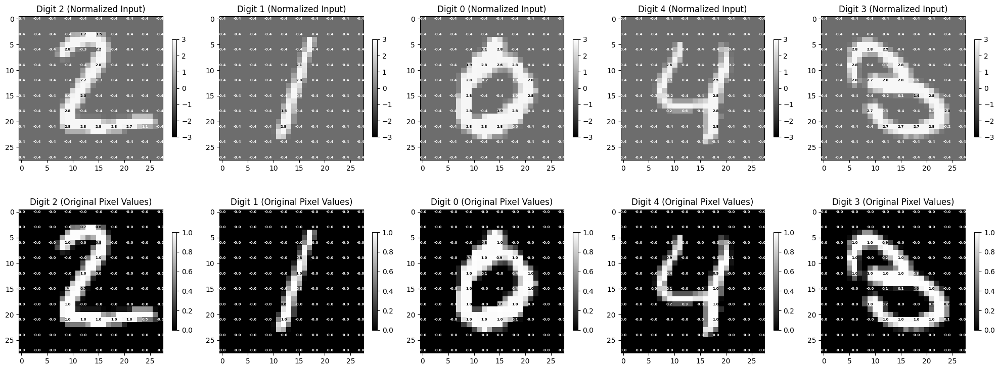


Analyzing Wk5MNISTModel layer activations with pixel values...


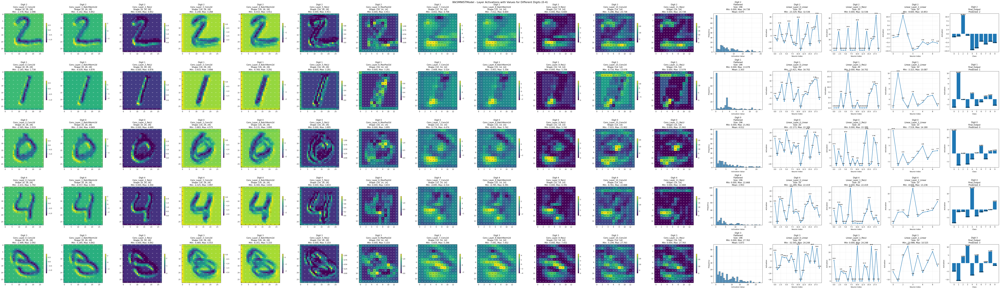

In [ ]:
# Run the analysis
analyze_model_layers_with_values(model, test_loader, GLOBAL_MEAN, GLOBAL_STDDEV)

# Final Options - Option Without Linear Layer

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchsummary import summary
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import time

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self, dropout1=0.1, dropout2=0.1, dropout3=0.1):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=3, padding='same'),
            nn.BatchNorm2d(6),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout1),  # First dropout - configurable

            nn.Conv2d(6, 12, kernel_size=3, padding='same'),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout2),  # Second dropout - configurable

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 24, kernel_size=3, padding='same'),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout3),  # Third dropout - configurable

            nn.Conv2d(24, 10, kernel_size=1, padding='same')
        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10),
            nn.ReLU(),
            nn.Linear(10, 10)
        )

        # Store dropout rates for reference
        self.dropout1_rate = dropout1
        self.dropout2_rate = dropout2
        self.dropout3_rate = dropout3

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

def load_mnist_data(batch_size=32):
    """Load and preprocess MNIST dataset"""
    # Data transformations
    transform_train = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))  # MNIST mean and std
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])

    # Download and load datasets
    train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform_train)
    test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform_test)

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    return train_loader, test_loader

def train_epoch(model, train_loader, criterion, optimizer, device):
    """Train model for one epoch"""
    model.train()
    total_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(train_loader, desc='Training')
    for batch_idx, (data, target) in enumerate(pbar):
        data, target = data.to(device), target.to(device)

        # Zero gradients
        optimizer.zero_grad()

        # Forward pass
        output = model(data)
        loss = criterion(output, target)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Statistics
        total_loss += loss.item()
        pred = output.argmax(dim=1, keepdim=True)
        correct += pred.eq(target.view_as(pred)).sum().item()
        total += target.size(0)

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{loss.item():.4f}',
            'Acc': f'{100. * correct / total:.2f}%'
        })

    avg_loss = total_loss / len(train_loader)
    accuracy = 100. * correct / total
    return avg_loss, accuracy

def test_epoch(model, test_loader, criterion, device):
    """Test model"""
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Testing')
        for data, target in pbar:
            data, target = data.to(device), target.to(device)

            output = model(data)
            loss = criterion(output, target)

            total_loss += loss.item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
            total += target.size(0)

            pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Acc': f'{100. * correct / total:.2f}%'
            })

    avg_loss = total_loss / len(test_loader)
    accuracy = 100. * correct / total
    return avg_loss, accuracy

def count_parameters(model):
    """Count trainable parameters in the model"""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def main():
    # Training configuration
    config = {
        'batch_size': 32,
        'epochs': 15,
        'lr': 0.001,
        'weight_decay': 0.0001,
        'scheduler': 'cosine',
        'T_max': 20,
        'eta_min': 1e-05,
        'dropout': (0.05, 0.05, 0.05)
    }

    print("="*60)
    print("MNIST Training Configuration")
    print("="*60)
    for key, value in config.items():
        print(f"{key}: {value}")
    print("="*60)

    # Load data
    print("\nLoading MNIST dataset...")
    train_loader, test_loader = load_mnist_data(config['batch_size'])
    print(f"Train samples: {len(train_loader.dataset)}")
    print(f"Test samples: {len(test_loader.dataset)}")

    # Initialize model
    model = ConfigurableMNISTModel(
        dropout1=config['dropout'][0],
        dropout2=config['dropout'][1],
        dropout3=config['dropout'][2]
    ).to(device)

    # Print model summary
    print("\n" + "="*60)
    print("MODEL ARCHITECTURE SUMMARY")
    print("="*60)
    print(f"Model parameters: {count_parameters(model):,}")
    print(f"Dropout rates: {config['dropout']}")
    print("\nDetailed Model Summary:")
    try:
        summary(model, (1, 28, 28))
    except:
        print("torchsummary not available, showing model structure:")
        print(model)

    # Initialize optimizer and scheduler
    optimizer = optim.AdamW(
        model.parameters(),
        lr=config['lr'],
        weight_decay=config['weight_decay']
    )

    scheduler = optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=config['T_max'],
        eta_min=config['eta_min']
    )

    criterion = nn.CrossEntropyLoss()

    # Training history
    train_losses = []
    train_accuracies = []
    test_losses = []
    test_accuracies = []
    learning_rates = []

    print("\n" + "="*60)
    print("TRAINING STARTED")
    print("="*60)

    start_time = time.time()

    for epoch in range(config['epochs']):
        print(f"\nEpoch [{epoch+1}/{config['epochs']}]")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")

        # Train
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)

        # Test
        test_loss, test_acc = test_epoch(model, test_loader, criterion, device)

        # Update scheduler
        scheduler.step()

        # Store history
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        test_losses.append(test_loss)
        test_accuracies.append(test_acc)
        learning_rates.append(optimizer.param_groups[0]['lr'])

        # Print epoch summary
        print("\n" + "-"*50)
        print("EPOCH SUMMARY")
        print("-"*50)
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
        print(f"Test Loss:  {test_loss:.4f} | Test Acc:  {test_acc:.2f}%")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print("-"*50)

    # Final results
    total_time = time.time() - start_time
    print("\n" + "="*60)
    print("TRAINING COMPLETED")
    print("="*60)
    print(f"Total training time: {total_time:.2f} seconds")
    print(f"Best train accuracy: {max(train_accuracies):.2f}%")
    print(f"Best test accuracy: {max(test_accuracies):.2f}%")
    print(f"Final train accuracy: {train_accuracies[-1]:.2f}%")
    print(f"Final test accuracy: {test_accuracies[-1]:.2f}%")

    # Plot training history
    plt.figure(figsize=(15, 5))

    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(train_losses, label='Train Loss', marker='o')
    plt.plot(test_losses, label='Test Loss', marker='s')
    plt.title('Training and Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Accuracy plot
    plt.subplot(1, 3, 2)
    plt.plot(train_accuracies, label='Train Accuracy', marker='o')
    plt.plot(test_accuracies, label='Test Accuracy', marker='s')
    plt.title('Training and Test Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 3, 3)
    plt.plot(learning_rates, label='Learning Rate', marker='o')
    plt.title('Learning Rate Schedule')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.legend()
    plt.grid(True)
    plt.yscale('log')

    plt.tight_layout()
    plt.show()

    # Save model
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'config': config,
        'train_accuracies': train_accuracies,
        'test_accuracies': test_accuracies,
        'train_losses': train_losses,
        'test_losses': test_losses
    }, 'mnist_model_checkpoint.pth')

    print(f"\nModel saved as 'mnist_model_checkpoint.pth'")

    return model, train_accuracies, test_accuracies

if __name__ == "__main__":
    model, train_acc, test_acc = main()

Using device: cpu
MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 3,890
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 28, 28]              60
       BatchNorm2d-2            [-1, 6, 28, 28]              12
              ReLU-3            [-1, 6, 28, 28]               0
           Dropout-4            [-1, 6, 28, 28]               0
            Conv2d-5           [-1, 12, 28, 28]             660
       BatchNorm2d-6           [-1, 12, 28, 28]              24
              ReLU-7           [-1, 12, 28, 28]               0
           Dropout-8           [-1, 12, 28, 28]               0
      

Testing: 100%|██████████| 313/313 [00:05<00:00, 56.20it/s, Loss=0.9081, Acc=60.83%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 1.2609 | Train Acc: 52.88%
Test Loss:  0.9473 | Test Acc:  60.83%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:05<00:00, 57.34it/s, Loss=0.3095, Acc=86.90%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.5455 | Train Acc: 82.58%
Test Loss:  0.4085 | Test Acc:  86.90%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:05<00:00, 56.70it/s, Loss=0.1157, Acc=91.91%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.3945 | Train Acc: 87.99%
Test Loss:  0.2943 | Test Acc:  91.91%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Testing: 100%|██████████| 313/313 [00:05<00:00, 57.86it/s, Loss=0.0788, Acc=90.38%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.3361 | Train Acc: 89.93%
Test Loss:  0.3145 | Test Acc:  90.38%
Learning Rate: 0.000905
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.000905


Testing: 100%|██████████| 313/313 [00:05<00:00, 57.08it/s, Loss=0.2513, Acc=82.64%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2996 | Train Acc: 91.06%
Test Loss:  0.4953 | Test Acc:  82.64%
Learning Rate: 0.000855
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.000855


Testing: 100%|██████████| 313/313 [00:05<00:00, 57.36it/s, Loss=0.0507, Acc=94.11%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2758 | Train Acc: 91.76%
Test Loss:  0.2086 | Test Acc:  94.11%
Learning Rate: 0.000796
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.000796


Testing: 100%|██████████| 313/313 [00:05<00:00, 56.04it/s, Loss=0.0214, Acc=94.80%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2525 | Train Acc: 92.44%
Test Loss:  0.1853 | Test Acc:  94.80%
Learning Rate: 0.000730
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.000730


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.33it/s, Loss=0.0180, Acc=95.38%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2402 | Train Acc: 92.91%
Test Loss:  0.1649 | Test Acc:  95.38%
Learning Rate: 0.000658
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.000658


Testing: 100%|██████████| 313/313 [00:09<00:00, 33.82it/s, Loss=0.0172, Acc=94.31%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2221 | Train Acc: 93.43%
Test Loss:  0.1887 | Test Acc:  94.31%
Learning Rate: 0.000582
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.000582


Testing: 100%|██████████| 313/313 [00:06<00:00, 45.53it/s, Loss=0.0144, Acc=95.14%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2133 | Train Acc: 93.77%
Test Loss:  0.1700 | Test Acc:  95.14%
Learning Rate: 0.000505
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.000505


Testing: 100%|██████████| 313/313 [00:07<00:00, 44.42it/s, Loss=0.0213, Acc=95.75%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2030 | Train Acc: 93.91%
Test Loss:  0.1520 | Test Acc:  95.75%
Learning Rate: 0.000428
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.000428


Training:  29%|██▉       | 545/1875 [00:25<01:02, 21.33it/s, Loss=0.0456, Acc=94.07%]


KeyboardInterrupt: 

# Final Options

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchsummary import summary
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import time

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self, dropout1=0.1, dropout2=0.1, dropout3=0.1):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, padding='same', bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout1),  # First dropout - configurable

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(8, 16, kernel_size=3, padding='same', bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout2),  # Second dropout - configurable

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, padding='same'),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout3),  # Third dropout - configurable

            nn.Conv2d(32, 32, kernel_size=1, padding='same')
        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 10)
        )

        # Store dropout rates for reference
        self.dropout1_rate = dropout1
        self.dropout2_rate = dropout2
        self.dropout3_rate = dropout3

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

def load_mnist_data(batch_size=32):
    """Load and preprocess MNIST dataset"""
    # Data transformations
    transform_train = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))  # MNIST mean and std
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])

    # Download and load datasets
    train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform_train)
    test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform_test)

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    return train_loader, test_loader

def train_epoch(model, train_loader, criterion, optimizer, device):
    """Train model for one epoch"""
    model.train()
    total_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(train_loader, desc='Training')
    for batch_idx, (data, target) in enumerate(pbar):
        data, target = data.to(device), target.to(device)

        # Zero gradients
        optimizer.zero_grad()

        # Forward pass
        output = model(data)
        loss = criterion(output, target)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Statistics
        total_loss += loss.item()
        pred = output.argmax(dim=1, keepdim=True)
        correct += pred.eq(target.view_as(pred)).sum().item()
        total += target.size(0)

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{loss.item():.4f}',
            'Acc': f'{100. * correct / total:.2f}%'
        })

    avg_loss = total_loss / len(train_loader)
    accuracy = 100. * correct / total
    return avg_loss, accuracy

def test_epoch(model, test_loader, criterion, device):
    """Test model"""
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Testing')
        for data, target in pbar:
            data, target = data.to(device), target.to(device)

            output = model(data)
            loss = criterion(output, target)

            total_loss += loss.item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
            total += target.size(0)

            pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Acc': f'{100. * correct / total:.2f}%'
            })

    avg_loss = total_loss / len(test_loader)
    accuracy = 100. * correct / total
    return avg_loss, accuracy

def count_parameters(model):
    """Count trainable parameters in the model"""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def main():
    # Training configuration
    config = {
        'batch_size': 32,
        'epochs': 15,
        'lr': 0.001,
        'weight_decay': 0.0001,
        'scheduler': 'cosine',
        'T_max': 20,
        'eta_min': 1e-05,
        'dropout': (0.05, 0.05, 0.05)
    }

    print("="*60)
    print("MNIST Training Configuration")
    print("="*60)
    for key, value in config.items():
        print(f"{key}: {value}")
    print("="*60)

    # Load data
    print("\nLoading MNIST dataset...")
    train_loader, test_loader = load_mnist_data(config['batch_size'])
    print(f"Train samples: {len(train_loader.dataset)}")
    print(f"Test samples: {len(test_loader.dataset)}")

    # Initialize model
    model = ConfigurableMNISTModel(
        dropout1=config['dropout'][0],
        dropout2=config['dropout'][1],
        dropout3=config['dropout'][2]
    ).to(device)

    # Print model summary
    print("\n" + "="*60)
    print("MODEL ARCHITECTURE SUMMARY")
    print("="*60)
    print(f"Model parameters: {count_parameters(model):,}")
    print(f"Dropout rates: {config['dropout']}")
    print("\nDetailed Model Summary:")
    try:
        summary(model, (1, 28, 28))
    except:
        print("torchsummary not available, showing model structure:")
        print(model)

    # Initialize optimizer and scheduler
    optimizer = optim.AdamW(
        model.parameters(),
        lr=config['lr'],
        weight_decay=config['weight_decay']
    )

    scheduler = optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=config['T_max'],
        eta_min=config['eta_min']
    )

    criterion = nn.CrossEntropyLoss()

    # Training history
    train_losses = []
    train_accuracies = []
    test_losses = []
    test_accuracies = []
    learning_rates = []

    print("\n" + "="*60)
    print("TRAINING STARTED")
    print("="*60)

    start_time = time.time()

    for epoch in range(config['epochs']):
        print(f"\nEpoch [{epoch+1}/{config['epochs']}]")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")

        # Train
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)

        # Test
        test_loss, test_acc = test_epoch(model, test_loader, criterion, device)

        # Update scheduler
        scheduler.step()

        # Store history
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        test_losses.append(test_loss)
        test_accuracies.append(test_acc)
        learning_rates.append(optimizer.param_groups[0]['lr'])

        # Print epoch summary
        print("\n" + "-"*50)
        print("EPOCH SUMMARY")
        print("-"*50)
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
        print(f"Test Loss:  {test_loss:.4f} | Test Acc:  {test_acc:.2f}%")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print("-"*50)

    # Final results
    total_time = time.time() - start_time
    print("\n" + "="*60)
    print("TRAINING COMPLETED")
    print("="*60)
    print(f"Total training time: {total_time:.2f} seconds")
    print(f"Best train accuracy: {max(train_accuracies):.2f}%")
    print(f"Best test accuracy: {max(test_accuracies):.2f}%")
    print(f"Final train accuracy: {train_accuracies[-1]:.2f}%")
    print(f"Final test accuracy: {test_accuracies[-1]:.2f}%")

    # Plot training history
    plt.figure(figsize=(15, 5))

    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(train_losses, label='Train Loss', marker='o')
    plt.plot(test_losses, label='Test Loss', marker='s')
    plt.title('Training and Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Accuracy plot
    plt.subplot(1, 3, 2)
    plt.plot(train_accuracies, label='Train Accuracy', marker='o')
    plt.plot(test_accuracies, label='Test Accuracy', marker='s')
    plt.title('Training and Test Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 3, 3)
    plt.plot(learning_rates, label='Learning Rate', marker='o')
    plt.title('Learning Rate Schedule')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.legend()
    plt.grid(True)
    plt.yscale('log')

    plt.tight_layout()
    plt.show()

    # Save model
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'config': config,
        'train_accuracies': train_accuracies,
        'test_accuracies': test_accuracies,
        'train_losses': train_losses,
        'test_losses': test_losses
    }, 'mnist_model_checkpoint.pth')

    print(f"\nModel saved as 'mnist_model_checkpoint.pth'")

    return model, train_accuracies, test_accuracies

if __name__ == "__main__":
    model, train_acc, test_acc = main()

Using device: cpu
MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 7,640
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 28, 28]              72
       BatchNorm2d-2            [-1, 8, 28, 28]              16
              ReLU-3            [-1, 8, 28, 28]               0
           Dropout-4            [-1, 8, 28, 28]               0
         MaxPool2d-5            [-1, 8, 14, 14]               0
            Conv2d-6           [-1, 16, 14, 14]           1,152
       BatchNorm2d-7           [-1, 16, 14, 14]              32
              ReLU-8           [-1, 16, 14, 14]               0
      

Testing: 100%|██████████| 313/313 [00:05<00:00, 59.80it/s, Loss=0.1011, Acc=93.76%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.6765 | Train Acc: 77.53%
Test Loss:  0.2374 | Test Acc:  93.76%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.72it/s, Loss=0.0336, Acc=96.54%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2269 | Train Acc: 93.47%
Test Loss:  0.1273 | Test Acc:  96.54%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.66it/s, Loss=0.0224, Acc=97.25%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1645 | Train Acc: 95.07%
Test Loss:  0.0977 | Test Acc:  97.25%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Testing: 100%|██████████| 313/313 [00:06<00:00, 48.54it/s, Loss=0.0243, Acc=97.27%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1325 | Train Acc: 95.97%
Test Loss:  0.0901 | Test Acc:  97.27%
Learning Rate: 0.000905
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.000905


Testing: 100%|██████████| 313/313 [00:06<00:00, 47.85it/s, Loss=0.0269, Acc=97.43%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1178 | Train Acc: 96.42%
Test Loss:  0.0825 | Test Acc:  97.43%
Learning Rate: 0.000855
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.000855


Testing: 100%|██████████| 313/313 [00:06<00:00, 47.57it/s, Loss=0.0093, Acc=97.83%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1077 | Train Acc: 96.74%
Test Loss:  0.0731 | Test Acc:  97.83%
Learning Rate: 0.000796
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.000796


Training:  44%|████▍     | 823/1875 [00:39<00:50, 20.96it/s, Loss=0.0197, Acc=97.03%]


KeyboardInterrupt: 

# Final Option with < 32 channels

Using device: cuda
MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...


100%|██████████| 9.91M/9.91M [00:00<00:00, 12.7MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 338kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.17MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 10.6MB/s]


Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 4,840
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 28, 28]             144
       BatchNorm2d-2           [-1, 16, 28, 28]              32
              ReLU-3           [-1, 16, 28, 28]               0
           Dropout-4           [-1, 16, 28, 28]               0
            Conv2d-5           [-1, 10, 28, 28]             160
       BatchNorm2d-6           [-1, 10, 28, 28]              20
              ReLU-7           [-1, 10, 28, 28]               0
           Dropout-8           [-1, 10, 28, 28]               0
         MaxPool2d-9           [-1, 10, 14, 14]               0
           Conv2d-10           [-1, 32, 14, 14]           2,880
      BatchNorm2d-11           [-1, 32, 14, 14]              64
             Re

Testing: 100%|██████████| 313/313 [00:03<00:00, 98.72it/s, Loss=0.2192, Acc=90.14%] 



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 1.0095 | Train Acc: 64.15%
Test Loss:  0.3950 | Test Acc:  90.14%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:03<00:00, 97.20it/s, Loss=0.1027, Acc=94.94%] 



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.3509 | Train Acc: 89.95%
Test Loss:  0.2095 | Test Acc:  94.94%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:03<00:00, 81.67it/s, Loss=0.1692, Acc=94.95%] 



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2504 | Train Acc: 92.85%
Test Loss:  0.1891 | Test Acc:  94.95%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Testing: 100%|██████████| 313/313 [00:04<00:00, 77.63it/s, Loss=0.0677, Acc=96.34%] 



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2069 | Train Acc: 94.10%
Test Loss:  0.1285 | Test Acc:  96.34%
Learning Rate: 0.000905
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.000905


Testing: 100%|██████████| 313/313 [00:03<00:00, 78.82it/s, Loss=0.0412, Acc=96.36%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1735 | Train Acc: 95.04%
Test Loss:  0.1292 | Test Acc:  96.36%
Learning Rate: 0.000855
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.000855


Testing: 100%|██████████| 313/313 [00:03<00:00, 79.86it/s, Loss=0.0348, Acc=96.93%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1514 | Train Acc: 95.55%
Test Loss:  0.1106 | Test Acc:  96.93%
Learning Rate: 0.000796
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.000796


Testing: 100%|██████████| 313/313 [00:03<00:00, 82.54it/s, Loss=0.0166, Acc=97.46%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1375 | Train Acc: 95.95%
Test Loss:  0.0942 | Test Acc:  97.46%
Learning Rate: 0.000730
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.000730


Testing: 100%|██████████| 313/313 [00:03<00:00, 85.74it/s, Loss=0.0136, Acc=97.54%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1249 | Train Acc: 96.24%
Test Loss:  0.0843 | Test Acc:  97.54%
Learning Rate: 0.000658
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.000658


Testing: 100%|██████████| 313/313 [00:03<00:00, 92.90it/s, Loss=0.0100, Acc=97.83%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1187 | Train Acc: 96.47%
Test Loss:  0.0744 | Test Acc:  97.83%
Learning Rate: 0.000582
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.000582


Testing: 100%|██████████| 313/313 [00:03<00:00, 103.40it/s, Loss=0.0071, Acc=97.79%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1107 | Train Acc: 96.69%
Test Loss:  0.0739 | Test Acc:  97.79%
Learning Rate: 0.000505
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.000505


Testing: 100%|██████████| 313/313 [00:03<00:00, 102.78it/s, Loss=0.0072, Acc=97.80%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1065 | Train Acc: 96.80%
Test Loss:  0.0747 | Test Acc:  97.80%
Learning Rate: 0.000428
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.000428


Testing: 100%|██████████| 313/313 [00:03<00:00, 101.89it/s, Loss=0.0063, Acc=97.89%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1025 | Train Acc: 97.02%
Test Loss:  0.0729 | Test Acc:  97.89%
Learning Rate: 0.000352
--------------------------------------------------

Epoch [13/15]
Learning Rate: 0.000352


Testing: 100%|██████████| 313/313 [00:03<00:00, 101.39it/s, Loss=0.0051, Acc=97.74%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0955 | Train Acc: 97.17%
Test Loss:  0.0718 | Test Acc:  97.74%
Learning Rate: 0.000280
--------------------------------------------------

Epoch [14/15]
Learning Rate: 0.000280


Testing: 100%|██████████| 313/313 [00:03<00:00, 102.22it/s, Loss=0.0031, Acc=98.03%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0922 | Train Acc: 97.24%
Test Loss:  0.0666 | Test Acc:  98.03%
Learning Rate: 0.000214
--------------------------------------------------

Epoch [15/15]
Learning Rate: 0.000214


Testing: 100%|██████████| 313/313 [00:03<00:00, 102.78it/s, Loss=0.0046, Acc=98.15%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0916 | Train Acc: 97.28%
Test Loss:  0.0647 | Test Acc:  98.15%
Learning Rate: 0.000155
--------------------------------------------------

TRAINING COMPLETED
Total training time: 783.11 seconds
Best train accuracy: 97.28%
Best test accuracy: 98.15%
Final train accuracy: 97.28%
Final test accuracy: 98.15%


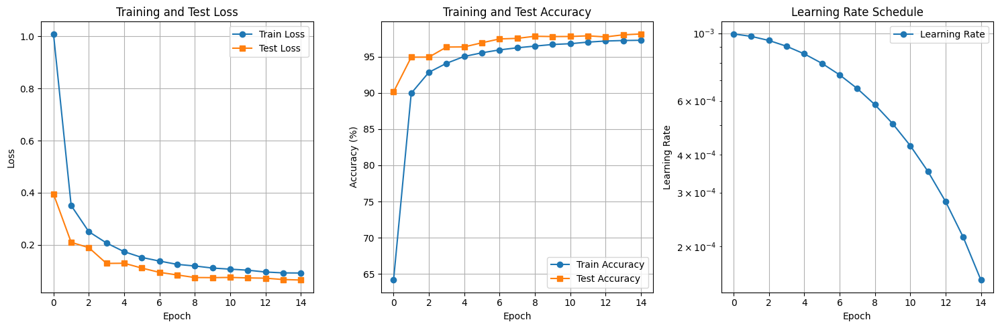


Model saved as 'mnist_model_checkpoint.pth'


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchsummary import summary
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import time

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self, dropout1=0.05, dropout2=0.05, dropout3=0.05):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, padding='same', bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout1),  # First dropout - configurable

            nn.Conv2d(16, 10, kernel_size=1, padding='same', bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout2),  # Second dropout - configurable

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(10, 32, kernel_size=3, padding='same', bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout3),  # Third dropout - configurable

            nn.Conv2d(32, 10, kernel_size=1, padding='same', bias=False),
            nn.ReLU(inplace=True),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(10, 10, kernel_size=3, padding='same', bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

            nn.Conv2d(10, 10, kernel_size=1, padding='same', bias=False),
            nn.ReLU(inplace=True),
        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )

        # Store dropout rates for reference
        self.dropout1_rate = dropout1
        self.dropout2_rate = dropout2
        self.dropout3_rate = dropout3

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

def load_mnist_data(batch_size=32):
    """Load and preprocess MNIST dataset with affine translate augmentation"""
    # Data transformations for training with augmentation
    transform_train = transforms.Compose([
        transforms.ToTensor(),
        # Affine transformation for translation augmentation
        # translate: (a, b) where a and b are the maximum absolute fraction
        # for horizontal and vertical translations respectively
        transforms.RandomAffine(
            degrees=0,  # No rotation
            translate=(0.1, 0.1),  # Translate up to 10% of image size in both directions
            scale=None,  # No scaling
            shear=None,  # No shearing
            fill=0  # Fill with black (0) for MNIST
        ),
        transforms.Normalize((0.1307,), (0.3081,))  # MNIST mean and std
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])

    # Download and load datasets
    train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform_train)
    test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform_test)

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    return train_loader, test_loader

def train_epoch(model, train_loader, criterion, optimizer, device):
    """Train model for one epoch"""
    model.train()
    total_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(train_loader, desc='Training')
    for batch_idx, (data, target) in enumerate(pbar):
        data, target = data.to(device), target.to(device)

        # Zero gradients
        optimizer.zero_grad()

        # Forward pass
        output = model(data)
        loss = criterion(output, target)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Statistics
        total_loss += loss.item()
        pred = output.argmax(dim=1, keepdim=True)
        correct += pred.eq(target.view_as(pred)).sum().item()
        total += target.size(0)

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{loss.item():.4f}',
            'Acc': f'{100. * correct / total:.2f}%'
        })

    avg_loss = total_loss / len(train_loader)
    accuracy = 100. * correct / total
    return avg_loss, accuracy

def test_epoch(model, test_loader, criterion, device):
    """Test model"""
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Testing')
        for data, target in pbar:
            data, target = data.to(device), target.to(device)

            output = model(data)
            loss = criterion(output, target)

            total_loss += loss.item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
            total += target.size(0)

            pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Acc': f'{100. * correct / total:.2f}%'
            })

    avg_loss = total_loss / len(test_loader)
    accuracy = 100. * correct / total
    return avg_loss, accuracy

def count_parameters(model):
    """Count trainable parameters in the model"""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def main():
    # Training configuration
    config = {
        'batch_size': 32,
        'epochs': 15,
        'lr': 0.001,
        'weight_decay': 0.0001,
        'scheduler': 'cosine',
        'T_max': 20,
        'eta_min': 1e-05,
        'dropout': (0.05, 0.05, 0.05)
    }

    print("="*60)
    print("MNIST Training Configuration")
    print("="*60)
    for key, value in config.items():
        print(f"{key}: {value}")
    print("="*60)

    # Load data
    print("\nLoading MNIST dataset...")
    train_loader, test_loader = load_mnist_data(config['batch_size'])
    print(f"Train samples: {len(train_loader.dataset)}")
    print(f"Test samples: {len(test_loader.dataset)}")

    # Initialize model
    model = ConfigurableMNISTModel(
        dropout1=config['dropout'][0],
        dropout2=config['dropout'][1],
        dropout3=config['dropout'][2]
    ).to(device)

    # Print model summary
    print("\n" + "="*60)
    print("MODEL ARCHITECTURE SUMMARY")
    print("="*60)
    print(f"Model parameters: {count_parameters(model):,}")
    print(f"Dropout rates: {config['dropout']}")
    print("\nDetailed Model Summary:")
    try:
        summary(model, (1, 28, 28))
    except:
        print("torchsummary not available, showing model structure:")
        print(model)

    # Initialize optimizer and scheduler
    optimizer = optim.AdamW(
        model.parameters(),
        lr=config['lr'],
        weight_decay=config['weight_decay']
    )

    scheduler = optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=config['T_max'],
        eta_min=config['eta_min']
    )

    criterion = nn.CrossEntropyLoss()

    # Training history
    train_losses = []
    train_accuracies = []
    test_losses = []
    test_accuracies = []
    learning_rates = []

    print("\n" + "="*60)
    print("TRAINING STARTED")
    print("="*60)

    start_time = time.time()

    for epoch in range(config['epochs']):
        print(f"\nEpoch [{epoch+1}/{config['epochs']}]")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")

        # Train
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)

        # Test
        test_loss, test_acc = test_epoch(model, test_loader, criterion, device)

        # Update scheduler
        scheduler.step()

        # Store history
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        test_losses.append(test_loss)
        test_accuracies.append(test_acc)
        learning_rates.append(optimizer.param_groups[0]['lr'])

        # Print epoch summary
        print("\n" + "-"*50)
        print("EPOCH SUMMARY")
        print("-"*50)
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
        print(f"Test Loss:  {test_loss:.4f} | Test Acc:  {test_acc:.2f}%")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print("-"*50)

    # Final results
    total_time = time.time() - start_time
    print("\n" + "="*60)
    print("TRAINING COMPLETED")
    print("="*60)
    print(f"Total training time: {total_time:.2f} seconds")
    print(f"Best train accuracy: {max(train_accuracies):.2f}%")
    print(f"Best test accuracy: {max(test_accuracies):.2f}%")
    print(f"Final train accuracy: {train_accuracies[-1]:.2f}%")
    print(f"Final test accuracy: {test_accuracies[-1]:.2f}%")

    # Plot training history
    plt.figure(figsize=(15, 5))

    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(train_losses, label='Train Loss', marker='o')
    plt.plot(test_losses, label='Test Loss', marker='s')
    plt.title('Training and Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Accuracy plot
    plt.subplot(1, 3, 2)
    plt.plot(train_accuracies, label='Train Accuracy', marker='o')
    plt.plot(test_accuracies, label='Test Accuracy', marker='s')
    plt.title('Training and Test Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 3, 3)
    plt.plot(learning_rates, label='Learning Rate', marker='o')
    plt.title('Learning Rate Schedule')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.legend()
    plt.grid(True)
    plt.yscale('log')

    plt.tight_layout()
    plt.show()

    # Save model
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'config': config,
        'train_accuracies': train_accuracies,
        'test_accuracies': test_accuracies,
        'train_losses': train_losses,
        'test_losses': test_losses
    }, 'mnist_model_checkpoint.pth')

    print(f"\nModel saved as 'mnist_model_checkpoint.pth'")

    return model, train_accuracies, test_accuracies

if __name__ == "__main__":
    model, train_acc, test_acc = main()

# Final Code

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchsummary import summary
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import time
from torch.optim.lr_scheduler import StepLR

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

def load_mnist_data(batch_size=64):
    """Load and preprocess MNIST dataset with affine translate augmentation"""
    # Data transformations for training with augmentation
    transform_train = transforms.Compose([
        transforms.RandomRotation((-7.0, 7.0), fill=(1,)),
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))  # MNIST mean and std
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])

    # Download and load datasets
    train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform_train)
    test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform_test)

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    return train_loader, test_loader

def train_epoch(model, train_loader, criterion, optimizer, device):
    """Train model for one epoch"""
    model.train()
    total_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(train_loader, desc='Training')
    for batch_idx, (data, target) in enumerate(pbar):
        data, target = data.to(device), target.to(device)

        # Zero gradients
        optimizer.zero_grad()

        # Forward pass
        output = model(data)
        loss = criterion(output, target)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Statistics
        total_loss += loss.item()
        pred = output.argmax(dim=1, keepdim=True)
        correct += pred.eq(target.view_as(pred)).sum().item()
        total += target.size(0)

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{loss.item():.4f}',
            'Acc': f'{100. * correct / total:.2f}%'
        })

    avg_loss = total_loss / len(train_loader)
    accuracy = 100. * correct / total
    return avg_loss, accuracy

def test_epoch(model, test_loader, criterion, device):
    """Test model"""
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Testing')
        for data, target in pbar:
            data, target = data.to(device), target.to(device)

            output = model(data)
            loss = criterion(output, target)

            total_loss += loss.item()
            pred = output.argmax(dim=1, keepdim=True)
            correct += pred.eq(target.view_as(pred)).sum().item()
            total += target.size(0)

            pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Acc': f'{100. * correct / total:.2f}%'
            })

    avg_loss = total_loss / len(test_loader)
    accuracy = 100. * correct / total
    return avg_loss, accuracy

def count_parameters(model):
    """Count trainable parameters in the model"""
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def main(model):
    # Training configuration
    config = {
        'batch_size': 32,
        'epochs': 15,
        'lr': 0.001,
        'weight_decay': 0.0001,
        'scheduler': 'plateau',
        'patience': 3,
        'factor': 0.5,
        'min_lr': 1e-6,
        'dropout': (0.05, 0.05, 0.05)
    }


    print("="*60)
    print("MNIST Training Configuration")
    print("="*60)
    for key, value in config.items():
        print(f"{key}: {value}")
    print("="*60)

    # Load data
    print("\nLoading MNIST dataset...")
    train_loader, test_loader = load_mnist_data(config['batch_size'])
    print(f"Train samples: {len(train_loader.dataset)}")
    print(f"Test samples: {len(test_loader.dataset)}")


    # Print model summary
    print("\n" + "="*60)
    print("MODEL ARCHITECTURE SUMMARY")
    print("="*60)
    print(f"Model parameters: {count_parameters(model):,}")
    print(f"Dropout rates: {config['dropout']}")
    print("\nDetailed Model Summary:")
    try:
        summary(model, (1, 28, 28))
    except:
        print("torchsummary not available, showing model structure:")
        print(model)

    # Initialize optimizer and scheduler
    optimizer = optim.AdamW(
        model.parameters(),
        lr=config['lr'],
        weight_decay=config['weight_decay']
    )

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=config['factor'],
        patience=config['patience'],
        min_lr=config['min_lr']
    )

    # optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)
    # scheduler = StepLR(optimizer, step_size=6, gamma=0.1)

    criterion = nn.CrossEntropyLoss()

    # Training history
    train_losses = []
    train_accuracies = []
    test_losses = []
    test_accuracies = []
    learning_rates = []

    print("\n" + "="*60)
    print("TRAINING STARTED")
    print("="*60)

    start_time = time.time()

    for epoch in range(config['epochs']):
        print(f"\nEpoch [{epoch+1}/{config['epochs']}]")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")

        # Train
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)

        # Test
        test_loss, test_acc = test_epoch(model, test_loader, criterion, device)

        # Update scheduler
        scheduler.step(test_loss)

        # Store history
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        test_losses.append(test_loss)
        test_accuracies.append(test_acc)
        learning_rates.append(optimizer.param_groups[0]['lr'])

        # Print epoch summary
        print("\n" + "-"*50)
        print("EPOCH SUMMARY")
        print("-"*50)
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
        print(f"Test Loss:  {test_loss:.4f} | Test Acc:  {test_acc:.2f}%")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")
        print("-"*50)

    # Final results
    total_time = time.time() - start_time
    print("\n" + "="*60)
    print("TRAINING COMPLETED")
    print("="*60)
    print(f"Total training time: {total_time:.2f} seconds")
    print(f"Best train accuracy: {max(train_accuracies):.2f}%")
    print(f"Best test accuracy: {max(test_accuracies):.2f}%")
    print(f"Final train accuracy: {train_accuracies[-1]:.2f}%")
    print(f"Final test accuracy: {test_accuracies[-1]:.2f}%")

    # Plot training history
    plt.figure(figsize=(15, 5))

    # Loss plot
    plt.subplot(1, 3, 1)
    plt.plot(train_losses, label='Train Loss', marker='o')
    plt.plot(test_losses, label='Test Loss', marker='s')
    plt.title('Training and Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Accuracy plot
    plt.subplot(1, 3, 2)
    plt.plot(train_accuracies, label='Train Accuracy', marker='o')
    plt.plot(test_accuracies, label='Test Accuracy', marker='s')
    plt.title('Training and Test Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 3, 3)
    plt.plot(learning_rates, label='Learning Rate', marker='o')
    plt.title('Learning Rate Schedule')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.legend()
    plt.grid(True)
    plt.yscale('log')

    plt.tight_layout()
    plt.show()

    # Save model
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'config': config,
        'train_accuracies': train_accuracies,
        'test_accuracies': test_accuracies,
        'train_losses': train_losses,
        'test_losses': test_losses
    }, 'mnist_model_checkpoint.pth')

    print(f"\nModel saved as 'mnist_model_checkpoint.pth'")

    return model, train_accuracies, test_accuracies

Using device: cpu


In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self, dropout1=0.05, dropout2=0.05, dropout3=0.05):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout1),  # First dropout - configurable

            nn.Conv2d(32, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout2),  # Second dropout - configurable

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(10, 16, kernel_size=3, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout3),  # Third dropout - configurable

            nn.Conv2d(16, 10, kernel_size=1, bias=False),
            nn.ReLU(inplace=True),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(10, 8, kernel_size=3, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),

            nn.Conv2d(8, 10, kernel_size=1, bias=False),
            nn.ReLU(inplace=True),
        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )

        # Store dropout rates for reference
        self.dropout1_rate = dropout1
        self.dropout2_rate = dropout2
        self.dropout3_rate = dropout3

    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel(
        dropout1=0.05,
        dropout2=0.05,
        dropout3=0.05
    ).to(device)
    model, train_acc, test_acc = main(model)

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 3,340
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 26, 26]             288
       BatchNorm2d-2           [-1, 32, 26, 26]              64
              ReLU-3           [-1, 32, 26, 26]               0
           Dropout-4           [-1, 32, 26, 26]               0
            Conv2d-5           [-1, 10, 26, 26]             320
       BatchNorm2d-6           [-1, 10, 26, 26]              20
              ReLU-7           [-1, 10, 26, 26]               0
           Dropout-8           [-1, 10, 26, 26]               0
         MaxPool2d-9    

Testing: 100%|██████████| 313/313 [00:03<00:00, 102.90it/s, Loss=0.1456, Acc=91.92%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.9866 | Train Acc: 65.73%
Test Loss:  0.3281 | Test Acc:  91.92%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:03<00:00, 101.26it/s, Loss=0.0628, Acc=95.01%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.3434 | Train Acc: 90.03%
Test Loss:  0.1931 | Test Acc:  95.01%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:04<00:00, 77.12it/s, Loss=0.0210, Acc=95.51%] 



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2656 | Train Acc: 92.25%
Test Loss:  0.1738 | Test Acc:  95.51%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Testing: 100%|██████████| 313/313 [00:04<00:00, 75.77it/s, Loss=0.0519, Acc=96.88%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2231 | Train Acc: 93.62%
Test Loss:  0.1238 | Test Acc:  96.88%
Learning Rate: 0.000905
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.000905


Testing: 100%|██████████| 313/313 [00:04<00:00, 76.23it/s, Loss=0.0108, Acc=97.33%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1720 | Train Acc: 95.09%
Test Loss:  0.0981 | Test Acc:  97.33%
Learning Rate: 0.000855
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.000855


Testing: 100%|██████████| 313/313 [00:03<00:00, 79.46it/s, Loss=0.0162, Acc=96.90%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1519 | Train Acc: 95.70%
Test Loss:  0.1129 | Test Acc:  96.90%
Learning Rate: 0.000796
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.000796


Testing: 100%|██████████| 313/313 [00:04<00:00, 77.53it/s, Loss=0.0164, Acc=96.93%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1370 | Train Acc: 96.03%
Test Loss:  0.1035 | Test Acc:  96.93%
Learning Rate: 0.000730
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.000730


Training:  25%|██▌       | 478/1875 [00:12<00:37, 37.74it/s, Loss=0.0254, Acc=96.27%]


KeyboardInterrupt: 

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(32, 32, kernel_size=3, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 16, kernel_size=1, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(16, 16, kernel_size=3, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 12,892
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 26, 26]             288
       BatchNorm2d-2           [-1, 32, 26, 26]              64
              ReLU-3           [-1, 32, 26, 26]               0
           Dropout-4           [-1, 32, 26, 26]               0
            Conv2d-5           [-1, 32, 24, 24]           9,216
       BatchNorm2d-6           [-1, 32, 24, 24]              64
              ReLU-7           [-1, 32, 24, 24]               0
           Dropout-8           [-1, 32, 24, 24]               0
         MaxPool2d-9   

Testing: 100%|██████████| 313/313 [00:03<00:00, 102.94it/s, Loss=0.2492, Acc=91.15%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.9507 | Train Acc: 71.09%
Test Loss:  0.3550 | Test Acc:  91.15%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:03<00:00, 103.84it/s, Loss=0.2716, Acc=93.62%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.3386 | Train Acc: 90.45%
Test Loss:  0.2326 | Test Acc:  93.62%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:02<00:00, 105.14it/s, Loss=0.0167, Acc=96.31%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2268 | Train Acc: 93.42%
Test Loss:  0.1323 | Test Acc:  96.31%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Testing: 100%|██████████| 313/313 [00:03<00:00, 100.66it/s, Loss=0.0278, Acc=96.68%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1839 | Train Acc: 94.55%
Test Loss:  0.1190 | Test Acc:  96.68%
Learning Rate: 0.000905
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.000905


Testing: 100%|██████████| 313/313 [00:03<00:00, 99.63it/s, Loss=0.0201, Acc=96.62%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1623 | Train Acc: 95.23%
Test Loss:  0.1158 | Test Acc:  96.62%
Learning Rate: 0.000855
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.000855


Testing: 100%|██████████| 313/313 [00:03<00:00, 99.72it/s, Loss=0.0291, Acc=97.50%] 



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1468 | Train Acc: 95.53%
Test Loss:  0.0921 | Test Acc:  97.50%
Learning Rate: 0.000796
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.000796


Testing: 100%|██████████| 313/313 [00:03<00:00, 101.27it/s, Loss=0.0180, Acc=97.24%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1400 | Train Acc: 95.78%
Test Loss:  0.0965 | Test Acc:  97.24%
Learning Rate: 0.000730
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.000730


Testing: 100%|██████████| 313/313 [00:03<00:00, 98.62it/s, Loss=0.0053, Acc=97.36%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1264 | Train Acc: 96.24%
Test Loss:  0.0915 | Test Acc:  97.36%
Learning Rate: 0.000658
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.000658


Testing: 100%|██████████| 313/313 [00:03<00:00, 98.68it/s, Loss=0.0083, Acc=97.41%] 



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1206 | Train Acc: 96.41%
Test Loss:  0.0873 | Test Acc:  97.41%
Learning Rate: 0.000582
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.000582


Testing: 100%|██████████| 313/313 [00:03<00:00, 100.68it/s, Loss=0.0084, Acc=97.48%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1133 | Train Acc: 96.54%
Test Loss:  0.0887 | Test Acc:  97.48%
Learning Rate: 0.000505
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.000505


Testing: 100%|██████████| 313/313 [00:03<00:00, 100.57it/s, Loss=0.0046, Acc=97.65%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1063 | Train Acc: 96.86%
Test Loss:  0.0784 | Test Acc:  97.65%
Learning Rate: 0.000428
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.000428


Testing: 100%|██████████| 313/313 [00:03<00:00, 100.86it/s, Loss=0.0051, Acc=97.61%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1060 | Train Acc: 96.79%
Test Loss:  0.0783 | Test Acc:  97.61%
Learning Rate: 0.000352
--------------------------------------------------

Epoch [13/15]
Learning Rate: 0.000352


Testing: 100%|██████████| 313/313 [00:03<00:00, 100.95it/s, Loss=0.0093, Acc=97.73%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0984 | Train Acc: 96.90%
Test Loss:  0.0791 | Test Acc:  97.73%
Learning Rate: 0.000280
--------------------------------------------------

Epoch [14/15]
Learning Rate: 0.000280


Testing: 100%|██████████| 313/313 [00:03<00:00, 101.46it/s, Loss=0.0025, Acc=98.02%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0973 | Train Acc: 97.01%
Test Loss:  0.0701 | Test Acc:  98.02%
Learning Rate: 0.000214
--------------------------------------------------

Epoch [15/15]
Learning Rate: 0.000214


Testing: 100%|██████████| 313/313 [00:03<00:00, 102.60it/s, Loss=0.0026, Acc=97.90%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0920 | Train Acc: 97.20%
Test Loss:  0.0736 | Test Acc:  97.90%
Learning Rate: 0.000155
--------------------------------------------------

TRAINING COMPLETED
Total training time: 791.54 seconds
Best train accuracy: 97.20%
Best test accuracy: 98.02%
Final train accuracy: 97.20%
Final test accuracy: 97.90%


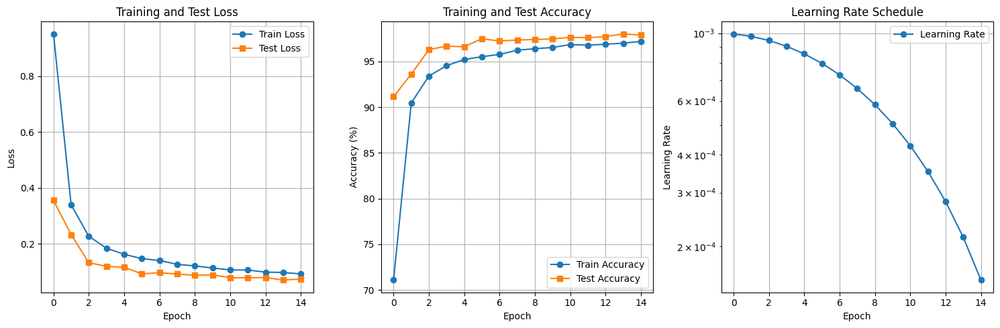


Model saved as 'mnist_model_checkpoint.pth'


In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=3, bias=False),
            nn.BatchNorm2d(6),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(6, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(12, 24, kernel_size=3, bias=False),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(24, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...


100%|██████████| 9.91M/9.91M [00:00<00:00, 36.6MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.55MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 9.55MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 9.48MB/s]


Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 5,158
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 26, 26]              54
       BatchNorm2d-2            [-1, 6, 26, 26]              12
              ReLU-3            [-1, 6, 26, 26]               0
           Dropout-4            [-1, 6, 26, 26]               0
            Conv2d-5           [-1, 12, 24, 24]             648
       BatchNorm2d-6           [-1, 12, 24, 24]              24
              ReLU-7           [-1, 12, 24, 24]               0
           Dropout-8           [-1, 12, 24, 24]               0
         MaxPool2d-9           [-1, 12, 12, 12]               0
           Conv2d-10           [-1, 12, 10, 10]           1,296
      BatchNorm2d-11           [-1, 12, 10, 10]              24
             Re

Testing: 100%|██████████| 313/313 [00:05<00:00, 57.85it/s, Loss=0.2030, Acc=95.93%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.7309 | Train Acc: 78.16%
Test Loss:  0.1659 | Test Acc:  95.93%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:05<00:00, 56.45it/s, Loss=0.0517, Acc=96.69%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2061 | Train Acc: 94.01%
Test Loss:  0.1126 | Test Acc:  96.69%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:06<00:00, 48.72it/s, Loss=0.0197, Acc=97.87%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1555 | Train Acc: 95.36%
Test Loss:  0.0782 | Test Acc:  97.87%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Testing: 100%|██████████| 313/313 [00:07<00:00, 44.69it/s, Loss=0.0219, Acc=97.78%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1290 | Train Acc: 96.11%
Test Loss:  0.0746 | Test Acc:  97.78%
Learning Rate: 0.000905
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.000905


Testing: 100%|██████████| 313/313 [00:05<00:00, 57.34it/s, Loss=0.0062, Acc=98.20%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1147 | Train Acc: 96.60%
Test Loss:  0.0618 | Test Acc:  98.20%
Learning Rate: 0.000855
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.000855


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.06it/s, Loss=0.0105, Acc=98.21%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1032 | Train Acc: 96.91%
Test Loss:  0.0574 | Test Acc:  98.21%
Learning Rate: 0.000796
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.000796


Testing: 100%|██████████| 313/313 [00:06<00:00, 48.31it/s, Loss=0.0100, Acc=98.23%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0951 | Train Acc: 97.14%
Test Loss:  0.0592 | Test Acc:  98.23%
Learning Rate: 0.000730
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.000730


Testing: 100%|██████████| 313/313 [00:06<00:00, 47.35it/s, Loss=0.0123, Acc=98.64%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0870 | Train Acc: 97.33%
Test Loss:  0.0487 | Test Acc:  98.64%
Learning Rate: 0.000658
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.000658


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.91it/s, Loss=0.0055, Acc=98.60%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0783 | Train Acc: 97.55%
Test Loss:  0.0460 | Test Acc:  98.60%
Learning Rate: 0.000582
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.000582


Testing: 100%|██████████| 313/313 [00:10<00:00, 29.62it/s, Loss=0.0027, Acc=98.67%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0775 | Train Acc: 97.60%
Test Loss:  0.0439 | Test Acc:  98.67%
Learning Rate: 0.000505
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.000505


Testing: 100%|██████████| 313/313 [00:05<00:00, 55.80it/s, Loss=0.0055, Acc=98.79%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0727 | Train Acc: 97.78%
Test Loss:  0.0411 | Test Acc:  98.79%
Learning Rate: 0.000428
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.000428


Testing: 100%|██████████| 313/313 [00:05<00:00, 55.51it/s, Loss=0.0026, Acc=98.73%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0694 | Train Acc: 97.90%
Test Loss:  0.0444 | Test Acc:  98.73%
Learning Rate: 0.000352
--------------------------------------------------

Epoch [13/15]
Learning Rate: 0.000352


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.88it/s, Loss=0.0026, Acc=98.74%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0666 | Train Acc: 97.97%
Test Loss:  0.0424 | Test Acc:  98.74%
Learning Rate: 0.000280
--------------------------------------------------

Epoch [14/15]
Learning Rate: 0.000280


Testing: 100%|██████████| 313/313 [00:05<00:00, 55.90it/s, Loss=0.0028, Acc=98.69%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0642 | Train Acc: 97.99%
Test Loss:  0.0428 | Test Acc:  98.69%
Learning Rate: 0.000214
--------------------------------------------------

Epoch [15/15]
Learning Rate: 0.000214


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.24it/s, Loss=0.0017, Acc=98.85%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0630 | Train Acc: 98.08%
Test Loss:  0.0377 | Test Acc:  98.85%
Learning Rate: 0.000155
--------------------------------------------------

TRAINING COMPLETED
Total training time: 1699.68 seconds
Best train accuracy: 98.08%
Best test accuracy: 98.85%
Final train accuracy: 98.08%
Final test accuracy: 98.85%


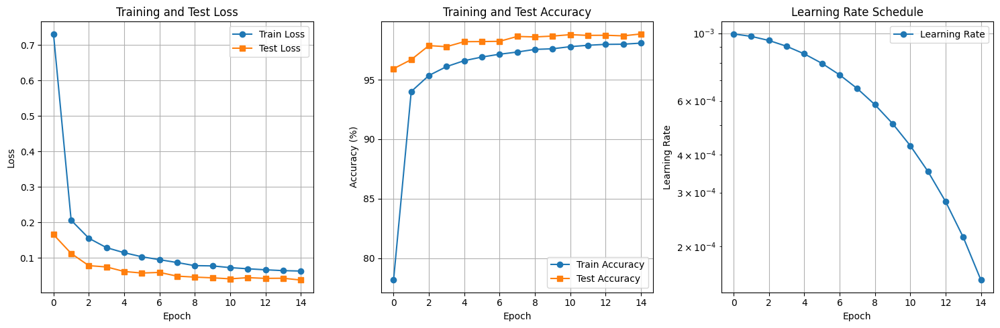


Model saved as 'mnist_model_checkpoint.pth'


In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 4, kernel_size=3, bias=False),
            nn.BatchNorm2d(4),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(4, 8, kernel_size=3, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(8, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(12, 18, kernel_size=3, bias=False),
            nn.BatchNorm2d(18),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(18, 12, kernel_size=1, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(12, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 5,116
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 4, 26, 26]              36
       BatchNorm2d-2            [-1, 4, 26, 26]               8
              ReLU-3            [-1, 4, 26, 26]               0
           Dropout-4            [-1, 4, 26, 26]               0
            Conv2d-5            [-1, 8, 24, 24]             288
       BatchNorm2d-6            [-1, 8, 24, 24]              16
              ReLU-7            [-1, 8, 24, 24]               0
           Dropout-8            [-1, 8, 24, 24]               0
         MaxPool2d-9    

Testing: 100%|██████████| 313/313 [00:05<00:00, 54.28it/s, Loss=0.0199, Acc=97.14%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.6865 | Train Acc: 78.52%
Test Loss:  0.1033 | Test Acc:  97.14%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:07<00:00, 44.20it/s, Loss=0.0091, Acc=98.18%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1947 | Train Acc: 94.55%
Test Loss:  0.0674 | Test Acc:  98.18%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:07<00:00, 41.19it/s, Loss=0.0024, Acc=98.24%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1600 | Train Acc: 95.63%
Test Loss:  0.0562 | Test Acc:  98.24%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.89it/s, Loss=0.0017, Acc=98.38%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1408 | Train Acc: 96.11%
Test Loss:  0.0550 | Test Acc:  98.38%
Learning Rate: 0.000905
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.000905


Testing: 100%|██████████| 313/313 [00:05<00:00, 53.80it/s, Loss=0.0009, Acc=98.38%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1277 | Train Acc: 96.44%
Test Loss:  0.0579 | Test Acc:  98.38%
Learning Rate: 0.000855
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.000855


Testing: 100%|██████████| 313/313 [00:06<00:00, 47.55it/s, Loss=0.0013, Acc=98.69%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1217 | Train Acc: 96.57%
Test Loss:  0.0468 | Test Acc:  98.69%
Learning Rate: 0.000796
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.000796


Testing: 100%|██████████| 313/313 [00:05<00:00, 55.83it/s, Loss=0.0012, Acc=98.69%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1119 | Train Acc: 96.89%
Test Loss:  0.0440 | Test Acc:  98.69%
Learning Rate: 0.000730
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.000730


Testing: 100%|██████████| 313/313 [00:07<00:00, 43.86it/s, Loss=0.0038, Acc=98.53%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1053 | Train Acc: 97.03%
Test Loss:  0.0487 | Test Acc:  98.53%
Learning Rate: 0.000658
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.000658


Training:  70%|███████   | 1317/1875 [01:30<00:38, 14.62it/s, Loss=0.0621, Acc=97.00%]


KeyboardInterrupt: 

In [ ]:
import torch.nn.functional as F
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.features = nn.Sequential(
            # Block 1: 28x28x1 -> 14x14x9
            nn.Conv2d(1, 9, kernel_size=3, stride=2, padding=1, bias=False),  # 81 params
            nn.BatchNorm2d(9),  # 18 params
            nn.ReLU(inplace=True),

            # Block 2: 14x14x9 -> 7x7x18
            nn.Conv2d(9, 18, kernel_size=3, stride=2, padding=1, bias=False),  # 1458 params
            nn.BatchNorm2d(18),  # 36 params
            nn.ReLU(inplace=True),

            # Block 3: 7x7x18 -> 3x3x16 (main parameter allocation)
            nn.Conv2d(18, 16, kernel_size=3, stride=2, padding=0, bias=False),  # 2592 params
            nn.BatchNorm2d(16),  # 32 params
            nn.ReLU(inplace=True),

            # Global pooling
            nn.AdaptiveAvgPool2d(1)
        )

        # Lightweight classifier
        self.classifier = nn.Linear(16, 10, bias=False)  # 160 params

        # Light regularization for 15-epoch training
        self.dropout = nn.Dropout2d(0.03)

        # Total: 81+18+1458+36+2592+32+160 = 4377 params (STILL TOO MANY!)

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return F.log_softmax(x, dim=1)

In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 4,377
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 9, 14, 14]              81
       BatchNorm2d-2            [-1, 9, 14, 14]              18
              ReLU-3            [-1, 9, 14, 14]               0
            Conv2d-4             [-1, 18, 7, 7]           1,458
       BatchNorm2d-5             [-1, 18, 7, 7]              36
              ReLU-6             [-1, 18, 7, 7]               0
            Conv2d-7             [-1, 16, 3, 3]           2,592
       BatchNorm2d-8             [-1, 16, 3, 3]              32
              ReLU-9    

Testing: 100%|██████████| 313/313 [00:04<00:00, 65.85it/s, Loss=0.1977, Acc=94.22%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.9776 | Train Acc: 73.13%
Test Loss:  0.2807 | Test Acc:  94.22%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:05<00:00, 57.17it/s, Loss=0.0610, Acc=95.41%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.3088 | Train Acc: 91.92%
Test Loss:  0.1716 | Test Acc:  95.41%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:10<00:00, 29.34it/s, Loss=0.0505, Acc=95.55%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2256 | Train Acc: 93.70%
Test Loss:  0.1584 | Test Acc:  95.55%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Training:   9%|▊         | 160/1875 [00:13<02:19, 12.30it/s, Loss=0.2952, Acc=94.39%]


KeyboardInterrupt: 

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=3, bias=False),
            nn.BatchNorm2d(6),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(6, 6, kernel_size=3, bias=False),
            nn.BatchNorm2d(6),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(6, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(12, 24, kernel_size=3, bias=False),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(24, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: cosine
T_max: 20
eta_min: 1e-05
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 5,494
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 26, 26]              54
       BatchNorm2d-2            [-1, 6, 26, 26]              12
              ReLU-3            [-1, 6, 26, 26]               0
           Dropout-4            [-1, 6, 26, 26]               0
            Conv2d-5            [-1, 6, 24, 24]             324
       BatchNorm2d-6            [-1, 6, 24, 24]              12
              ReLU-7            [-1, 6, 24, 24]               0
           Dropout-8            [-1, 6, 24, 24]               0
            Conv2d-9    

Testing: 100%|██████████| 313/313 [00:08<00:00, 36.08it/s, Loss=0.0586, Acc=96.45%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.7784 | Train Acc: 75.50%
Test Loss:  0.1465 | Test Acc:  96.45%
Learning Rate: 0.000994
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.000994


Testing: 100%|██████████| 313/313 [00:05<00:00, 53.67it/s, Loss=0.0221, Acc=97.67%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1930 | Train Acc: 94.60%
Test Loss:  0.0889 | Test Acc:  97.67%
Learning Rate: 0.000976
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.000976


Testing: 100%|██████████| 313/313 [00:07<00:00, 43.43it/s, Loss=0.0344, Acc=97.38%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1422 | Train Acc: 95.84%
Test Loss:  0.0922 | Test Acc:  97.38%
Learning Rate: 0.000946
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.000946


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.12it/s, Loss=0.0070, Acc=98.04%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1232 | Train Acc: 96.36%
Test Loss:  0.0665 | Test Acc:  98.04%
Learning Rate: 0.000905
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.000905


Testing: 100%|██████████| 313/313 [00:07<00:00, 42.67it/s, Loss=0.0034, Acc=98.02%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1107 | Train Acc: 96.74%
Test Loss:  0.0670 | Test Acc:  98.02%
Learning Rate: 0.000855
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.000855


Testing: 100%|██████████| 313/313 [00:05<00:00, 53.63it/s, Loss=0.0028, Acc=98.52%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1027 | Train Acc: 97.00%
Test Loss:  0.0546 | Test Acc:  98.52%
Learning Rate: 0.000796
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.000796


Testing: 100%|██████████| 313/313 [00:06<00:00, 47.21it/s, Loss=0.0029, Acc=98.41%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0990 | Train Acc: 97.06%
Test Loss:  0.0574 | Test Acc:  98.41%
Learning Rate: 0.000730
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.000730


Testing: 100%|██████████| 313/313 [00:06<00:00, 48.86it/s, Loss=0.0078, Acc=98.47%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0904 | Train Acc: 97.28%
Test Loss:  0.0502 | Test Acc:  98.47%
Learning Rate: 0.000658
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.000658


Testing: 100%|██████████| 313/313 [00:06<00:00, 49.70it/s, Loss=0.0035, Acc=98.48%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0877 | Train Acc: 97.36%
Test Loss:  0.0500 | Test Acc:  98.48%
Learning Rate: 0.000582
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.000582


Testing: 100%|██████████| 313/313 [00:07<00:00, 44.31it/s, Loss=0.0031, Acc=98.62%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0835 | Train Acc: 97.51%
Test Loss:  0.0471 | Test Acc:  98.62%
Learning Rate: 0.000505
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.000505


Testing: 100%|██████████| 313/313 [00:05<00:00, 53.62it/s, Loss=0.0023, Acc=98.49%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0784 | Train Acc: 97.69%
Test Loss:  0.0485 | Test Acc:  98.49%
Learning Rate: 0.000428
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.000428


Testing: 100%|██████████| 313/313 [00:07<00:00, 43.55it/s, Loss=0.0029, Acc=98.53%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0777 | Train Acc: 97.68%
Test Loss:  0.0463 | Test Acc:  98.53%
Learning Rate: 0.000352
--------------------------------------------------

Epoch [13/15]
Learning Rate: 0.000352


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.83it/s, Loss=0.0015, Acc=98.64%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0725 | Train Acc: 97.88%
Test Loss:  0.0450 | Test Acc:  98.64%
Learning Rate: 0.000280
--------------------------------------------------

Epoch [14/15]
Learning Rate: 0.000280


Testing: 100%|██████████| 313/313 [00:07<00:00, 42.95it/s, Loss=0.0012, Acc=98.62%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0677 | Train Acc: 98.00%
Test Loss:  0.0440 | Test Acc:  98.62%
Learning Rate: 0.000214
--------------------------------------------------

Epoch [15/15]
Learning Rate: 0.000214


Testing: 100%|██████████| 313/313 [00:05<00:00, 53.24it/s, Loss=0.0015, Acc=98.84%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0667 | Train Acc: 98.04%
Test Loss:  0.0388 | Test Acc:  98.84%
Learning Rate: 0.000155
--------------------------------------------------

TRAINING COMPLETED
Total training time: 1723.66 seconds
Best train accuracy: 98.04%
Best test accuracy: 98.84%
Final train accuracy: 98.04%
Final test accuracy: 98.84%


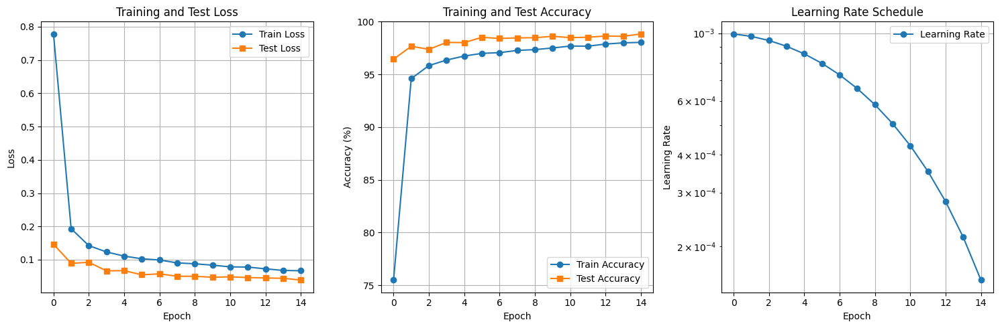


Model saved as 'mnist_model_checkpoint.pth'


In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: plateau
patience: 3
factor: 0.5
min_lr: 1e-06
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 5,494
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 6, 26, 26]              54
       BatchNorm2d-2            [-1, 6, 26, 26]              12
              ReLU-3            [-1, 6, 26, 26]               0
           Dropout-4            [-1, 6, 26, 26]               0
            Conv2d-5            [-1, 6, 24, 24]             324
       BatchNorm2d-6            [-1, 6, 24, 24]              12
              ReLU-7            [-1, 6, 24, 24]               0
           Dropout-8            [-1, 6, 24, 24]               0
          

Testing: 100%|██████████| 313/313 [00:06<00:00, 45.29it/s, Loss=0.1275, Acc=93.98%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.6984 | Train Acc: 78.98%
Test Loss:  0.2093 | Test Acc:  93.98%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.93it/s, Loss=0.0548, Acc=97.15%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1811 | Train Acc: 94.77%
Test Loss:  0.1007 | Test Acc:  97.15%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 43.02it/s, Loss=0.0117, Acc=97.78%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1384 | Train Acc: 95.88%
Test Loss:  0.0760 | Test Acc:  97.78%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.80it/s, Loss=0.0083, Acc=98.43%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1248 | Train Acc: 96.32%
Test Loss:  0.0541 | Test Acc:  98.43%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 46.20it/s, Loss=0.0351, Acc=98.25%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1088 | Train Acc: 96.75%
Test Loss:  0.0559 | Test Acc:  98.25%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 51.18it/s, Loss=0.0061, Acc=98.24%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1018 | Train Acc: 96.94%
Test Loss:  0.0568 | Test Acc:  98.24%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 53.83it/s, Loss=0.0030, Acc=98.30%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0978 | Train Acc: 97.07%
Test Loss:  0.0538 | Test Acc:  98.30%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.001000


Training:  41%|████      | 763/1875 [00:45<01:05, 16.85it/s, Loss=0.0241, Acc=97.24%]


KeyboardInterrupt: 

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(8, 8, kernel_size=3, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(8, 16, kernel_size=3, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 16, kernel_size=3, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(16, 32, kernel_size=3, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(32, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: plateau
patience: 3
factor: 0.5
min_lr: 1e-06
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 9,412
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 26, 26]              72
       BatchNorm2d-2            [-1, 8, 26, 26]              16
              ReLU-3            [-1, 8, 26, 26]               0
           Dropout-4            [-1, 8, 26, 26]               0
            Conv2d-5            [-1, 8, 24, 24]             576
       BatchNorm2d-6            [-1, 8, 24, 24]              16
              ReLU-7            [-1, 8, 24, 24]               0
           Dropout-8            [-1, 8, 24, 24]               0
          

Training:  12%|█▏        | 227/1875 [00:32<03:52,  7.09it/s, Loss=1.6546, Acc=28.40%]


KeyboardInterrupt: 

# Potential Model 1

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(8, 8, kernel_size=3, bias=False),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(8, 16, kernel_size=3, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),


            nn.Conv2d(16, 16, kernel_size=3, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 32, kernel_size=3, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(32, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: plateau
patience: 3
factor: 0.5
min_lr: 1e-06
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 9,412
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 26, 26]              72
       BatchNorm2d-2            [-1, 8, 26, 26]              16
              ReLU-3            [-1, 8, 26, 26]               0
           Dropout-4            [-1, 8, 26, 26]               0
            Conv2d-5            [-1, 8, 24, 24]             576
       BatchNorm2d-6            [-1, 8, 24, 24]              16
              ReLU-7            [-1, 8, 24, 24]               0
           Dropout-8            [-1, 8, 24, 24]               0
         M

Testing: 100%|██████████| 313/313 [00:07<00:00, 40.12it/s, Loss=0.0084, Acc=98.35%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.5309 | Train Acc: 82.88%
Test Loss:  0.0602 | Test Acc:  98.35%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 53.27it/s, Loss=0.0014, Acc=98.64%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1260 | Train Acc: 96.38%
Test Loss:  0.0467 | Test Acc:  98.64%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 56.13it/s, Loss=0.0015, Acc=98.87%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1003 | Train Acc: 97.08%
Test Loss:  0.0388 | Test Acc:  98.87%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 43.94it/s, Loss=0.0009, Acc=98.60%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0856 | Train Acc: 97.46%
Test Loss:  0.0435 | Test Acc:  98.60%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 51.11it/s, Loss=0.0010, Acc=99.11%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0810 | Train Acc: 97.68%
Test Loss:  0.0308 | Test Acc:  99.11%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 56.38it/s, Loss=0.0006, Acc=98.97%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0734 | Train Acc: 97.90%
Test Loss:  0.0332 | Test Acc:  98.97%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 45.31it/s, Loss=0.0002, Acc=99.05%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0681 | Train Acc: 98.03%
Test Loss:  0.0323 | Test Acc:  99.05%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.66it/s, Loss=0.0003, Acc=99.04%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0663 | Train Acc: 98.06%
Test Loss:  0.0299 | Test Acc:  99.04%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 56.90it/s, Loss=0.0002, Acc=99.17%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0636 | Train Acc: 98.17%
Test Loss:  0.0288 | Test Acc:  99.17%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 44.97it/s, Loss=0.0005, Acc=99.19%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0624 | Train Acc: 98.21%
Test Loss:  0.0264 | Test Acc:  99.19%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 56.04it/s, Loss=0.0004, Acc=99.16%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0561 | Train Acc: 98.35%
Test Loss:  0.0266 | Test Acc:  99.16%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 46.31it/s, Loss=0.0005, Acc=99.10%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0578 | Train Acc: 98.27%
Test Loss:  0.0287 | Test Acc:  99.10%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [13/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 49.51it/s, Loss=0.0004, Acc=99.26%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0527 | Train Acc: 98.47%
Test Loss:  0.0252 | Test Acc:  99.26%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [14/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 45.67it/s, Loss=0.0003, Acc=99.30%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0530 | Train Acc: 98.47%
Test Loss:  0.0226 | Test Acc:  99.30%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [15/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 45.30it/s, Loss=0.0010, Acc=99.29%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0531 | Train Acc: 98.48%
Test Loss:  0.0242 | Test Acc:  99.29%
Learning Rate: 0.001000
--------------------------------------------------

TRAINING COMPLETED
Total training time: 1577.37 seconds
Best train accuracy: 98.48%
Best test accuracy: 99.30%
Final train accuracy: 98.48%
Final test accuracy: 99.29%


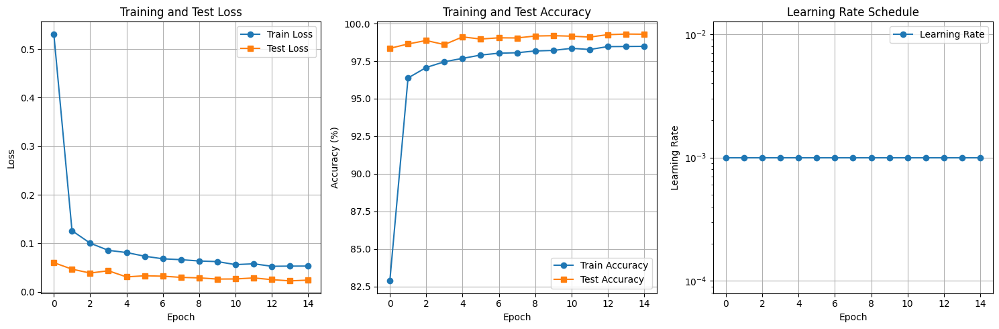


Model saved as 'mnist_model_checkpoint.pth'


In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

# Potential Model 2

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),


            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 24, kernel_size=3, bias=False),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(24, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(10, 10, bias=False),
            nn.ReLU(),
            nn.Linear(10, 10, bias=False)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        return x

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: plateau
patience: 3
factor: 0.5
min_lr: 1e-06
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 7,192
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 12, 26, 26]             108
       BatchNorm2d-2           [-1, 12, 26, 26]              24
              ReLU-3           [-1, 12, 26, 26]               0
           Dropout-4           [-1, 12, 26, 26]               0
            Conv2d-5           [-1, 12, 24, 24]           1,296
       BatchNorm2d-6           [-1, 12, 24, 24]              24
              ReLU-7           [-1, 12, 24, 24]               0
           Dropout-8           [-1, 12, 24, 24]               0
         M

Testing: 100%|██████████| 313/313 [00:06<00:00, 49.10it/s, Loss=0.0247, Acc=98.60%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.4951 | Train Acc: 86.00%
Test Loss:  0.0526 | Test Acc:  98.60%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 42.58it/s, Loss=0.0113, Acc=98.84%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1237 | Train Acc: 96.39%
Test Loss:  0.0389 | Test Acc:  98.84%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 45.33it/s, Loss=0.0942, Acc=99.00%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1022 | Train Acc: 97.07%
Test Loss:  0.0347 | Test Acc:  99.00%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 44.65it/s, Loss=0.0045, Acc=98.80%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0881 | Train Acc: 97.36%
Test Loss:  0.0368 | Test Acc:  98.80%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 42.40it/s, Loss=0.0007, Acc=98.76%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0822 | Train Acc: 97.54%
Test Loss:  0.0395 | Test Acc:  98.76%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 43.24it/s, Loss=0.0055, Acc=98.98%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0787 | Train Acc: 97.73%
Test Loss:  0.0304 | Test Acc:  98.98%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 45.42it/s, Loss=0.0011, Acc=99.13%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0750 | Train Acc: 97.76%
Test Loss:  0.0310 | Test Acc:  99.13%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.04it/s, Loss=0.0007, Acc=99.14%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0723 | Train Acc: 97.87%
Test Loss:  0.0309 | Test Acc:  99.14%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 48.98it/s, Loss=0.0006, Acc=99.11%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0687 | Train Acc: 97.97%
Test Loss:  0.0282 | Test Acc:  99.11%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 48.77it/s, Loss=0.0030, Acc=99.16%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0659 | Train Acc: 98.01%
Test Loss:  0.0286 | Test Acc:  99.16%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 49.85it/s, Loss=0.0007, Acc=98.99%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0658 | Train Acc: 98.04%
Test Loss:  0.0317 | Test Acc:  98.99%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 51.11it/s, Loss=0.0004, Acc=99.24%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0625 | Train Acc: 98.14%
Test Loss:  0.0257 | Test Acc:  99.24%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [13/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 52.00it/s, Loss=0.0005, Acc=98.90%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0608 | Train Acc: 98.22%
Test Loss:  0.0343 | Test Acc:  98.90%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [14/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 49.85it/s, Loss=0.0004, Acc=98.98%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0592 | Train Acc: 98.31%
Test Loss:  0.0315 | Test Acc:  98.98%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [15/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 49.83it/s, Loss=0.0002, Acc=99.17%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0609 | Train Acc: 98.21%
Test Loss:  0.0260 | Test Acc:  99.17%
Learning Rate: 0.001000
--------------------------------------------------

TRAINING COMPLETED
Total training time: 1850.54 seconds
Best train accuracy: 98.31%
Best test accuracy: 99.24%
Final train accuracy: 98.21%
Final test accuracy: 99.17%


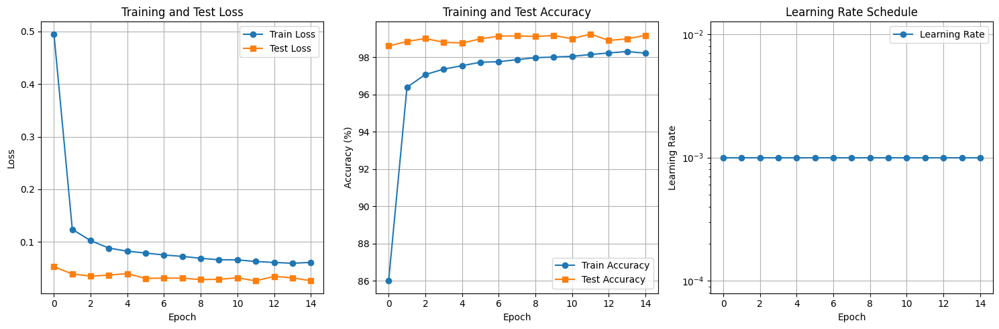


Model saved as 'mnist_model_checkpoint.pth'


In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

# Potential Model 3

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),


            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 24, kernel_size=3, bias=False),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(24, 10, kernel_size=1, bias=False),
            nn.BatchNorm2d(10),
            nn.ReLU(inplace=True),

        )

        # Global Average Pooling and Linear layers
        self.gap_and_fc = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            # nn.Flatten(),
            # nn.Linear(10, 10, bias=False),
            # nn.ReLU(),
            # nn.Linear(10, 10, bias=False)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap_and_fc(x)
        x = x.view(-1, 10)
        return x

In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: plateau
patience: 2
factor: 0.5
min_lr: 0.0001
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 6,992
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 12, 26, 26]             108
       BatchNorm2d-2           [-1, 12, 26, 26]              24
              ReLU-3           [-1, 12, 26, 26]               0
           Dropout-4           [-1, 12, 26, 26]               0
            Conv2d-5           [-1, 12, 24, 24]           1,296
       BatchNorm2d-6           [-1, 12, 24, 24]              24
              ReLU-7           [-1, 12, 24, 24]               0
           Dropout-8           [-1, 12, 24, 24]               0
         

Training:  33%|███▎      | 615/1875 [00:33<01:09, 18.26it/s, Loss=0.6773, Acc=76.36%]


KeyboardInterrupt: 

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, bias=False),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(16, 16, kernel_size=3, groups=8, bias=False),
            nn.Conv2d(16, 32, kernel_size=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.05),

            nn.Conv2d(32, 32, kernel_size=3, groups=16, bias=False),
            nn.Conv2d(32, 40, kernel_size=1, bias=False),
            nn.BatchNorm2d(40),
            nn.ReLU(inplace=True),

            nn.Conv2d(40, 10, kernel_size=1, bias=False)
        )

        # Global Average Pooling and Linear layers
        self.gap = nn.Sequential(
            nn.AdaptiveAvgPool2d(1)
        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = self.gap(x)
        x = x.view(-1, 10)
        return x

In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: plateau
patience: 3
factor: 0.5
min_lr: 1e-06
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 3,376
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 26, 26]             144
       BatchNorm2d-2           [-1, 16, 26, 26]              32
              ReLU-3           [-1, 16, 26, 26]               0
         MaxPool2d-4           [-1, 16, 13, 13]               0
            Conv2d-5           [-1, 16, 11, 11]             288
            Conv2d-6           [-1, 32, 11, 11]             512
       BatchNorm2d-7           [-1, 32, 11, 11]              64
              ReLU-8           [-1, 32, 11, 11]               0
         M

Testing: 100%|██████████| 313/313 [00:07<00:00, 39.66it/s, Loss=0.0459, Acc=97.35%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.4505 | Train Acc: 89.07%
Test Loss:  0.0985 | Test Acc:  97.35%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 39.17it/s, Loss=0.0094, Acc=98.22%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.1260 | Train Acc: 96.30%
Test Loss:  0.0611 | Test Acc:  98.22%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.24it/s, Loss=0.0045, Acc=98.44%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0927 | Train Acc: 97.24%
Test Loss:  0.0501 | Test Acc:  98.44%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.72it/s, Loss=0.0043, Acc=98.54%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0808 | Train Acc: 97.61%
Test Loss:  0.0469 | Test Acc:  98.54%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.001000


Training:  20%|█▉        | 372/1875 [00:16<01:07, 22.24it/s, Loss=0.1098, Acc=97.41%]


KeyboardInterrupt: 

In [ ]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),


            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 24, kernel_size=3, bias=False),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),
            nn.Dropout(0.05),

            nn.AdaptiveAvgPool2d(1),

            nn.Conv2d(24, 10, kernel_size=1, bias=False),

        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = x.view(-1, 10)
        return x

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: plateau
patience: 3
factor: 0.5
min_lr: 1e-06
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 6,972
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 12, 26, 26]             108
       BatchNorm2d-2           [-1, 12, 26, 26]              24
              ReLU-3           [-1, 12, 26, 26]               0
           Dropout-4           [-1, 12, 26, 26]               0
            Conv2d-5           [-1, 12, 24, 24]           1,296
       BatchNorm2d-6           [-1, 12, 24, 24]              24
              ReLU-7           [-1, 12, 24, 24]               0
           Dropout-8           [-1, 12, 24, 24]               0
         M

Testing: 100%|██████████| 313/313 [00:06<00:00, 48.00it/s, Loss=0.0363, Acc=98.06%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2960 | Train Acc: 93.70%
Test Loss:  0.0729 | Test Acc:  98.06%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 41.55it/s, Loss=0.0029, Acc=98.87%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0723 | Train Acc: 97.86%
Test Loss:  0.0366 | Test Acc:  98.87%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.28it/s, Loss=0.0018, Acc=98.87%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0584 | Train Acc: 98.15%
Test Loss:  0.0355 | Test Acc:  98.87%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 41.19it/s, Loss=0.0016, Acc=98.95%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0543 | Train Acc: 98.32%
Test Loss:  0.0338 | Test Acc:  98.95%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 51.87it/s, Loss=0.0019, Acc=98.94%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0485 | Train Acc: 98.52%
Test Loss:  0.0328 | Test Acc:  98.94%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 40.58it/s, Loss=0.0014, Acc=99.20%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0462 | Train Acc: 98.51%
Test Loss:  0.0254 | Test Acc:  99.20%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.52it/s, Loss=0.0017, Acc=99.04%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0439 | Train Acc: 98.61%
Test Loss:  0.0287 | Test Acc:  99.04%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 41.54it/s, Loss=0.0013, Acc=99.16%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0399 | Train Acc: 98.75%
Test Loss:  0.0255 | Test Acc:  99.16%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 51.55it/s, Loss=0.0006, Acc=99.12%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0416 | Train Acc: 98.64%
Test Loss:  0.0288 | Test Acc:  99.12%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 40.80it/s, Loss=0.0009, Acc=99.21%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0375 | Train Acc: 98.80%
Test Loss:  0.0248 | Test Acc:  99.21%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.55it/s, Loss=0.0005, Acc=99.18%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0363 | Train Acc: 98.83%
Test Loss:  0.0260 | Test Acc:  99.18%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 45.90it/s, Loss=0.0005, Acc=99.33%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0366 | Train Acc: 98.83%
Test Loss:  0.0228 | Test Acc:  99.33%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [13/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 49.78it/s, Loss=0.0002, Acc=99.16%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0345 | Train Acc: 98.88%
Test Loss:  0.0246 | Test Acc:  99.16%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [14/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:07<00:00, 40.68it/s, Loss=0.0007, Acc=99.32%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0340 | Train Acc: 98.91%
Test Loss:  0.0226 | Test Acc:  99.32%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [15/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.40it/s, Loss=0.0008, Acc=99.33%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0337 | Train Acc: 98.92%
Test Loss:  0.0237 | Test Acc:  99.33%
Learning Rate: 0.001000
--------------------------------------------------

TRAINING COMPLETED
Total training time: 1545.96 seconds
Best train accuracy: 98.92%
Best test accuracy: 99.33%
Final train accuracy: 98.92%
Final test accuracy: 99.33%


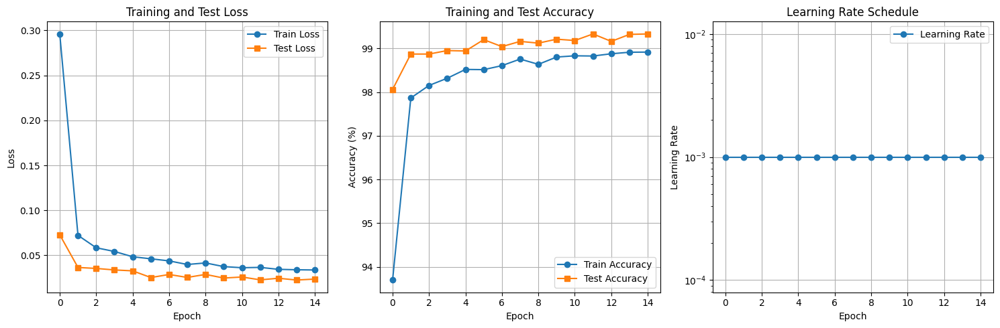


Model saved as 'mnist_model_checkpoint.pth'


In [ ]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)

In [17]:
class ConfigurableMNISTModel(nn.Module):
    """Your model with configurable dropout rates"""
    def __init__(self):
        super(ConfigurableMNISTModel, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),


            nn.Conv2d(12, 12, kernel_size=3, bias=False),
            nn.BatchNorm2d(12),
            nn.ReLU(inplace=True),
            # nn.Dropout(0.05),

            nn.MaxPool2d(kernel_size=2),

            nn.Conv2d(12, 24, kernel_size=3, bias=False),
            nn.BatchNorm2d(24),
            nn.ReLU(inplace=True),

            nn.AdaptiveAvgPool2d(1),

            nn.Conv2d(24, 10, kernel_size=1, bias=False),

        )


    def forward(self, x):
        x = self.conv1(x)              # Shape: [batch, 10, 14, 14]
        x = x.view(-1, 10)
        return x

MNIST Training Configuration
batch_size: 32
epochs: 15
lr: 0.001
weight_decay: 0.0001
scheduler: plateau
patience: 3
factor: 0.5
min_lr: 1e-06
dropout: (0.05, 0.05, 0.05)

Loading MNIST dataset...
Train samples: 60000
Test samples: 10000

MODEL ARCHITECTURE SUMMARY
Model parameters: 6,972
Dropout rates: (0.05, 0.05, 0.05)

Detailed Model Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 12, 26, 26]             108
       BatchNorm2d-2           [-1, 12, 26, 26]              24
              ReLU-3           [-1, 12, 26, 26]               0
            Conv2d-4           [-1, 12, 24, 24]           1,296
       BatchNorm2d-5           [-1, 12, 24, 24]              24
              ReLU-6           [-1, 12, 24, 24]               0
         MaxPool2d-7           [-1, 12, 12, 12]               0
            Conv2d-8           [-1, 12, 10, 10]           1,296
       Bat

Testing: 100%|██████████| 313/313 [00:05<00:00, 55.54it/s, Loss=0.0106, Acc=98.72%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.2791 | Train Acc: 94.38%
Test Loss:  0.0458 | Test Acc:  98.72%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [2/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 58.90it/s, Loss=0.0087, Acc=99.08%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0629 | Train Acc: 98.17%
Test Loss:  0.0327 | Test Acc:  99.08%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [3/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 48.88it/s, Loss=0.0022, Acc=99.20%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0496 | Train Acc: 98.47%
Test Loss:  0.0266 | Test Acc:  99.20%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [4/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 61.18it/s, Loss=0.0008, Acc=99.11%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0437 | Train Acc: 98.65%
Test Loss:  0.0248 | Test Acc:  99.11%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [5/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 49.00it/s, Loss=0.0090, Acc=99.33%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0393 | Train Acc: 98.77%
Test Loss:  0.0232 | Test Acc:  99.33%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [6/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 62.31it/s, Loss=0.0013, Acc=99.31%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0357 | Train Acc: 98.90%
Test Loss:  0.0217 | Test Acc:  99.31%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [7/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 52.95it/s, Loss=0.0002, Acc=99.21%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0339 | Train Acc: 98.94%
Test Loss:  0.0220 | Test Acc:  99.21%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [8/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 50.31it/s, Loss=0.0005, Acc=99.37%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0307 | Train Acc: 99.02%
Test Loss:  0.0215 | Test Acc:  99.37%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [9/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 61.36it/s, Loss=0.0004, Acc=99.36%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0309 | Train Acc: 99.07%
Test Loss:  0.0224 | Test Acc:  99.36%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [10/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:06<00:00, 49.55it/s, Loss=0.0001, Acc=99.22%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0291 | Train Acc: 99.09%
Test Loss:  0.0229 | Test Acc:  99.22%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [11/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 61.00it/s, Loss=0.0002, Acc=99.42%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0274 | Train Acc: 99.16%
Test Loss:  0.0193 | Test Acc:  99.42%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [12/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 55.91it/s, Loss=0.0001, Acc=99.35%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0271 | Train Acc: 99.15%
Test Loss:  0.0203 | Test Acc:  99.35%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [13/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 53.21it/s, Loss=0.0001, Acc=99.38%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0252 | Train Acc: 99.19%
Test Loss:  0.0211 | Test Acc:  99.38%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [14/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 55.56it/s, Loss=0.0001, Acc=99.19%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0240 | Train Acc: 99.22%
Test Loss:  0.0252 | Test Acc:  99.19%
Learning Rate: 0.001000
--------------------------------------------------

Epoch [15/15]
Learning Rate: 0.001000


Testing: 100%|██████████| 313/313 [00:05<00:00, 54.47it/s, Loss=0.0000, Acc=99.39%]



--------------------------------------------------
EPOCH SUMMARY
--------------------------------------------------
Train Loss: 0.0250 | Train Acc: 99.20%
Test Loss:  0.0202 | Test Acc:  99.39%
Learning Rate: 0.000500
--------------------------------------------------

TRAINING COMPLETED
Total training time: 1078.14 seconds
Best train accuracy: 99.22%
Best test accuracy: 99.42%
Final train accuracy: 99.20%
Final test accuracy: 99.39%


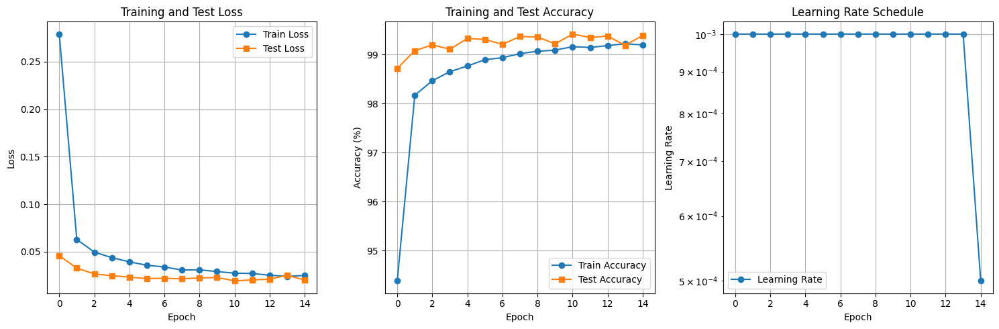


Model saved as 'mnist_model_checkpoint.pth'


In [18]:
if __name__ == "__main__":
        # Initialize model
    model = ConfigurableMNISTModel().to(device)
    model, train_acc, test_acc = main(model)